<a href="https://colab.research.google.com/github/larissavaladao/py6s_harmonize_sample/blob/main/manage_data/data_analysis2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import packages

In [42]:
import pandas as pd
import seaborn as sns
import os
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

In [43]:
# Configure matplotlib visualization parameters for consistency across all plots
plt.rcParams['font.size'] = 14  # Base font size
plt.rcParams['axes.labelsize'] = 14  # Axis label font size
plt.rcParams['axes.titlesize'] = 14  # Plot title font size
plt.rcParams['xtick.labelsize'] = 14  # X-axis tick label size
plt.rcParams['ytick.labelsize'] = 14  # Y-axis tick label size
plt.rcParams['legend.fontsize'] = 14  # Legend font size

In [44]:
# from google.colab import drive
# drive.mount('/content/drive')

# Import data

In [45]:
data_directory = 'C:/Users/l_v_v/Documents/GitHub/time_series_curuai/datasets/Landsat Sampling/Merged Landsat Data'

In [46]:
min_date_path = 'min_date.csv'
ld8_path = 'LD8_priority.csv'

In [47]:
df_ld8 = pd.read_csv(os.path.join(data_directory, ld8_path)).drop(['Unnamed: 0'],axis=1)

In [48]:
df_ld8.dtypes

CHLOROPHYLL           float64
CHLOROPHYLL_A          object
CHLOROPHYLL_B          object
CLOUD_COVER           float64
DEPTH_CLASS             int64
DOC                   float64
ID                      int64
LATITUDE              float64
LOCATION               object
LONGITUDE             float64
MISSION                object
N_TOTAL               float64
N_TOTAL_DISSOLVED     float64
POC                    object
P_ORGANIC              object
P_TOTAL               float64
SAMPLE_SITE             int64
SAMPLING_DEPTH        float64
SILICA                float64
SPM                   float64
TOC                   float64
TOTAL_DEPTH           float64
TURBIDITY              object
WATER_PERIOD           object
blue_max              float64
blue_mean             float64
blue_median           float64
blue_min              float64
blue_stdDev           float64
count_pixel             int64
datetime               object
dif_date_point        float64
green_max             float64
green_mean

In [49]:
df_minDate = pd.read_csv(os.path.join(data_directory, min_date_path)).drop(['Unnamed: 0'],axis=1)

In [50]:
df_minDate.dtypes 

CHLOROPHYLL           float64
CHLOROPHYLL_A          object
CHLOROPHYLL_B          object
CLOUD_COVER           float64
DEPTH_CLASS             int64
DOC                   float64
ID                      int64
LATITUDE              float64
LOCATION               object
LONGITUDE             float64
MISSION                object
N_TOTAL               float64
N_TOTAL_DISSOLVED     float64
POC                    object
P_ORGANIC              object
P_TOTAL               float64
SAMPLE_SITE             int64
SAMPLING_DEPTH        float64
SILICA                float64
SPM                   float64
TOC                   float64
TOTAL_DEPTH           float64
TURBIDITY              object
WATER_PERIOD           object
blue_max              float64
blue_mean             float64
blue_median           float64
blue_min              float64
blue_stdDev           float64
count_pixel             int64
datetime               object
dif_date_point        float64
green_max             float64
green_mean

In [51]:
df_minDate = df_minDate.replace(['< 0,01','< 0,001','< 0,0001','< LD'],0).copy()

df_ld8 = df_ld8.replace(['< 0,01','< 0,001','< 0,0001','< LD'],0).copy()


In [52]:
col_types = {'CHLOROPHYLL_B': 'float64',
             'CHLOROPHYLL_A': 'float64',
 'POC': 'float64',
 'P_ORGANIC': 'float64',
 'P_TOTAL': 'float64',
 'TURBIDITY': 'float64'}
df_minDate = df_minDate.astype(col_types).rename(columns={"SPM": "TSS"})
df_ld8 = df_ld8.astype(col_types).rename(columns={"SPM": "TSS"})

# Compare TSS data

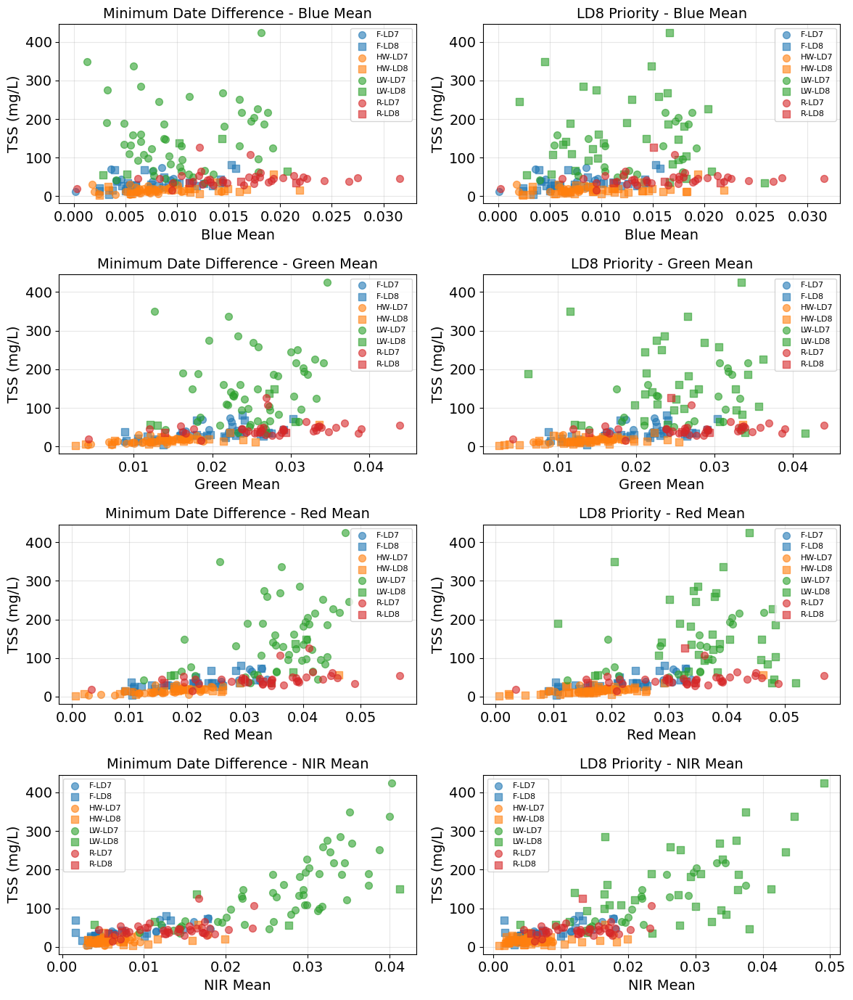

In [53]:
# Create 4x2 subplot: 4 rows (bands) x 2 columns (datasets)
# Each WATER_PERIOD gets a unique color, each satellite gets a unique marker

fig, axes = plt.subplots(4, 2, figsize=(12, 14))

bands = ['blue_mean', 'green_mean', 'red_mean', 'nir_mean']
datasets = [df_minDate, df_ld8]
titles = ['Minimum Date Difference', 'LD8 Priority']

# Define consistent colors for each WATER_PERIOD (across all subplots)
water_periods = sorted(df_minDate['WATER_PERIOD'].unique())
color_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']
colors = {period: color_palette[i % len(color_palette)] for i, period in enumerate(water_periods)}

# Define consistent markers for each satellite
satellites = sorted(df_minDate['satellite'].unique())
markers = {sat: marker for sat, marker in zip(satellites, ['o', 's', '^', 'D', 'v', '<', '>', 'P'])}

# Loop: rows = bands, columns = datasets
for row, band in enumerate(bands):
    for col, (data, title) in enumerate(zip(datasets, titles)):
        ax = axes[row, col]
        
        # Create scatter plot with consistent colors and markers
        for water_period in sorted(data['WATER_PERIOD'].unique()):
            for satellite in sorted(data['satellite'].unique()):
                subset = data[(data['WATER_PERIOD'] == water_period) & (data['satellite'] == satellite)]
                ax.scatter(subset[band], subset['TSS'], 
                          color=colors[water_period], 
                          marker=markers[satellite],
                          label=f'{water_period}-{satellite}', 
                          alpha=0.6,
                          s=50)
        
        if band == 'blue_mean':
            b = 'Blue Mean'
        elif band == 'green_mean':
            b = 'Green Mean'
        elif band == 'red_mean':
            b = 'Red Mean'
        elif band == 'nir_mean':
            b = 'NIR Mean'
        ax.set_xlabel(b)
        ax.set_ylabel('TSS (mg/L)')
        ax.set_title(f'{title} - {b}')
        ax.legend(fontsize=8, loc='best')
        ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## regressions

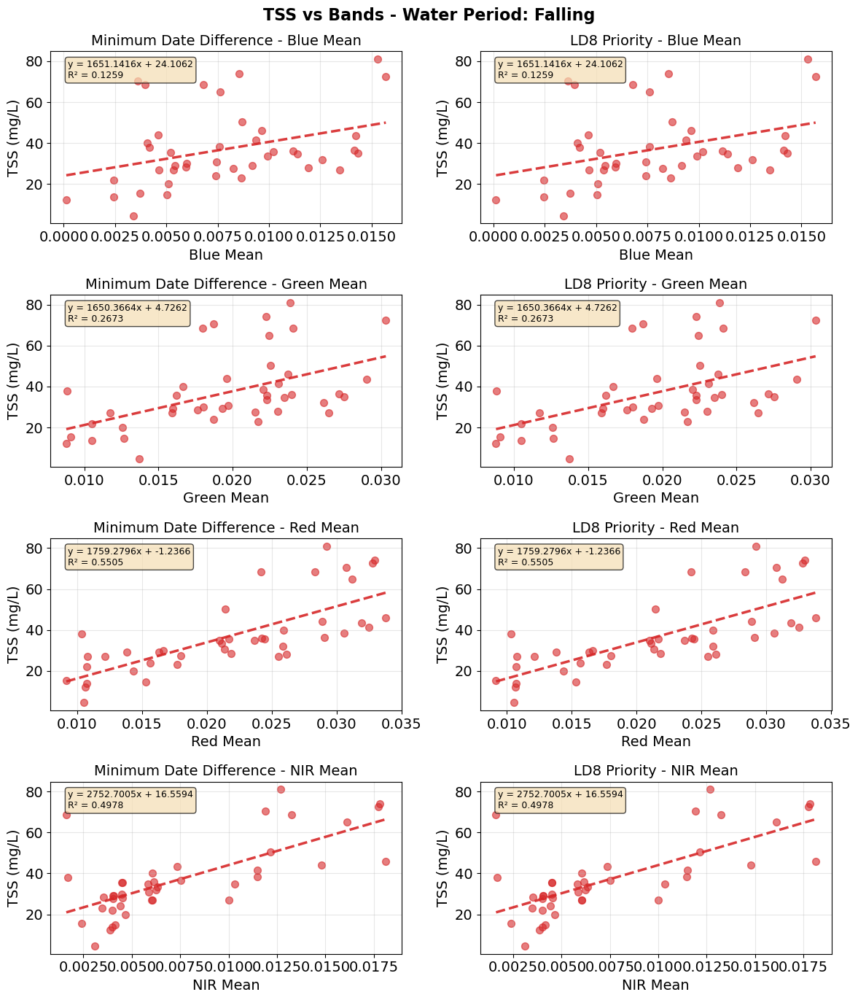

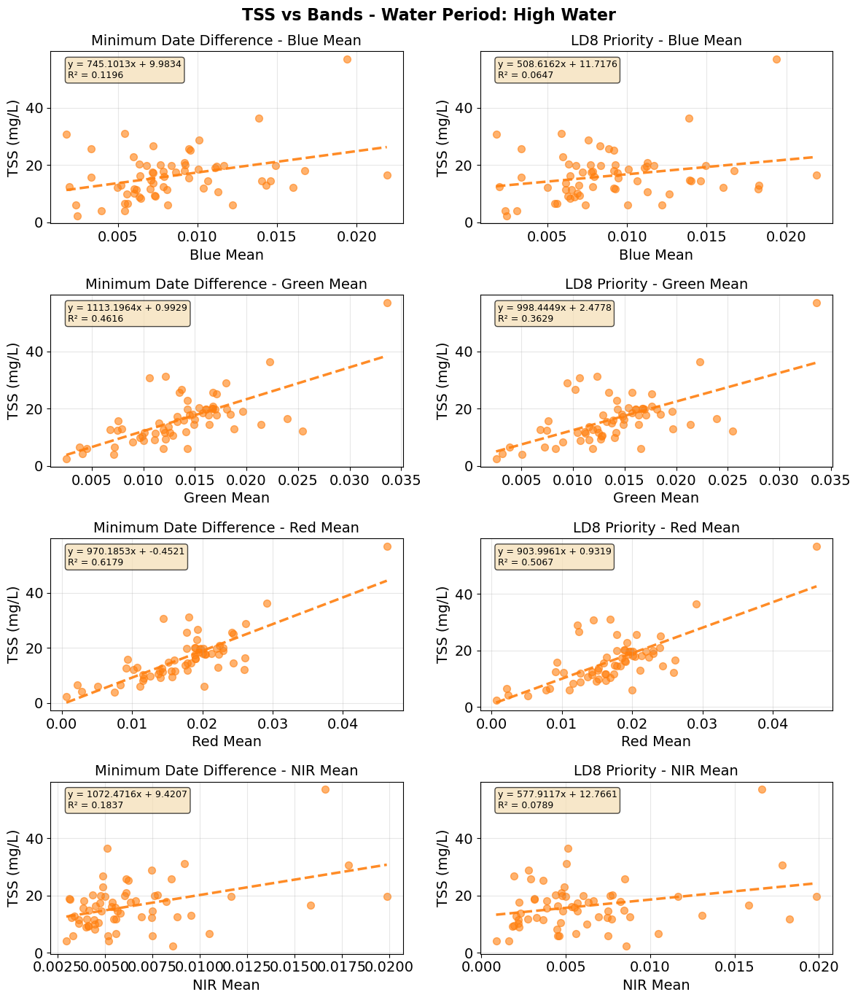

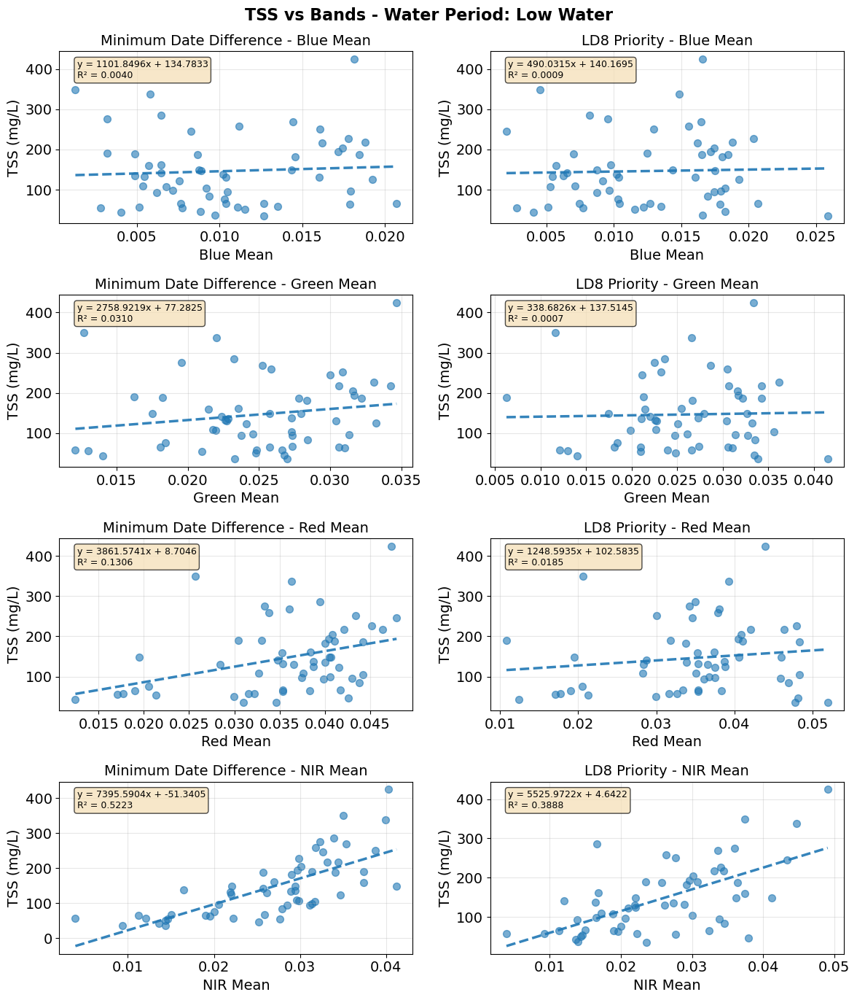

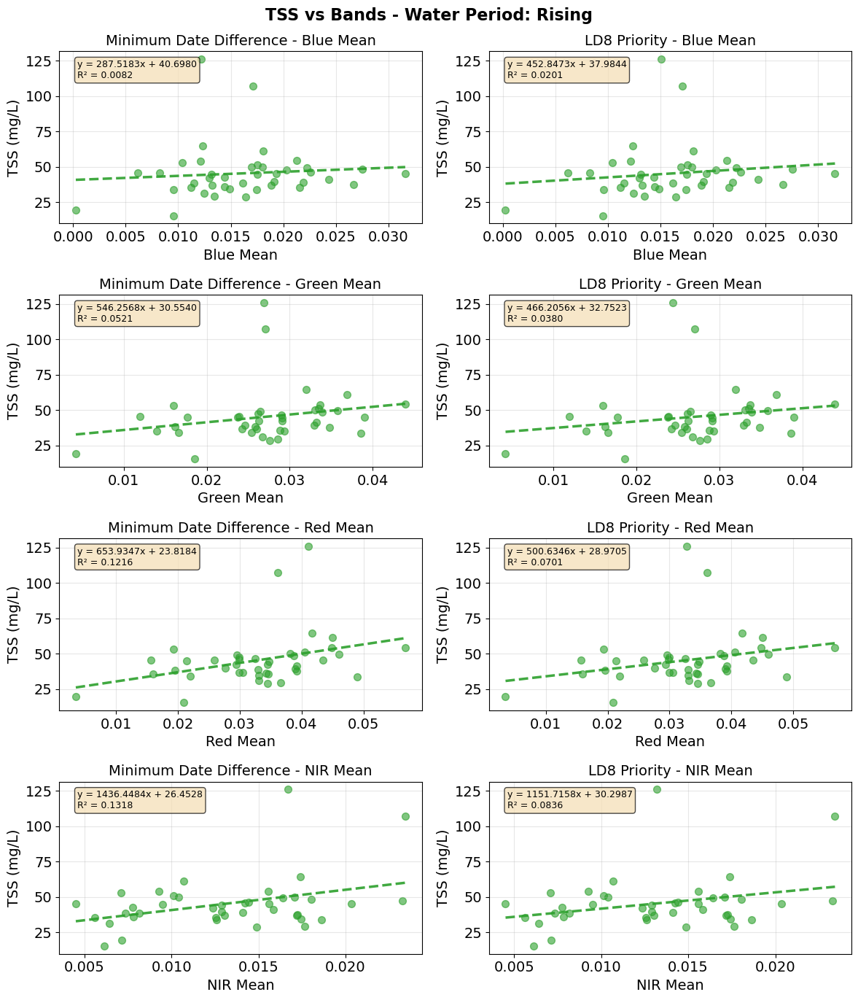

In [54]:
# Create 4x2 subplots for each WATER_PERIOD separately
# Each subplot shows scatter plot + regression line with equation and R² value
import numpy as np

bands = ['blue_mean', 'green_mean', 'red_mean', 'nir_mean']
datasets = [df_minDate, df_ld8]
titles = ['Minimum Date Difference', 'LD8 Priority']

# Define consistent colors for each WATER_PERIOD
water_periods = sorted(df_minDate['WATER_PERIOD'].unique())
color_palette = ['#d62728', '#ff7f0e', '#1f77b4', '#2ca02c']
colors = {period: color_palette[i % len(color_palette)] for i, period in enumerate(water_periods)}

# Create a 4x2 figure for each water period
for wp in water_periods:
    fig, axes = plt.subplots(4, 2, figsize=(12, 14))
    if  wp == "F":
        x = "Falling" 
    elif wp == "R":
        x = "Rising" 
    elif wp == "LW":
        x = "Low Water"
    else: 
        x = "High Water"
    fig.suptitle(f'TSS vs Bands - Water Period: {x}', fontsize=16, fontweight='bold')
    
    # Loop: rows = bands, columns = datasets
    for row, band in enumerate(bands):
        for col, (data, title) in enumerate(zip(datasets, titles)):
            ax = axes[row, col]
            
            # Filter data for this water period only
            subset = data[data['WATER_PERIOD'] == wp].dropna(subset=[band, 'TSS'])
            
            if len(subset) > 0:
                # Plot scatter
                ax.scatter(subset[band], subset['TSS'], 
                          color=colors[wp], 
                          marker='o',
                          alpha=0.6,
                          s=50)
                
                # Add regression line if enough data points
                if len(subset) > 1:
                    z = np.polyfit(subset[band], subset['TSS'], 1)
                    p = np.poly1d(z)
                    x_line = np.linspace(subset[band].min(), subset[band].max(), 100)
                    ax.plot(x_line, p(x_line), color=colors[wp], linestyle='--', linewidth=2.5, alpha=0.9)
                    
                    # Calculate R² value
                    y_pred = p(subset[band])
                    ss_res = np.sum((subset['TSS'] - y_pred) ** 2)
                    ss_tot = np.sum((subset['TSS'] - subset['TSS'].mean()) ** 2)
                    r_squared = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
                    
                    # Extract slope and intercept
                    slope = z[0]
                    intercept = z[1]
                    
                    # Create equation string
                    equation = f'y = {slope:.4f}x + {intercept:.4f}'
                    r2_str = f'R² = {r_squared:.4f}'
                    
                    # Display equation and R² on plot
                    ax.text(0.05, 0.95, f'{equation}\n{r2_str}', 
                           transform=ax.transAxes, fontsize=9,
                           verticalalignment='top', 
                           bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))
            if band == 'blue_mean':
                b = 'Blue Mean'
            elif band == 'green_mean':
                b = 'Green Mean'
            elif band == 'red_mean':
                b = 'Red Mean'
            elif band == 'nir_mean':
                b = 'NIR Mean'
            ax.set_xlabel(b)
            ax.set_ylabel('TSS (mg/L)')
            ax.set_title(f'{title} - {b}')
            ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# VIZUALIZE TSS

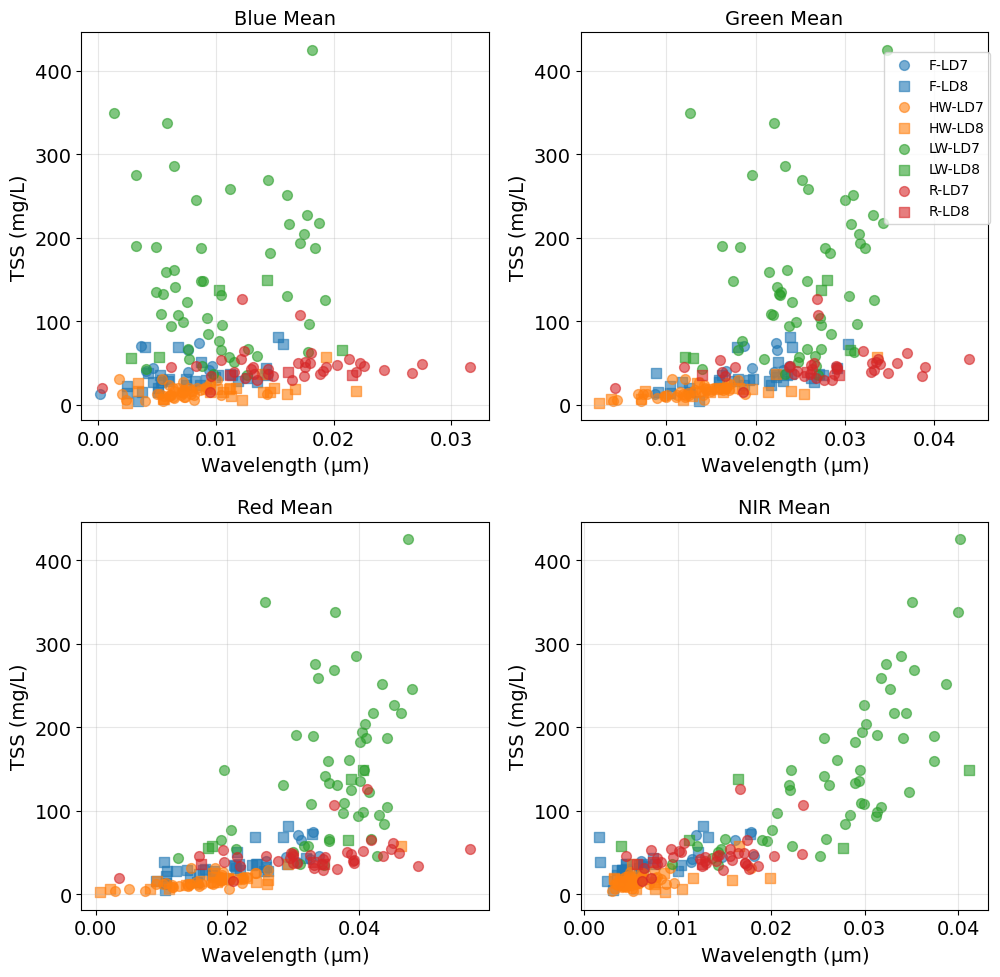

In [55]:
# Create 2x2 figure: one subplot per band using `df_minDate` only
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

bands = ['blue_mean', 'green_mean', 'red_mean', 'nir_mean']

data = df_minDate

# Define consistent colors for each WATER_PERIOD (across all subplots)
water_periods = sorted(data['WATER_PERIOD'].unique())
color_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']
colors = {period: color_palette[i % len(color_palette)] for i, period in enumerate(water_periods)}

# Define consistent markers for each satellite
satellites = sorted(data['satellite'].unique())
markers = {sat: marker for sat, marker in zip(satellites, ['o', 's', '^', 'D', 'v', '<', '>', 'P'])}

axes = axes.flatten()

for i, band in enumerate(bands):
    ax = axes[i]
    # Create scatter plot with consistent colors and markers for df_minDate only
    for water_period in sorted(data['WATER_PERIOD'].unique()):
        for satellite in sorted(data['satellite'].unique()):
            subset = data[(data['WATER_PERIOD'] == water_period) & (data['satellite'] == satellite)]
            ax.scatter(subset[band], subset['TSS'],
                       color=colors[water_period],
                       marker=markers[satellite],
                       label=f'{water_period}-{satellite}',
                       alpha=0.6,
                       s=50)
    
    if band == 'blue_mean':
        b = 'Blue Mean'
    elif band == 'green_mean':
        b = 'Green Mean'
    elif band == 'red_mean':
        b = 'Red Mean'
    elif band == 'nir_mean':
        b = 'NIR Mean'
    ax.set_xlabel(r"Wavelength ($\rm{\mu m}$)")
    ax.set_ylabel('TSS (mg/L)')
    ax.set_title(f'{b}')
    ax.grid(True, alpha=0.3)

# Single legend to the right
handles, labels = axes[-1].get_legend_handles_labels()
fig.legend(handles, labels, loc='center right', bbox_to_anchor=(0.84, 0.85), fontsize=10)

plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.savefig(os.path.join(data_directory, 'TSS_vs_Bands.png'),dpi=300)
plt.show()
plt.close()

## regressions

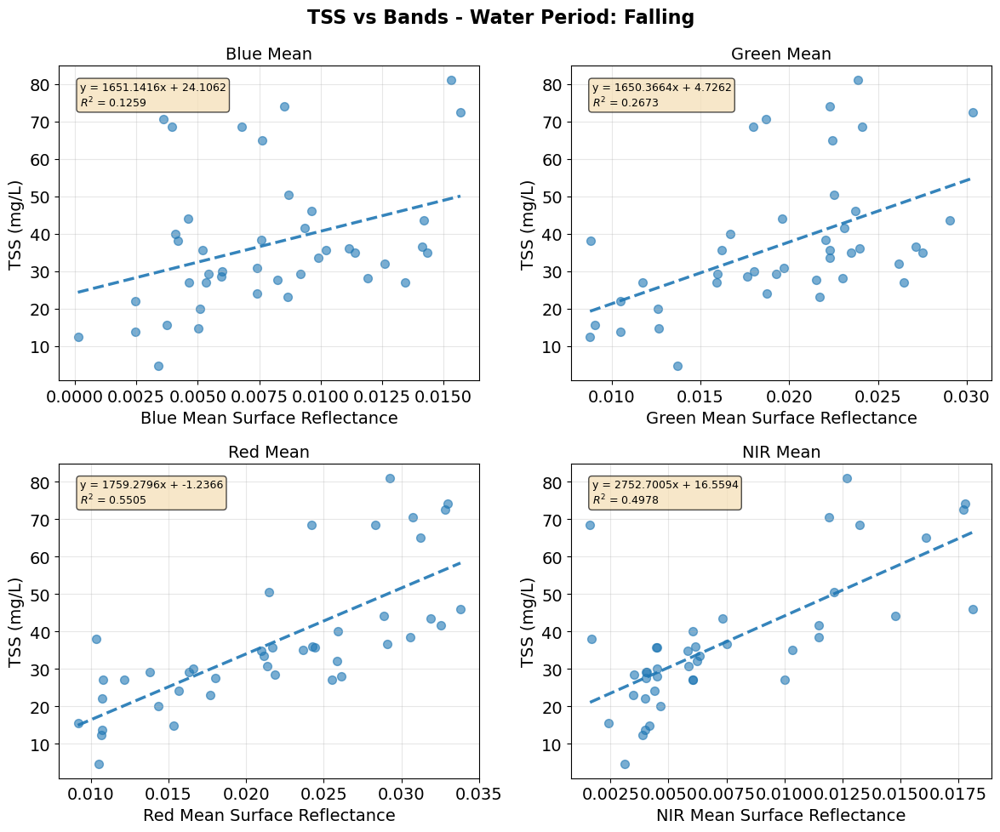

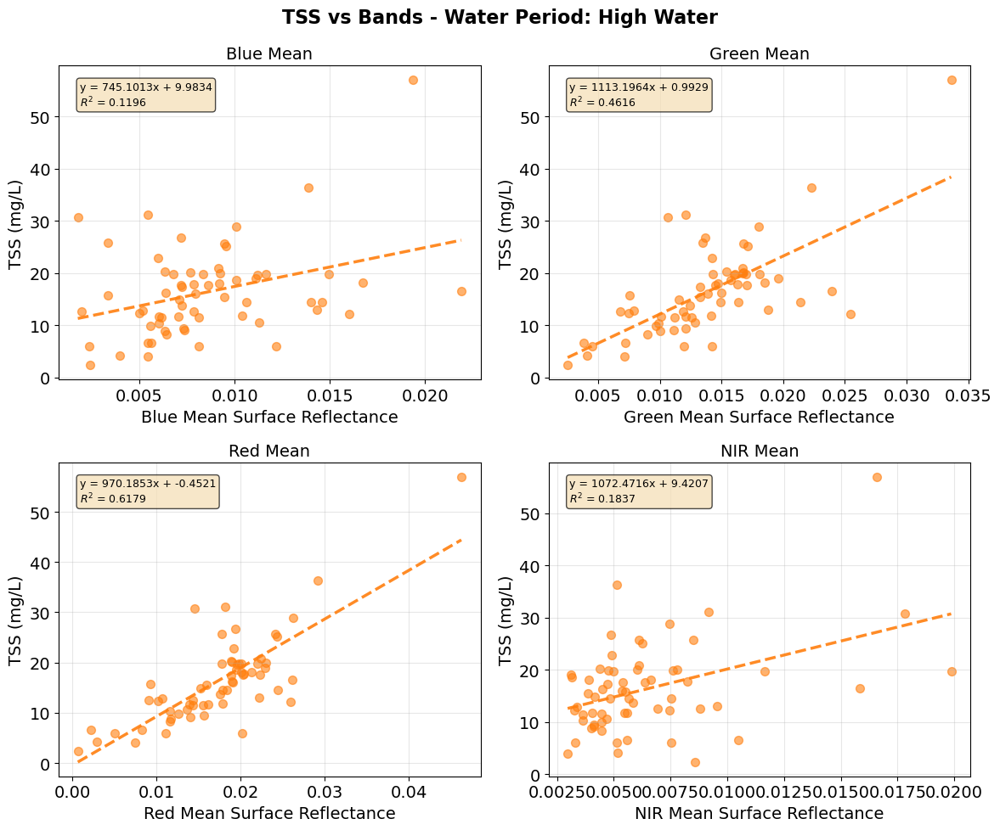

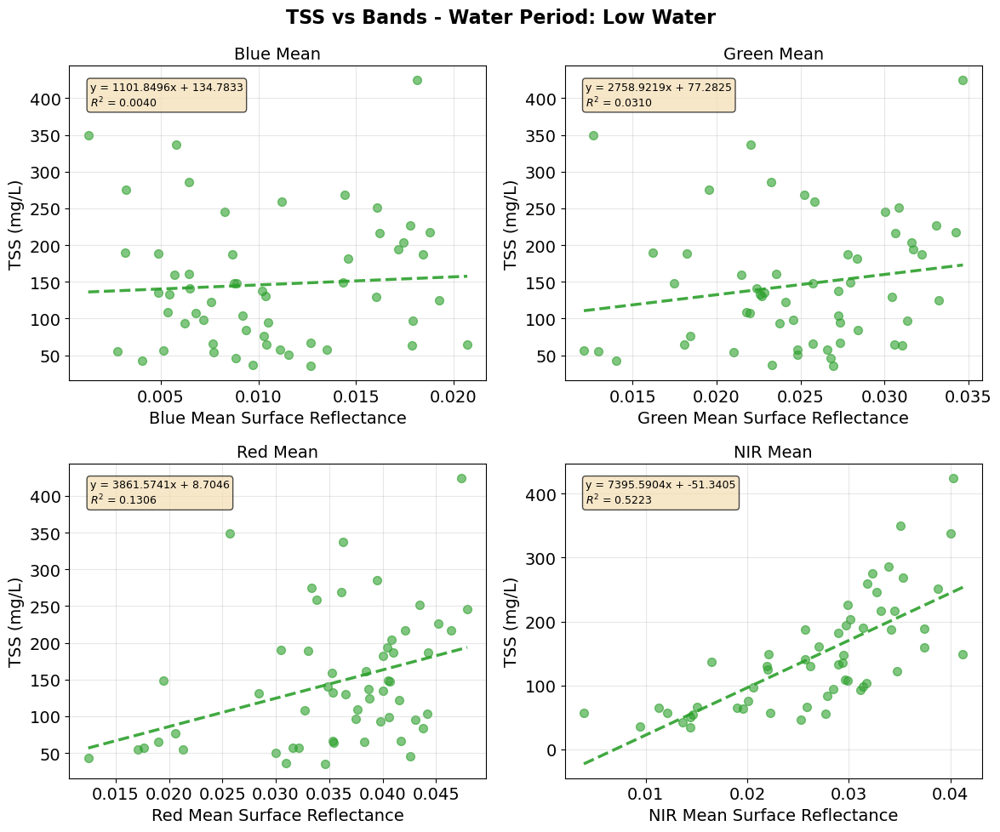

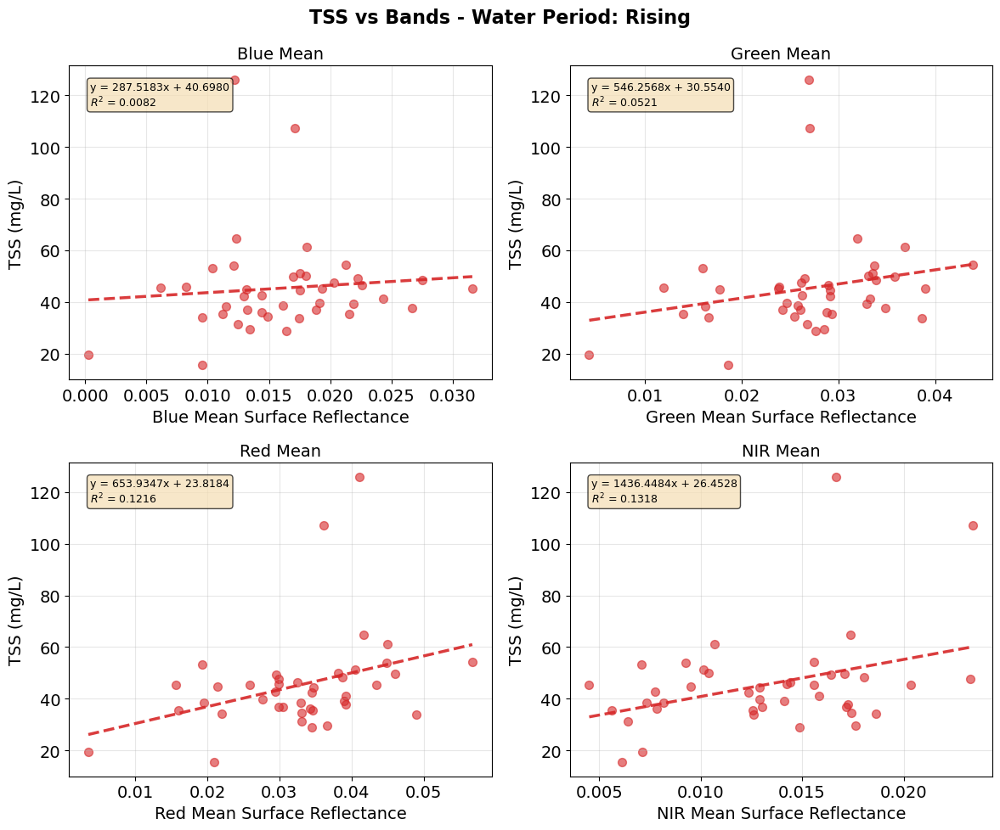

In [56]:
# Create 2x2 figure: one figure per WATER_PERIOD, one subplot per band
bands = ['blue_mean', 'green_mean', 'red_mean', 'nir_mean']
data = df_minDate

# Define consistent colors for each WATER_PERIOD
water_periods = sorted(data['WATER_PERIOD'].unique())
color_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
colors = {period: color_palette[i % len(color_palette)] for i, period in enumerate(water_periods)}

# Mappings for cleaner code (replaces long if/else blocks)
wp_map = {
    "F": "Falling",
    "R": "Rising",
    "LW": "Low Water",
    "HW": "High Water"
}

band_map = {
    'blue_mean': 'Blue Mean',
    'green_mean': 'Green Mean',
    'red_mean': 'Red Mean',
    'nir_mean': 'NIR Mean'
}

# --- Main Loop ---
for wp in water_periods:
    # Everything related to a specific plot MUST be indented inside this loop
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    
    # Get full name, default to code if not in map
    wp_name = wp_map.get(wp, "High Water") 
    
    fig.suptitle(f'TSS vs Bands - Water Period: {wp_name}', fontsize=16, fontweight='bold')
    axes = axes.flatten()

    for i, band in enumerate(bands):
        ax = axes[i]
        
        # Filter data for this water period and band
        subset = data[data['WATER_PERIOD'] == wp].dropna(subset=[band, 'TSS'])
        
        if len(subset) > 0:
            # Plot scatter
            ax.scatter(subset[band], subset['TSS'], 
                      color=colors[wp], 
                      marker='o',
                      alpha=0.6,
                      s=50)
            
            # Add regression line if enough data points
            if len(subset) > 1:
                z = np.polyfit(subset[band], subset['TSS'], 1)
                p = np.poly1d(z)
                x_line = np.linspace(subset[band].min(), subset[band].max(), 100)
                ax.plot(x_line, p(x_line), color=colors[wp], linestyle='--', linewidth=2.5, alpha=0.9)
                
                # Calculate R² value
                y_pred = p(subset[band])
                ss_res = np.sum((subset['TSS'] - y_pred) ** 2)
                ss_tot = np.sum((subset['TSS'] - subset['TSS'].mean()) ** 2)
                r_squared = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
                
                # Extract slope and intercept
                slope = z[0]
                intercept = z[1]
                
                # Create equation string
                equation = f'y = {slope:.4f}x + {intercept:.4f}'
                r2_str = f'$R^2$ = {r_squared:.4f}'
                
                # Display equation and R² on plot
                ax.text(0.05, 0.95, f'{equation}\n{r2_str}', 
                       transform=ax.transAxes, fontsize=9,
                       verticalalignment='top', 
                       bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))
        
        # Set Labels and Titles
        clean_band_name = band_map.get(band, band)
        
        # Note: Changed xlabel to Reflectance, as Wavelength usually implies the X-axis is the spectrum (400-900nm)
        ax.set_xlabel(f"{clean_band_name} Surface Reflectance") 
        ax.set_ylabel('TSS (mg/L)')
        ax.set_title(f'{clean_band_name}')
        ax.grid(True, alpha=0.3)

    plt.tight_layout()
    
    # Ensure data_directory exists or define it before this block
    plt.savefig(os.path.join(data_directory, f'TSS_{wp}.png'), dpi=300)
    
    plt.show() 
    # Closing the figure clears memory for the next loop iteration
    plt.close(fig)

# Vizualize correlations

In [57]:
df_subset = df_minDate[['TSS','blue_mean',
       'green_mean',
       'nir_mean',
       'red_mean',
       'WATER_PERIOD',
       'LOCATION']].copy()

In [58]:
n = 0
for i in df_subset['LOCATION'].unique():
    df_subset['LOCATION'] = df_subset['LOCATION'].replace(i,n)
    n += 1

df_subset["LOCATION"] = df_subset["LOCATION"].astype('int8')

C:\Users\l_v_v\AppData\Local\Temp\ipykernel_74484\2938480634.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_subset['LOCATION'] = df_subset['LOCATION'].replace(i,n)


In [59]:
n = 0
for i in df_subset['WATER_PERIOD'].unique():
    df_subset['WATER_PERIOD'] = df_subset['WATER_PERIOD'].replace(i,n)
    n += 1

df_subset["WATER_PERIOD"] = df_subset["WATER_PERIOD"].astype('int8')

C:\Users\l_v_v\AppData\Local\Temp\ipykernel_74484\2343873752.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_subset['WATER_PERIOD'] = df_subset['WATER_PERIOD'].replace(i,n)


In [60]:
df_subset.columns = ['TSS', 'Blue', 'Green', 'NIR', 'Red',
       'Water Period', 'Location']

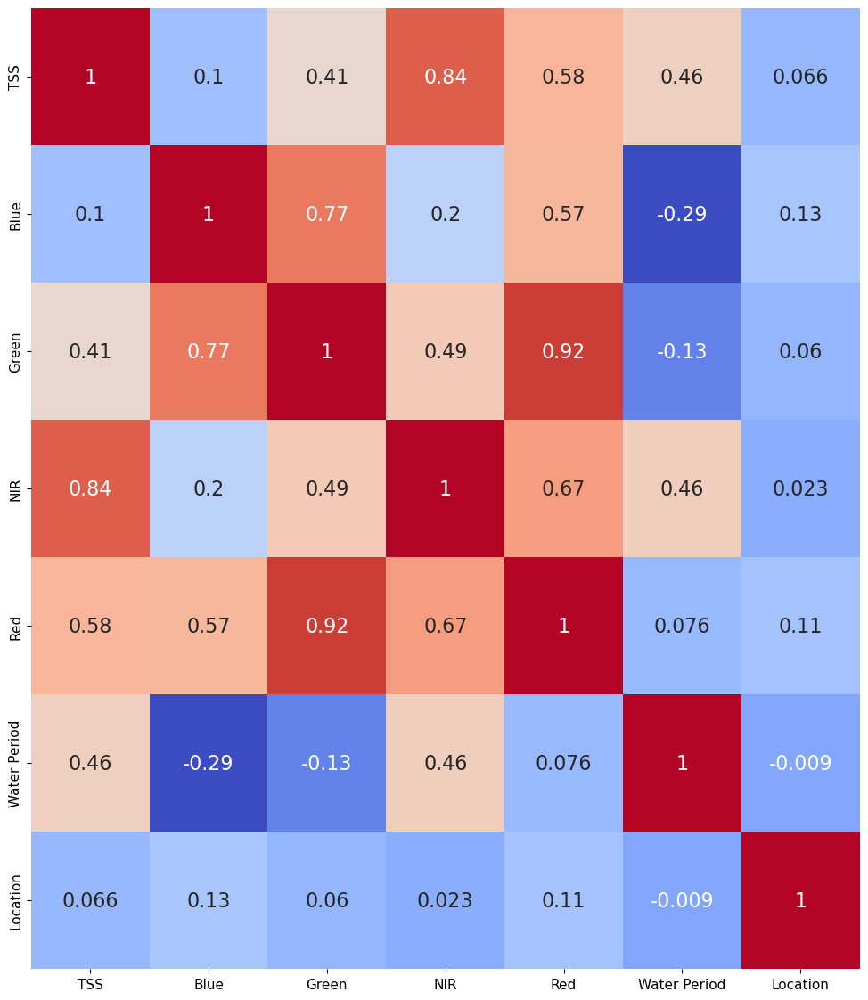

In [61]:
# Configure matplotlib visualization parameters for consistency across all plots
plt.rcParams['font.size'] = 16  # Base font size
plt.rcParams['xtick.labelsize'] = 11  # X-axis tick label size
plt.rcParams['ytick.labelsize'] = 11  # Y-axis tick label size
plt.rcParams['legend.fontsize'] = 14  # Legend font size
plt.figure(figsize=(12,14))
sns.heatmap(df_subset.corr(), annot=True, cmap='coolwarm',cbar=False)
plt.savefig(os.path.join(data_directory, 'correlation_matrix.png'),dpi=500)
plt.show()

In [62]:
# Configure matplotlib visualization parameters for consistency across all plots
plt.rcParams['font.size'] = 14  # Base font size
plt.rcParams['axes.labelsize'] = 14  # Axis label font size
plt.rcParams['axes.titlesize'] = 14  # Plot title font size
plt.rcParams['xtick.labelsize'] = 14  # X-axis tick label size
plt.rcParams['ytick.labelsize'] = 14  # Y-axis tick label size
plt.rcParams['legend.fontsize'] = 14  # Legend font size

# Chlorophyll

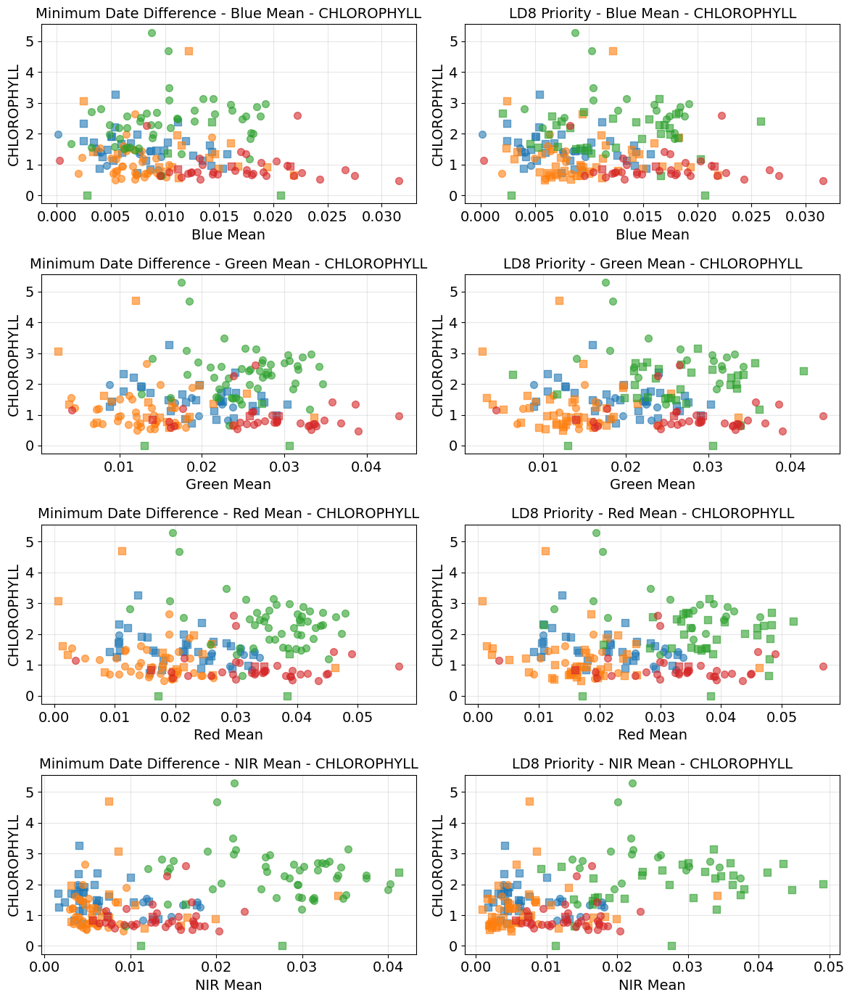

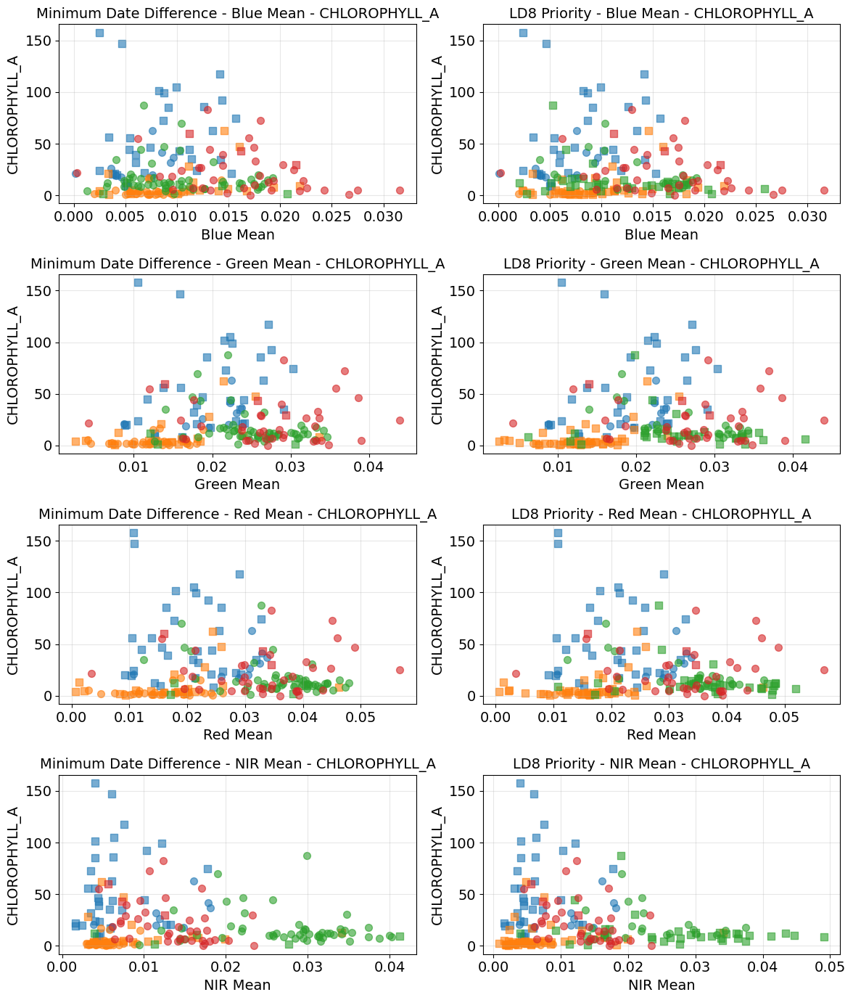

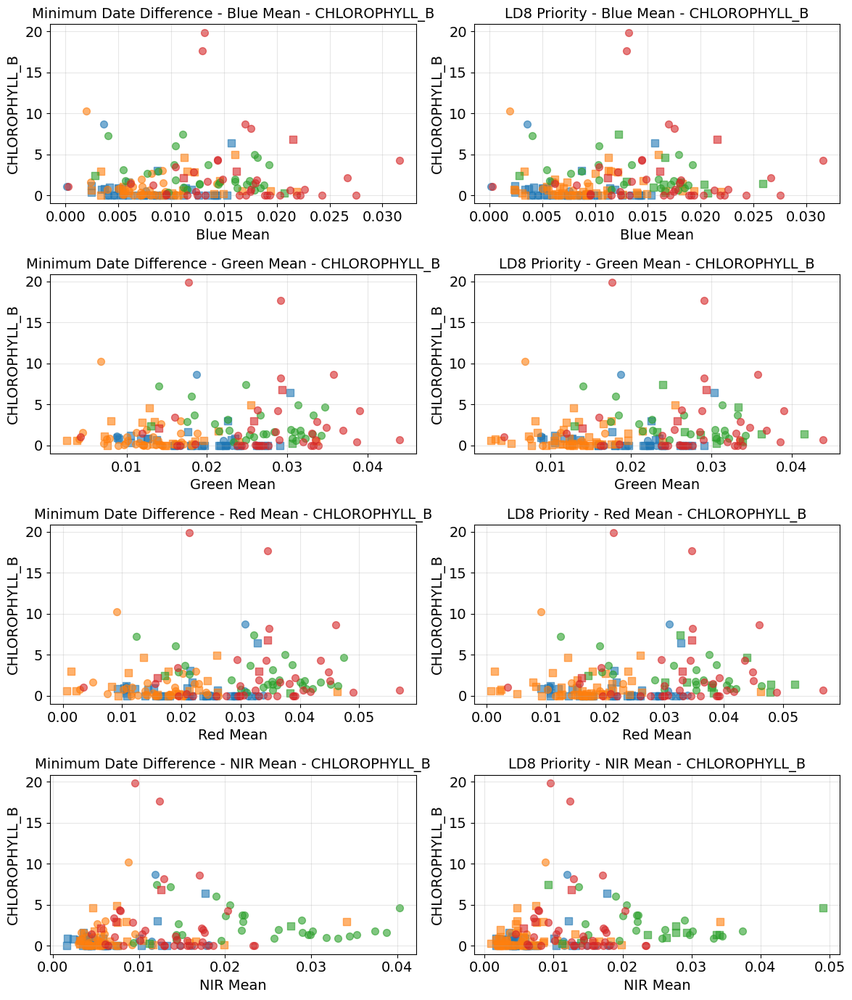

In [63]:
var_c = ['CHLOROPHYLL', 'CHLOROPHYLL_A', 'CHLOROPHYLL_B']
# Create 4x2 subplot: 4 rows (bands) x 2 columns (datasets)
# Each WATER_PERIOD gets a unique color, each satellite gets a unique marker
for var in var_c:
    fig, axes = plt.subplots(4, 2, figsize=(12, 14))

    bands = ['blue_mean', 'green_mean', 'red_mean', 'nir_mean']
    datasets = [df_minDate, df_ld8]
    titles = ['Minimum Date Difference', 'LD8 Priority']

    # Define consistent colors for each WATER_PERIOD (across all subplots)
    water_periods = sorted(df_minDate['WATER_PERIOD'].unique())
    color_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']
    colors = {period: color_palette[i % len(color_palette)] for i, period in enumerate(water_periods)}

    # Define consistent markers for each satellite
    satellites = sorted(df_minDate['satellite'].unique())
    markers = {sat: marker for sat, marker in zip(satellites, ['o', 's', '^', 'D', 'v', '<', '>', 'P'])}

    # Loop: rows = bands, columns = datasets
    for row, band in enumerate(bands):
        for col, (data, title) in enumerate(zip(datasets, titles)):
            ax = axes[row, col]
            data = data.dropna(subset=[band, var])
            
            # Create scatter plot with consistent colors and markers
            for water_period in sorted(data['WATER_PERIOD'].unique()):
                for satellite in sorted(data['satellite'].unique()):
                    subset = data[(data['WATER_PERIOD'] == water_period) & (data['satellite'] == satellite)]
                    ax.scatter(subset[band], subset[var], 
                            color=colors[water_period], 
                            marker=markers[satellite],
                            label=f'{water_period}-{satellite}', 
                            alpha=0.6,
                            s=50)
            
            if band == 'blue_mean':
                b = 'Blue Mean'
            elif band == 'green_mean':
                b = 'Green Mean'
            elif band == 'red_mean':
                b = 'Red Mean'
            elif band == 'nir_mean':
                b = 'NIR Mean'
            ax.set_xlabel(b)
            ax.set_ylabel(var)
            ax.set_title(f'{title} - {b} - {var}')
            ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

## regressions

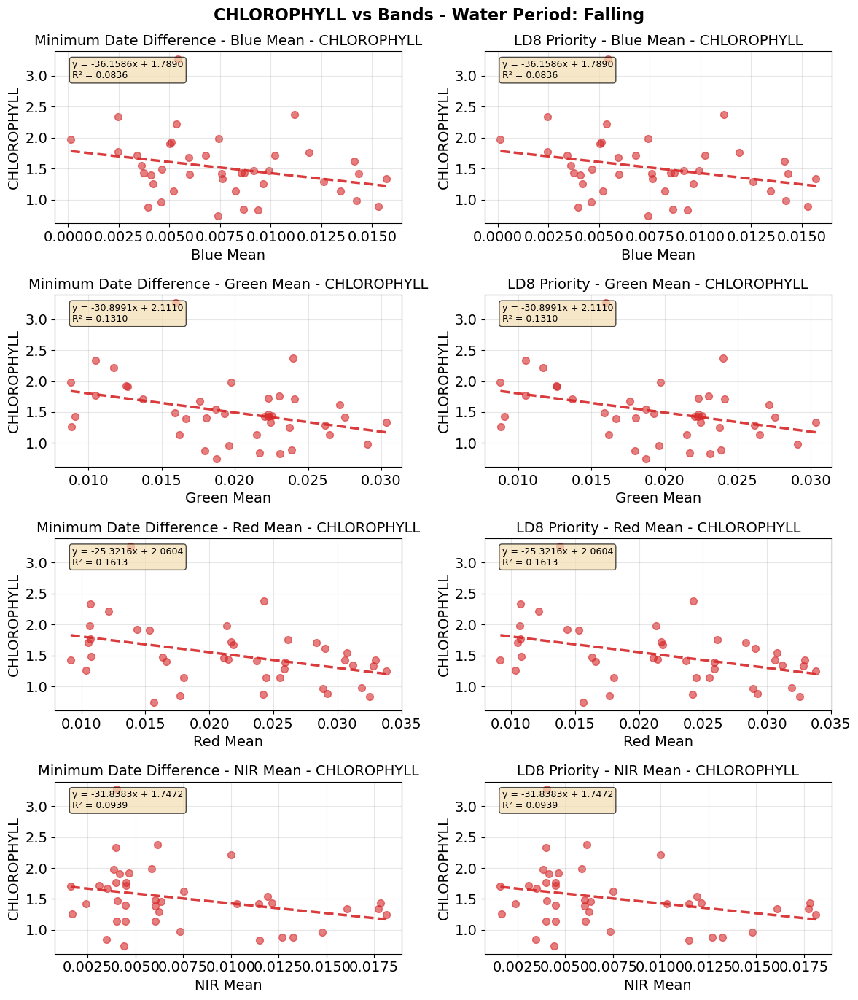

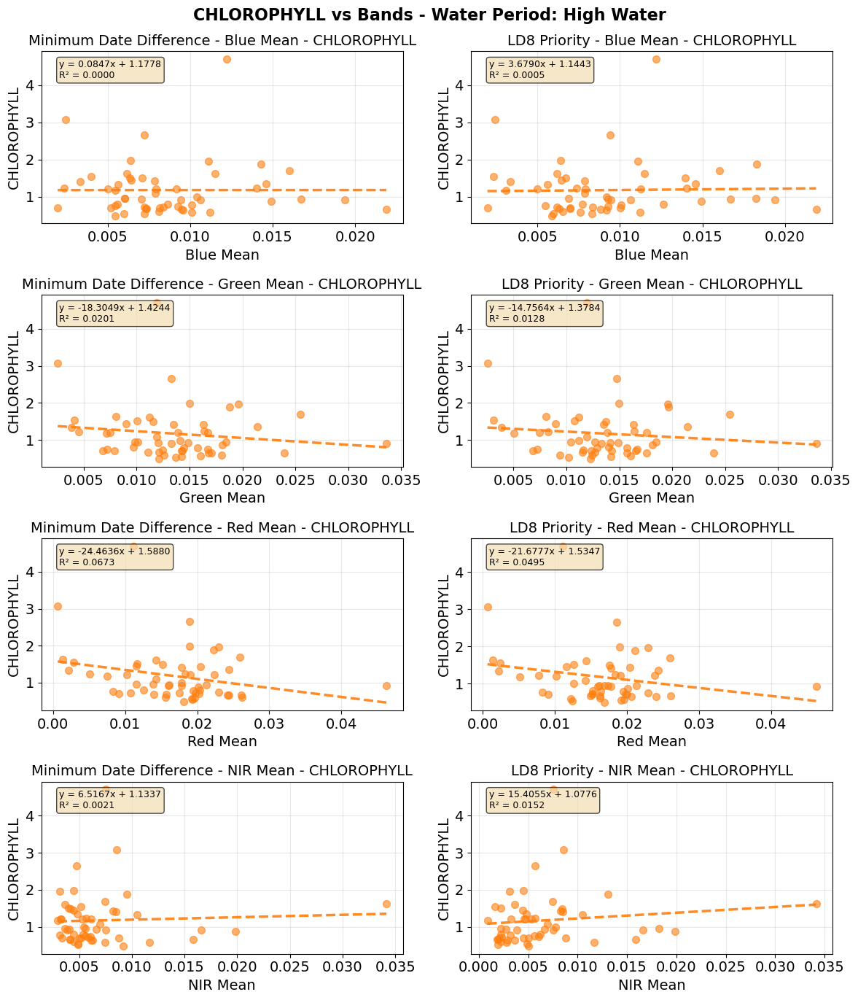

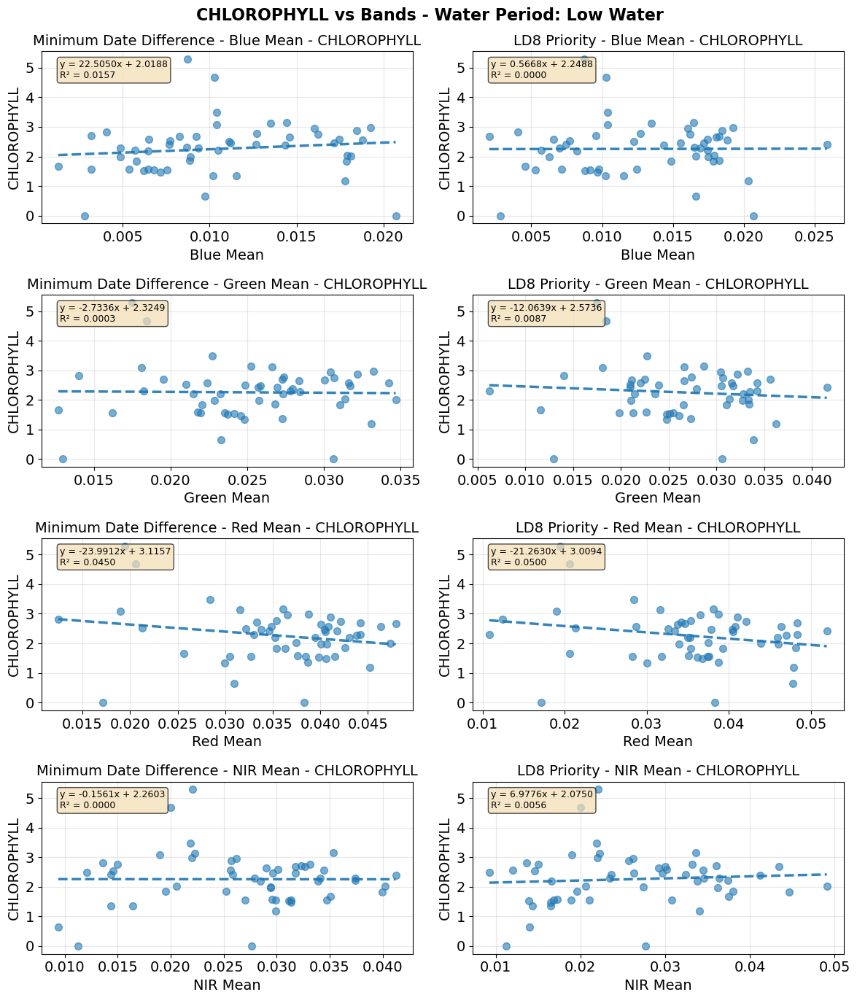

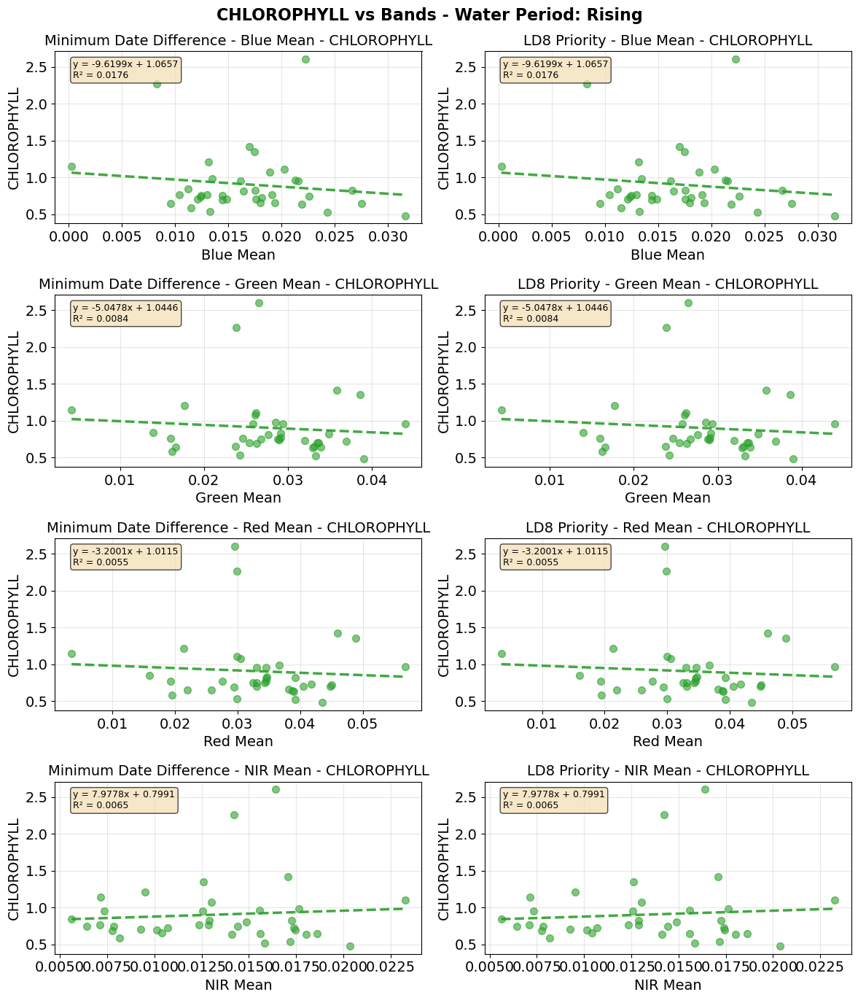

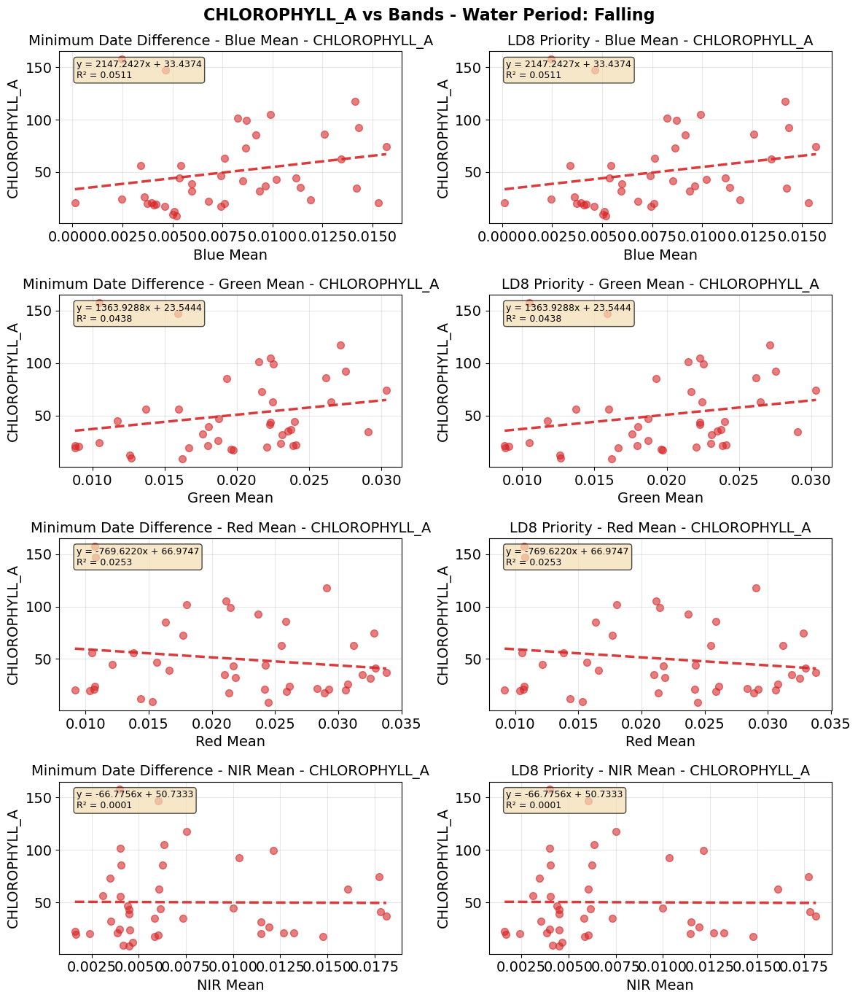

...

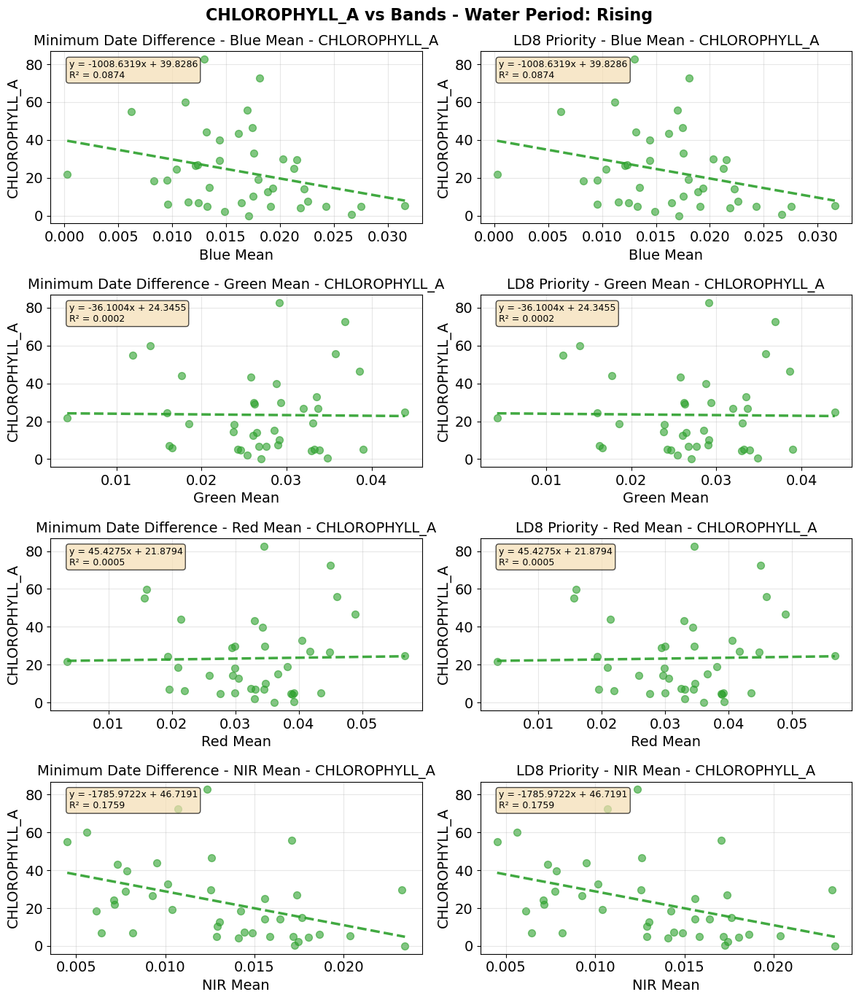

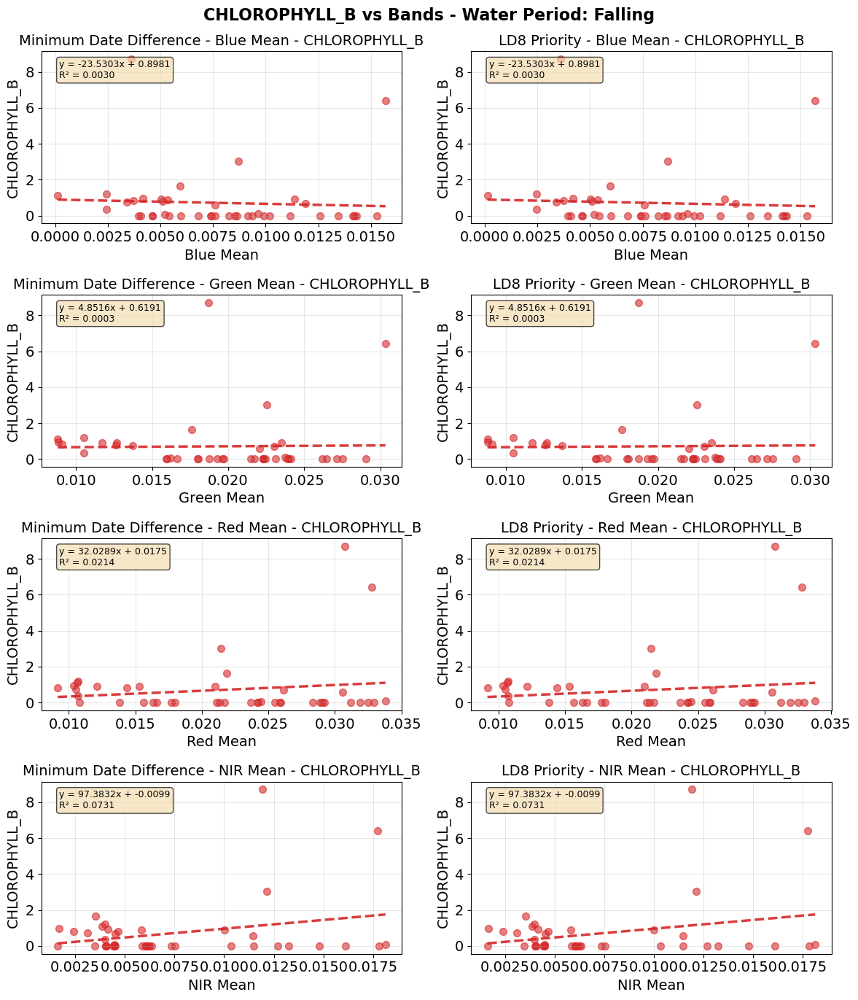

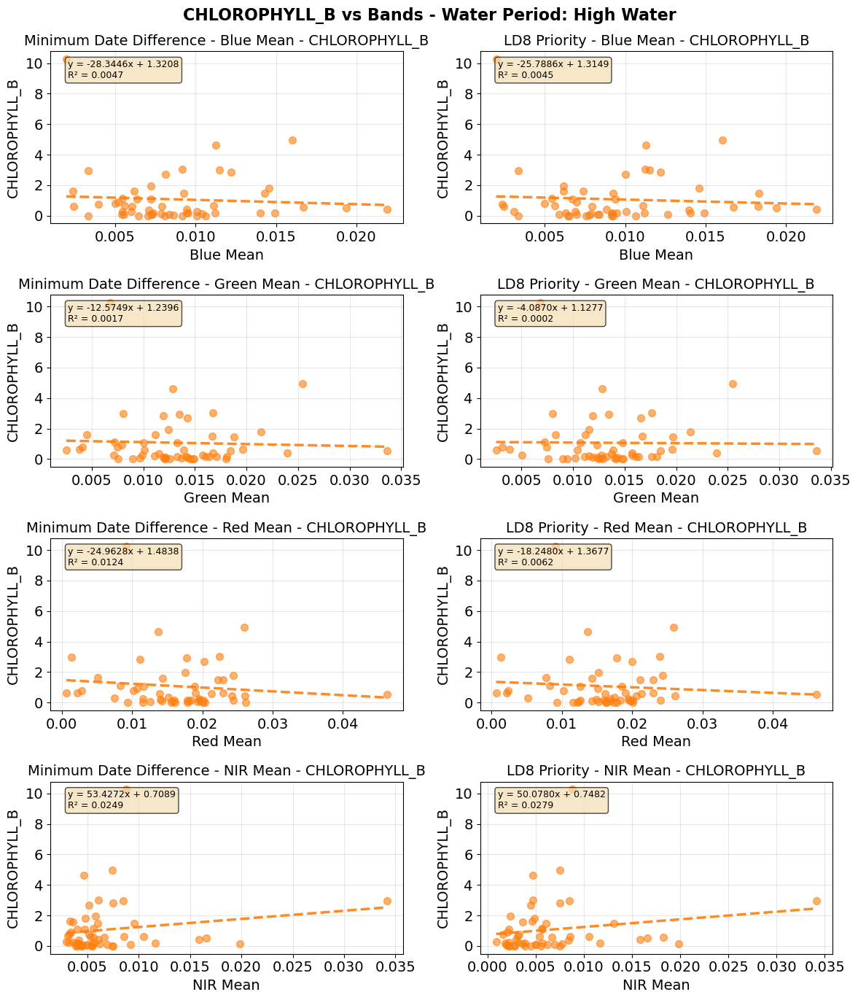

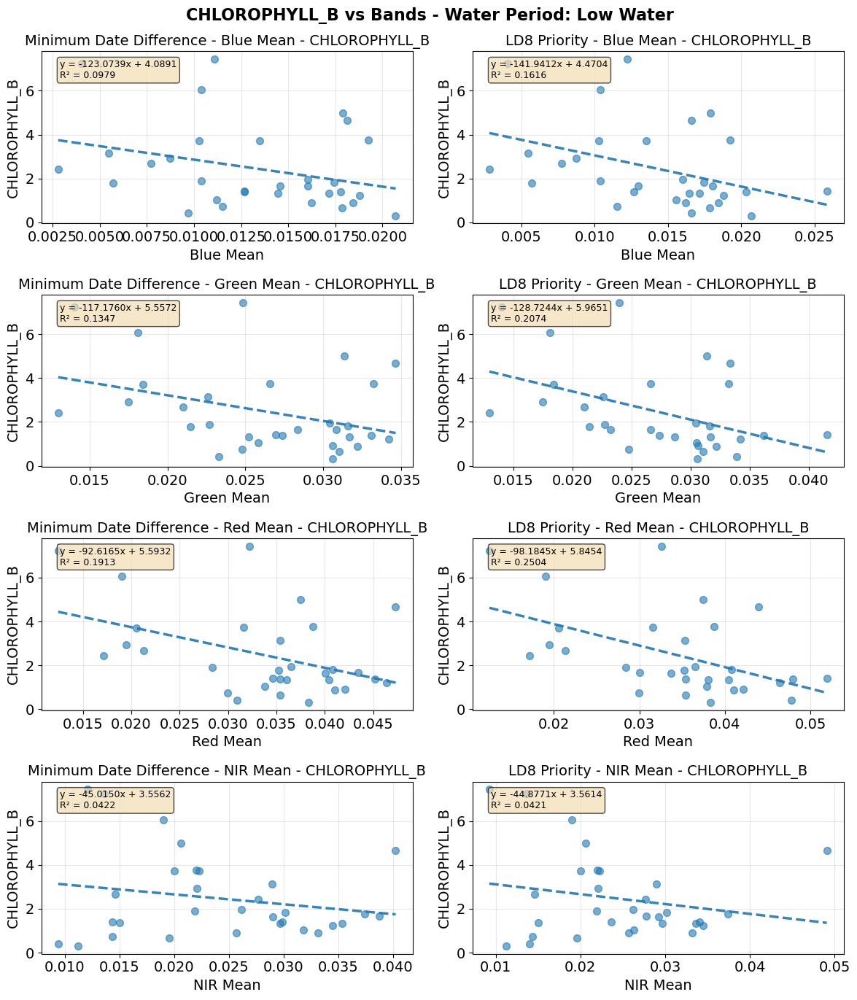

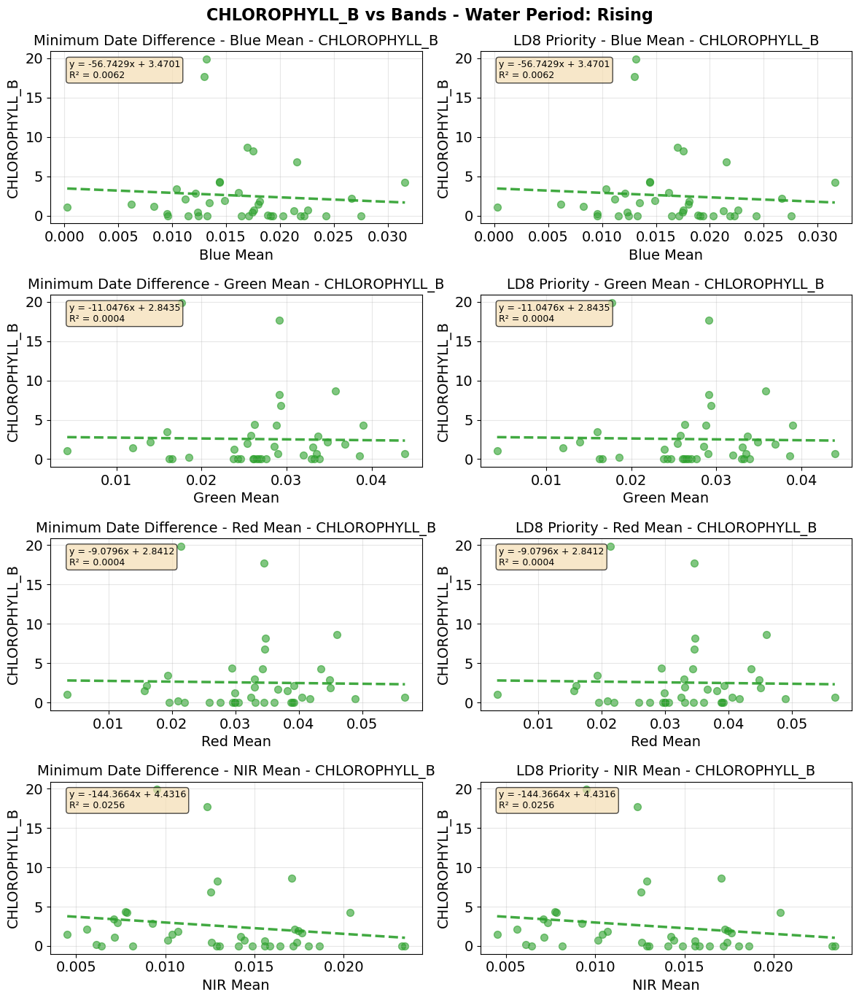

In [64]:
# Create 4x2 subplots for each WATER_PERIOD separately
# Each subplot shows scatter plot + regression line with equation and R² value
var_c = ['CHLOROPHYLL', 'CHLOROPHYLL_A', 'CHLOROPHYLL_B']

for var in var_c:

    bands = ['blue_mean', 'green_mean', 'red_mean', 'nir_mean']
    datasets = [df_minDate, df_ld8]
    titles = ['Minimum Date Difference', 'LD8 Priority']

    # Define consistent colors for each WATER_PERIOD
    water_periods = sorted(df_minDate['WATER_PERIOD'].unique())
    color_palette = ['#d62728', '#ff7f0e', '#1f77b4', '#2ca02c']
    colors = {period: color_palette[i % len(color_palette)] for i, period in enumerate(water_periods)}

    # Create a 4x2 figure for each water period
    for wp in water_periods:
        fig, axes = plt.subplots(4, 2, figsize=(12, 14))
        if  wp == "F":
            x = "Falling" 
        elif wp == "R":
            x = "Rising" 
        elif wp == "LW":
            x = "Low Water"
        else: 
            x = "High Water"
        fig.suptitle(f'{var} vs Bands - Water Period: {x}', fontsize=16, fontweight='bold')
        
        # Loop: rows = bands, columns = datasets
        for row, band in enumerate(bands):
            for col, (data, title) in enumerate(zip(datasets, titles)):
                ax = axes[row, col]
                
                # Filter data for this water period only
                subset = data[data['WATER_PERIOD'] == wp].dropna(subset=[band, var])
                
                if len(subset) > 0:
                    # Plot scatter
                    ax.scatter(subset[band], subset[var], 
                            color=colors[wp], 
                            marker='o',
                            alpha=0.6,
                            s=50)
                    
                    # Add regression line if enough data points
                    if len(subset) > 1:
                        z = np.polyfit(subset[band], subset[var], 1)
                        p = np.poly1d(z)
                        x_line = np.linspace(subset[band].min(), subset[band].max(), 100)
                        ax.plot(x_line, p(x_line), color=colors[wp], linestyle='--', linewidth=2.5, alpha=0.9)
                        
                        # Calculate R² value
                        y_pred = p(subset[band])
                        ss_res = np.sum((subset[var] - y_pred) ** 2)
                        ss_tot = np.sum((subset[var] - subset[var].mean()) ** 2)
                        r_squared = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
                        
                        # Extract slope and intercept
                        slope = z[0]
                        intercept = z[1]
                        
                        # Create equation string
                        equation = f'y = {slope:.4f}x + {intercept:.4f}'
                        r2_str = f'R² = {r_squared:.4f}'
                        
                        # Display equation and R² on plot
                        ax.text(0.05, 0.95, f'{equation}\n{r2_str}', 
                            transform=ax.transAxes, fontsize=9,
                            verticalalignment='top', 
                            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))
                if band == 'blue_mean':
                    b = 'Blue Mean'
                elif band == 'green_mean':
                    b = 'Green Mean'
                elif band == 'red_mean':
                    b = 'Red Mean'
                elif band == 'nir_mean':
                    b = 'NIR Mean'
                ax.set_xlabel(b)
                ax.set_ylabel(var)
                ax.set_title(f'{title} - {b} - {var}')
                ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()

# Organic carbon

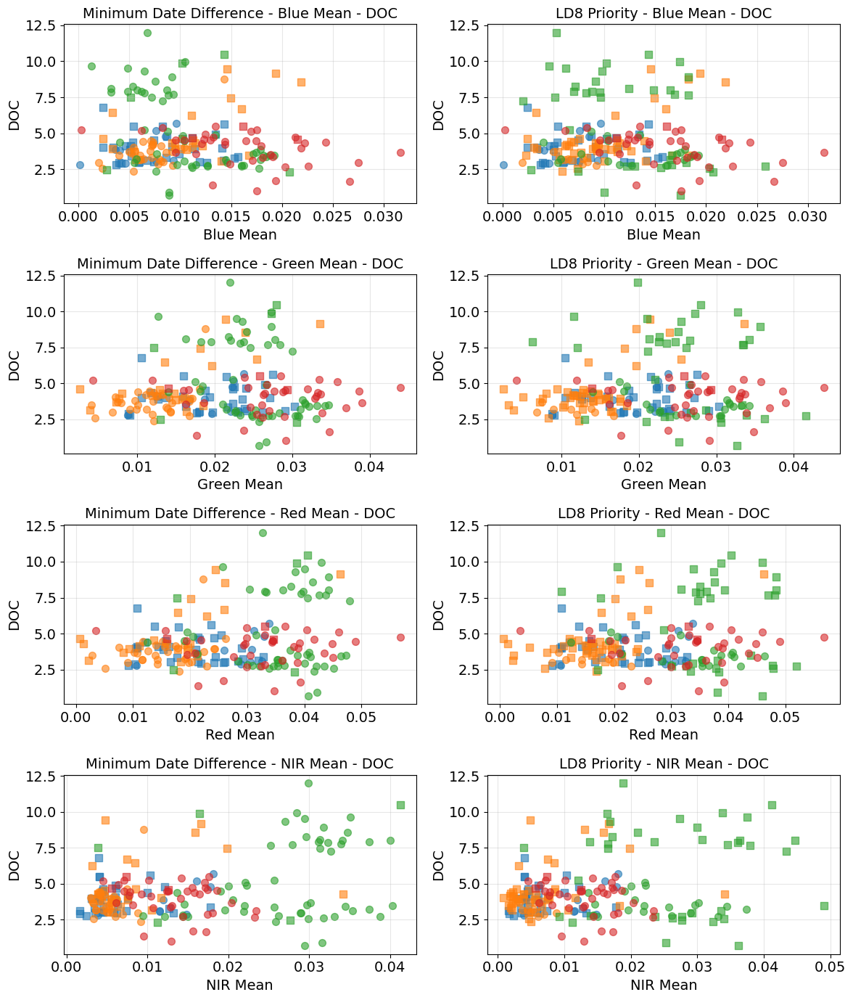

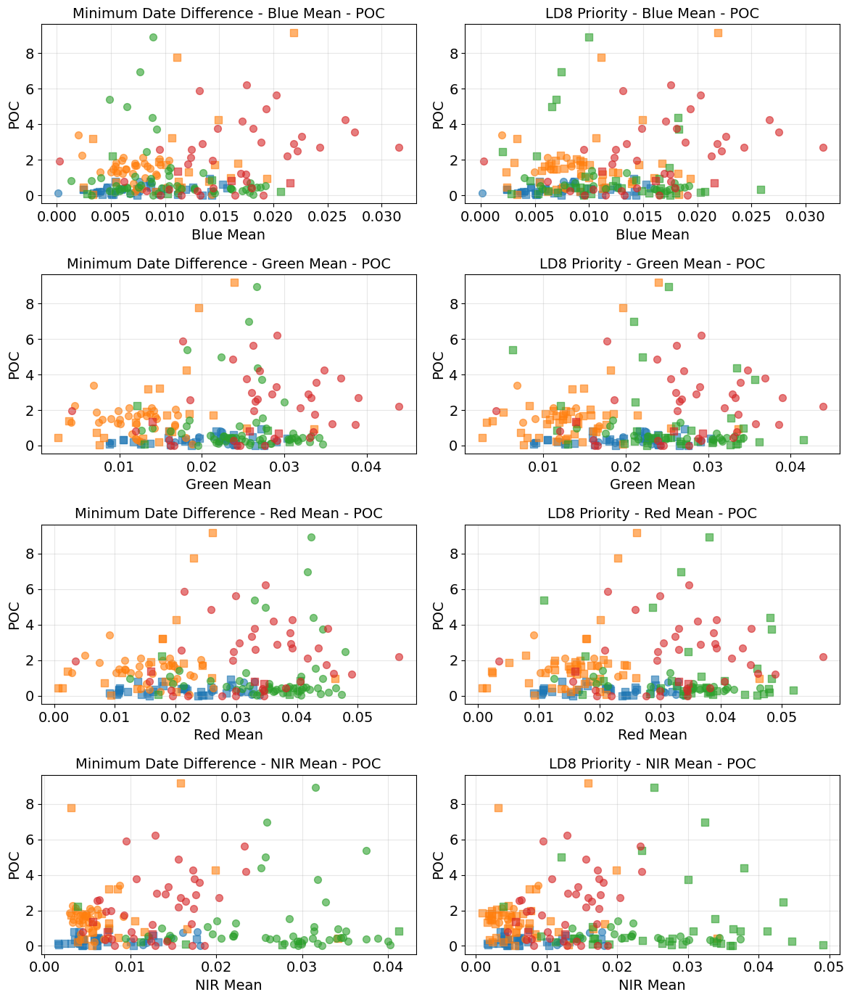

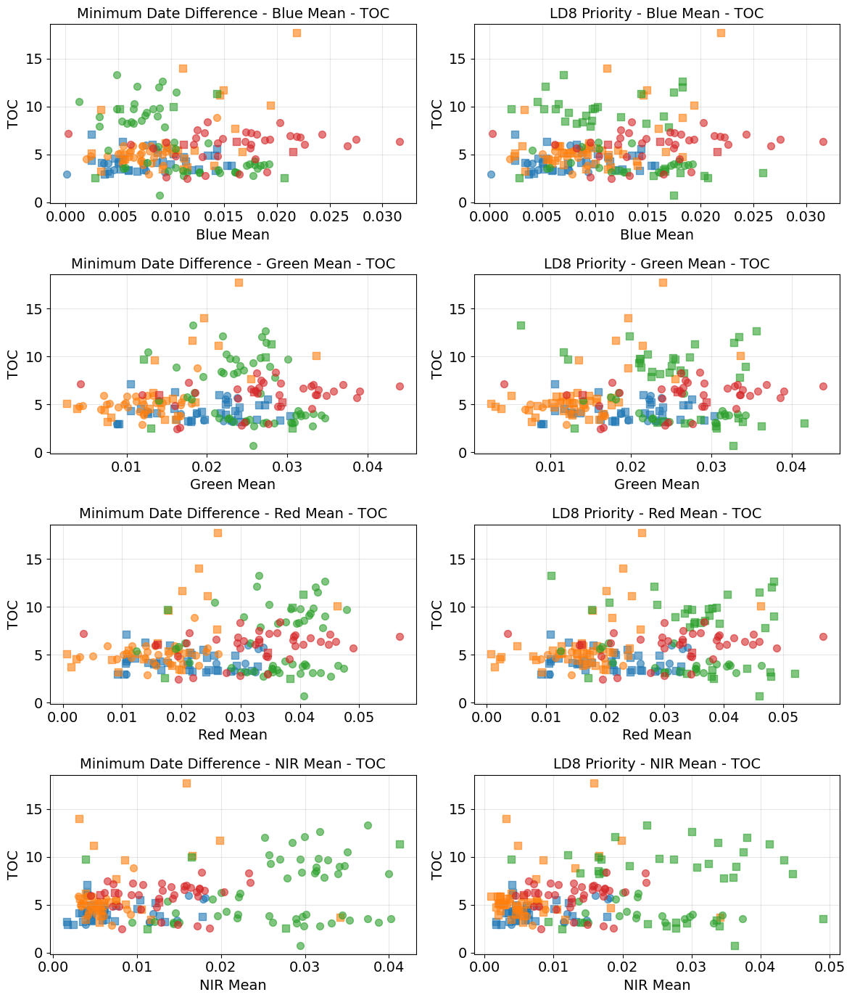

In [65]:
var_c =['DOC', 'POC', 'TOC']
# Create 4x2 subplot: 4 rows (bands) x 2 columns (datasets)
# Each WATER_PERIOD gets a unique color, each satellite gets a unique marker
for var in var_c:
    fig, axes = plt.subplots(4, 2, figsize=(12, 14))

    bands = ['blue_mean', 'green_mean', 'red_mean', 'nir_mean']
    datasets = [df_minDate, df_ld8]
    titles = ['Minimum Date Difference', 'LD8 Priority']

    # Define consistent colors for each WATER_PERIOD (across all subplots)
    water_periods = sorted(df_minDate['WATER_PERIOD'].unique())
    color_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']
    colors = {period: color_palette[i % len(color_palette)] for i, period in enumerate(water_periods)}

    # Define consistent markers for each satellite
    satellites = sorted(df_minDate['satellite'].unique())
    markers = {sat: marker for sat, marker in zip(satellites, ['o', 's', '^', 'D', 'v', '<', '>', 'P'])}

    # Loop: rows = bands, columns = datasets
    for row, band in enumerate(bands):
        for col, (data, title) in enumerate(zip(datasets, titles)):
            ax = axes[row, col]
            data = data.dropna(subset=[band, var])
            
            # Create scatter plot with consistent colors and markers
            for water_period in sorted(data['WATER_PERIOD'].unique()):
                for satellite in sorted(data['satellite'].unique()):
                    subset = data[(data['WATER_PERIOD'] == water_period) & (data['satellite'] == satellite)]
                    ax.scatter(subset[band], subset[var], 
                            color=colors[water_period], 
                            marker=markers[satellite],
                            label=f'{water_period}-{satellite}', 
                            alpha=0.6,
                            s=50)
            
            if band == 'blue_mean':
                b = 'Blue Mean'
            elif band == 'green_mean':
                b = 'Green Mean'
            elif band == 'red_mean':
                b = 'Red Mean'
            elif band == 'nir_mean':
                b = 'NIR Mean'
            ax.set_xlabel(b)
            ax.set_ylabel(var)
            ax.set_title(f'{title} - {b} - {var}')
            ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

## regressions

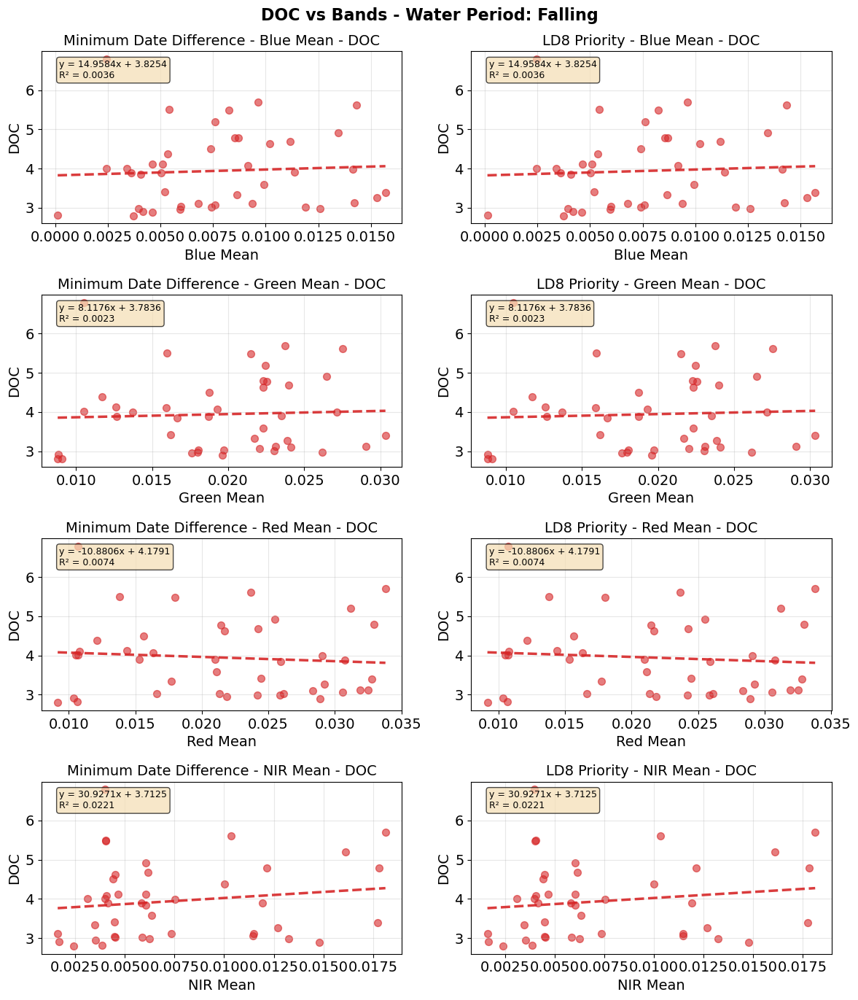

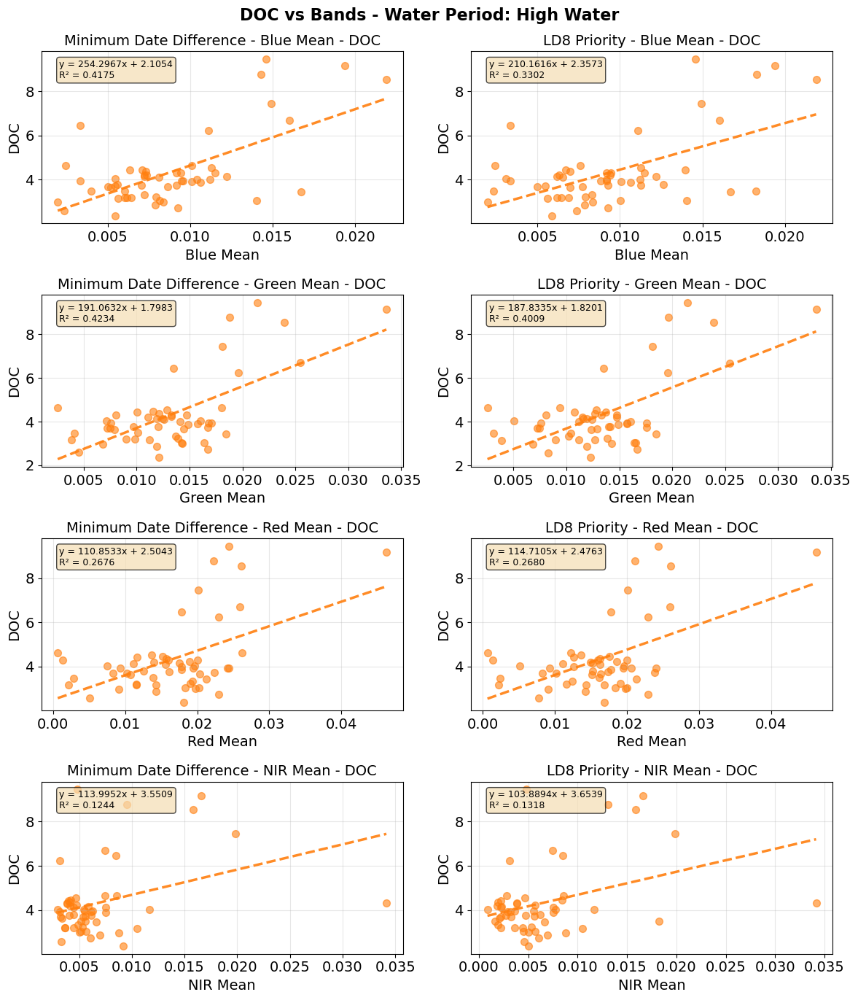

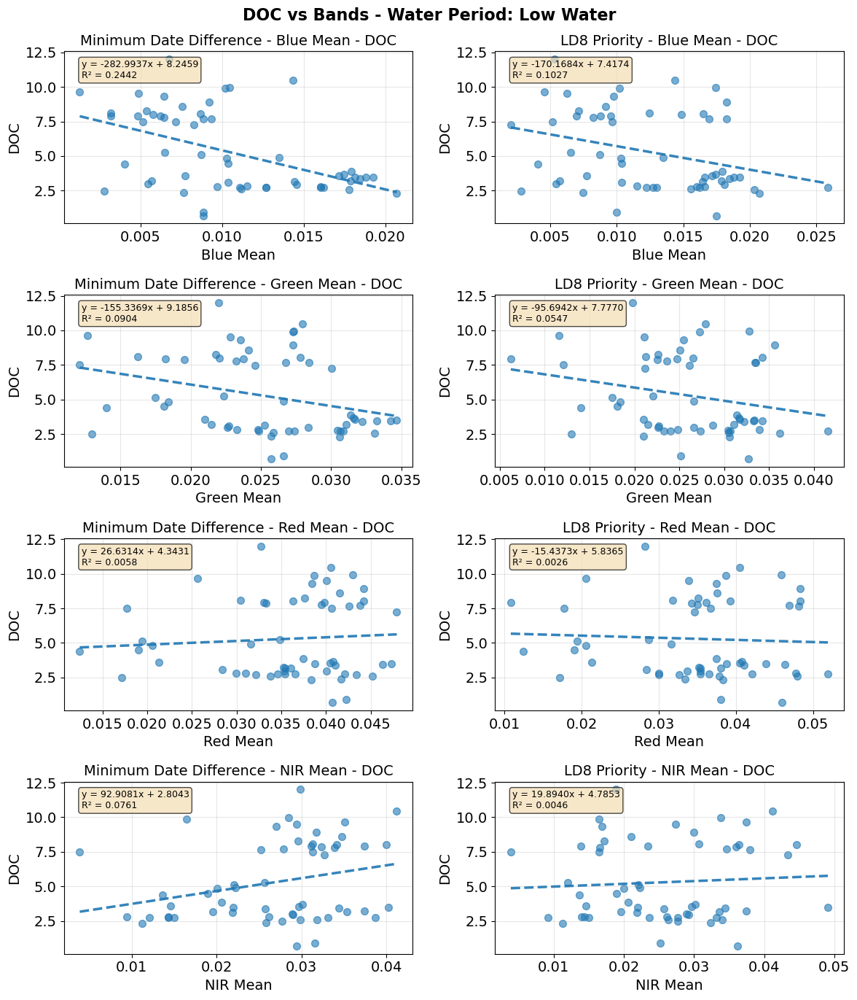

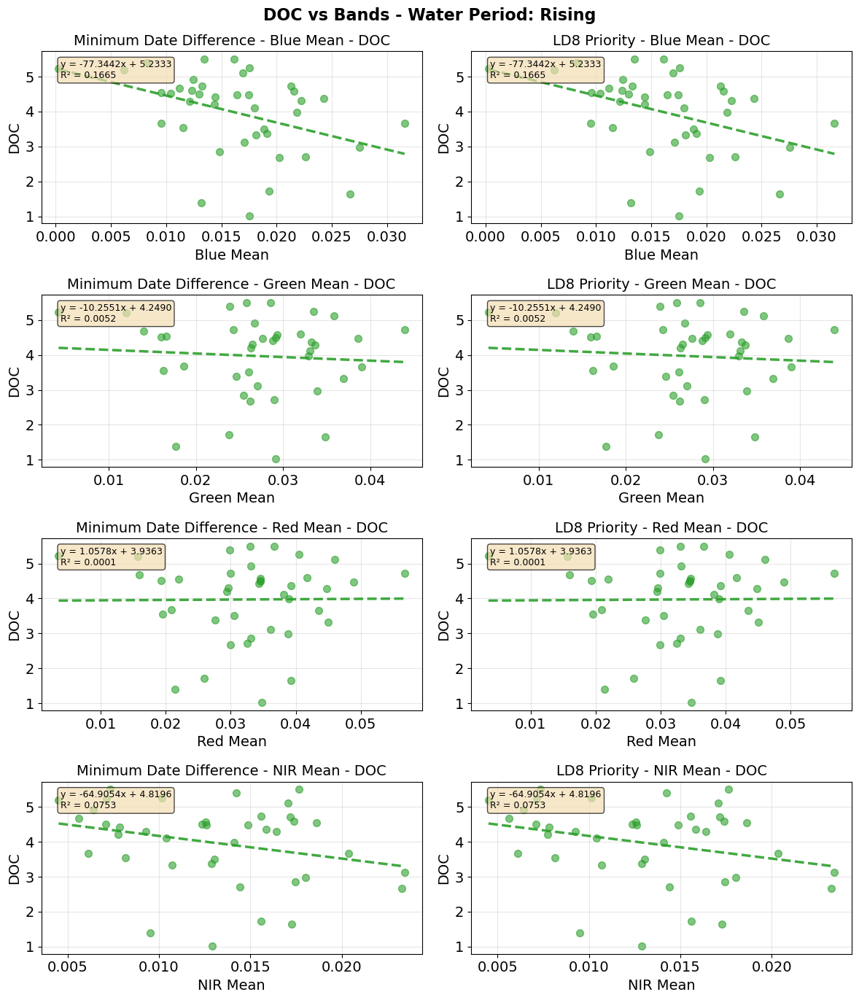

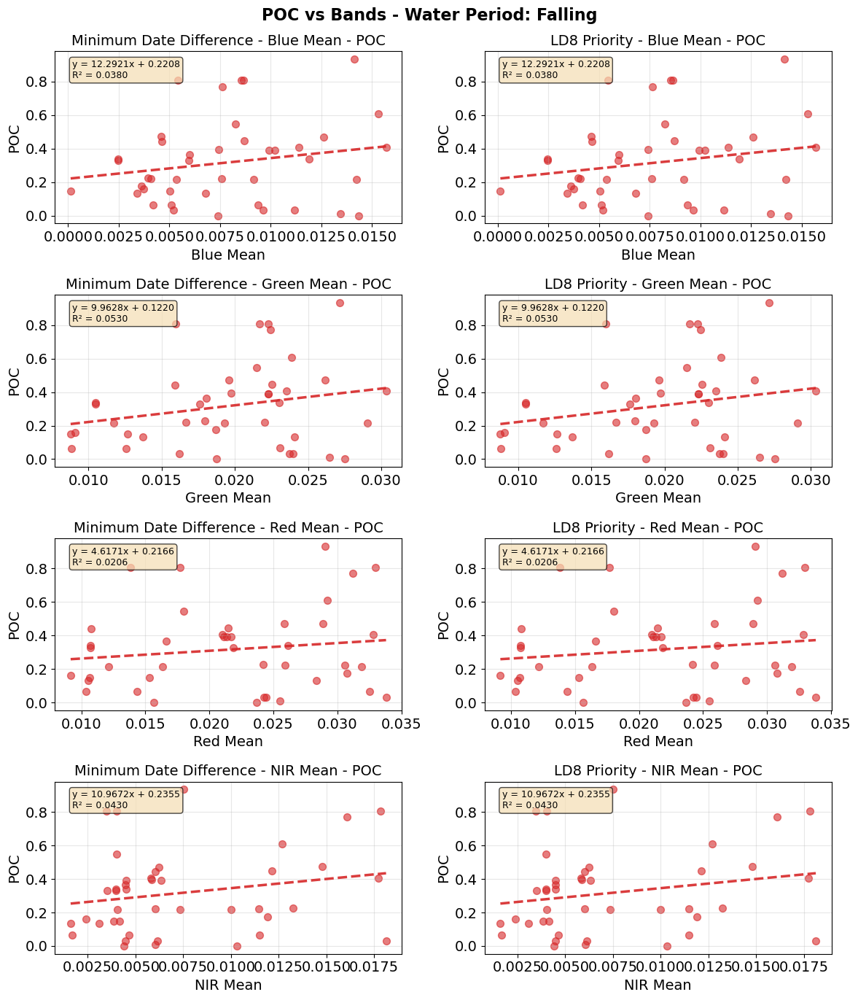

...

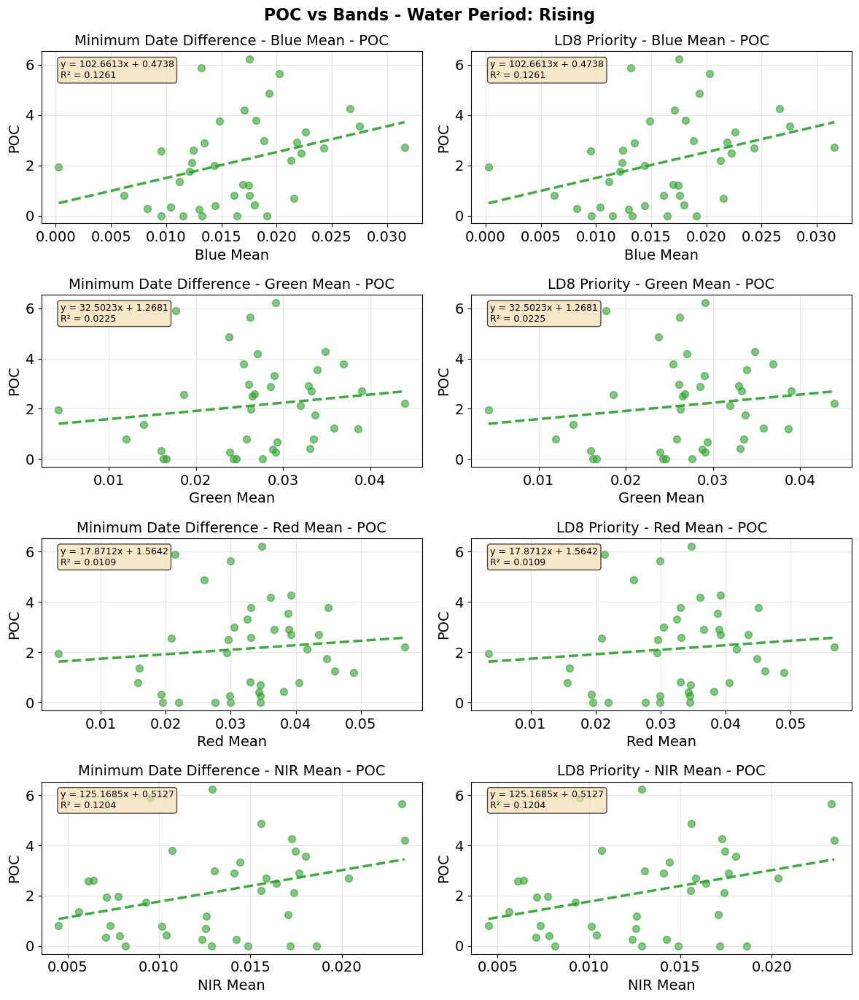

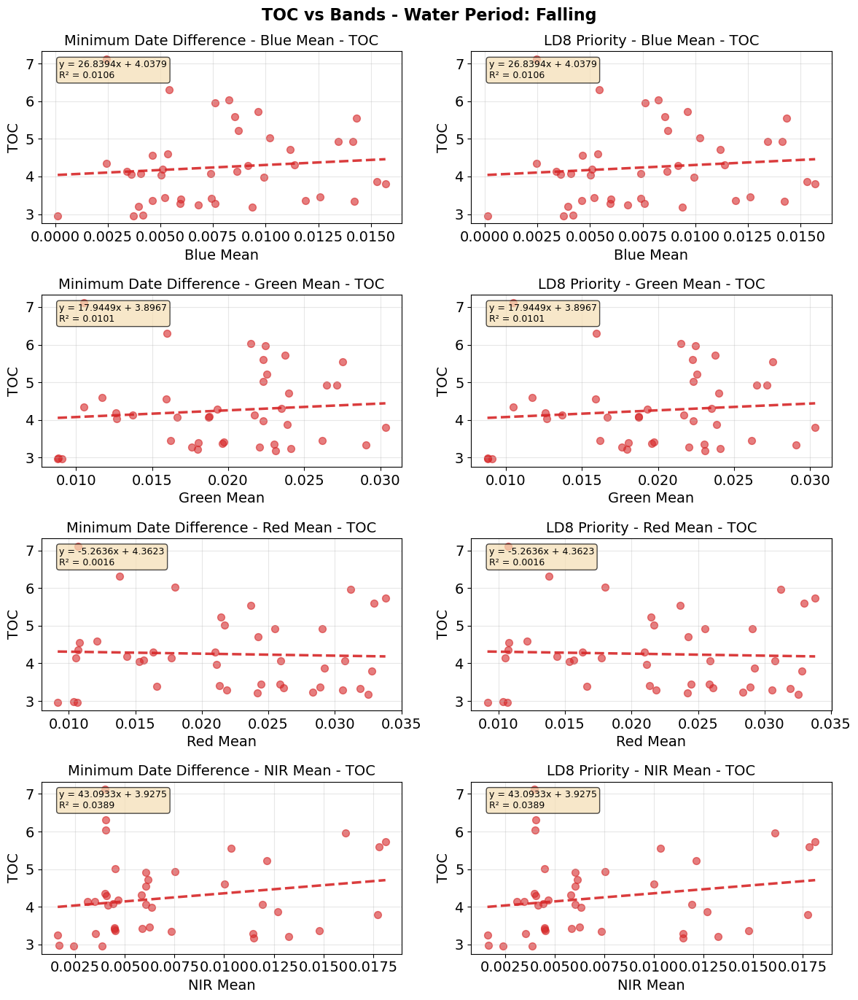

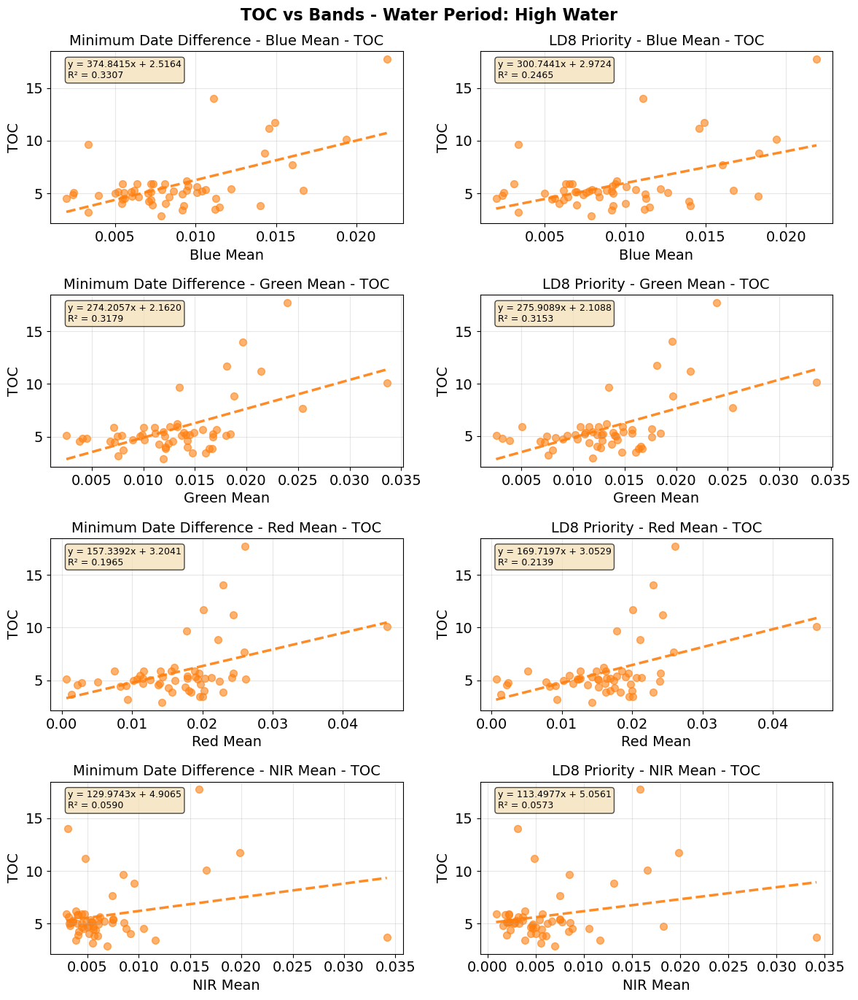

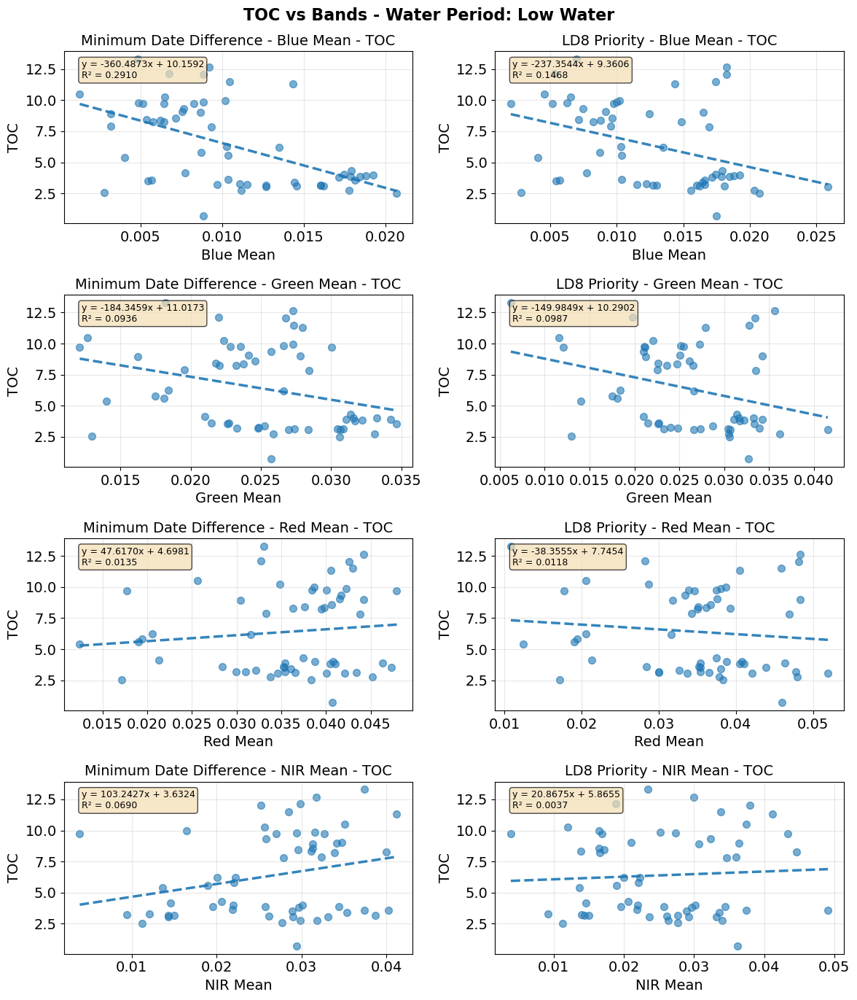

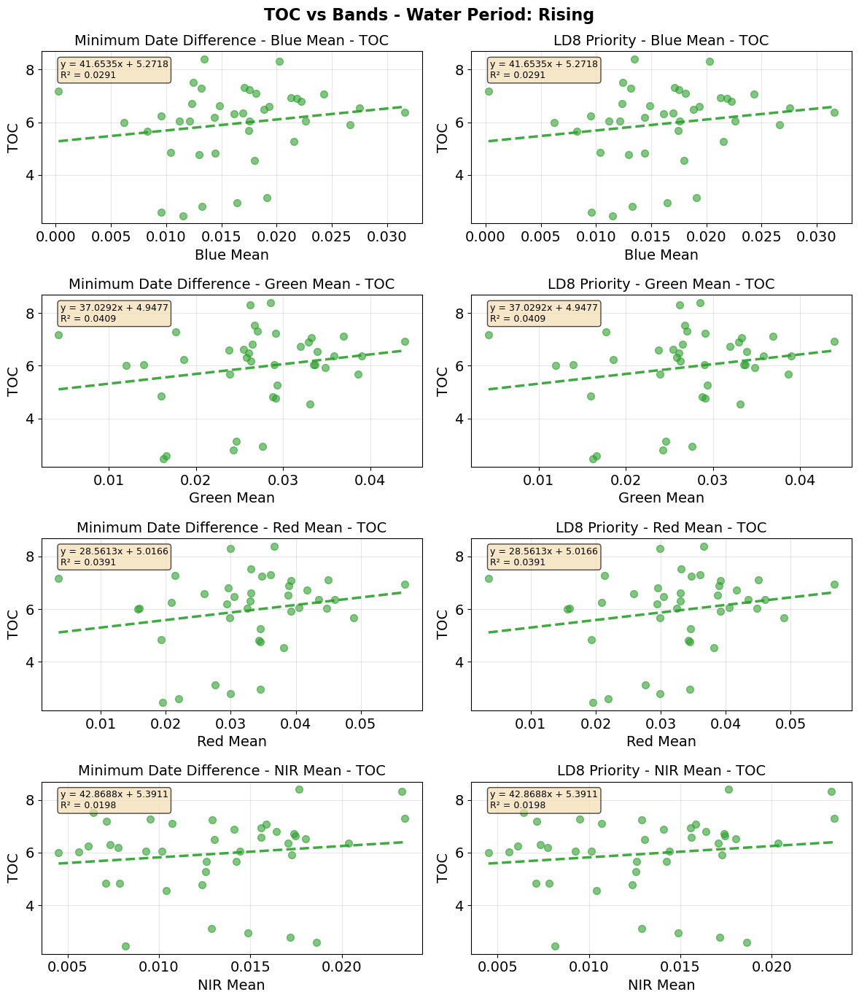

In [66]:
# Create 4x2 subplots for each WATER_PERIOD separately
# Each subplot shows scatter plot + regression line with equation and R² value

for var in var_c:

    bands = ['blue_mean', 'green_mean', 'red_mean', 'nir_mean']
    datasets = [df_minDate, df_ld8]
    titles = ['Minimum Date Difference', 'LD8 Priority']

    # Define consistent colors for each WATER_PERIOD
    water_periods = sorted(df_minDate['WATER_PERIOD'].unique())
    color_palette = ['#d62728', '#ff7f0e', '#1f77b4', '#2ca02c']
    colors = {period: color_palette[i % len(color_palette)] for i, period in enumerate(water_periods)}

    # Create a 4x2 figure for each water period
    for wp in water_periods:
        fig, axes = plt.subplots(4, 2, figsize=(12, 14))
        if  wp == "F":
            x = "Falling" 
        elif wp == "R":
            x = "Rising" 
        elif wp == "LW":
            x = "Low Water"
        else: 
            x = "High Water"
        fig.suptitle(f'{var} vs Bands - Water Period: {x}', fontsize=16, fontweight='bold')
        
        # Loop: rows = bands, columns = datasets
        for row, band in enumerate(bands):
            for col, (data, title) in enumerate(zip(datasets, titles)):
                ax = axes[row, col]
                
                # Filter data for this water period only
                subset = data[data['WATER_PERIOD'] == wp].dropna(subset=[band, var])
                
                if len(subset) > 0:
                    # Plot scatter
                    ax.scatter(subset[band], subset[var], 
                            color=colors[wp], 
                            marker='o',
                            alpha=0.6,
                            s=50)
                    
                    # Add regression line if enough data points
                    if len(subset) > 1:
                        z = np.polyfit(subset[band], subset[var], 1)
                        p = np.poly1d(z)
                        x_line = np.linspace(subset[band].min(), subset[band].max(), 100)
                        ax.plot(x_line, p(x_line), color=colors[wp], linestyle='--', linewidth=2.5, alpha=0.9)
                        
                        # Calculate R² value
                        y_pred = p(subset[band])
                        ss_res = np.sum((subset[var] - y_pred) ** 2)
                        ss_tot = np.sum((subset[var] - subset[var].mean()) ** 2)
                        r_squared = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
                        
                        # Extract slope and intercept
                        slope = z[0]
                        intercept = z[1]
                        
                        # Create equation string
                        equation = f'y = {slope:.4f}x + {intercept:.4f}'
                        r2_str = f'R² = {r_squared:.4f}'
                        
                        # Display equation and R² on plot
                        ax.text(0.05, 0.95, f'{equation}\n{r2_str}', 
                            transform=ax.transAxes, fontsize=9,
                            verticalalignment='top', 
                            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))
                if band == 'blue_mean':
                    b = 'Blue Mean'
                elif band == 'green_mean':
                    b = 'Green Mean'
                elif band == 'red_mean':
                    b = 'Red Mean'
                elif band == 'nir_mean':
                    b = 'NIR Mean'
                ax.set_xlabel(b)
                ax.set_ylabel(var)
                ax.set_title(f'{title} - {b} - {var}')
                ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()

# Nitrogen

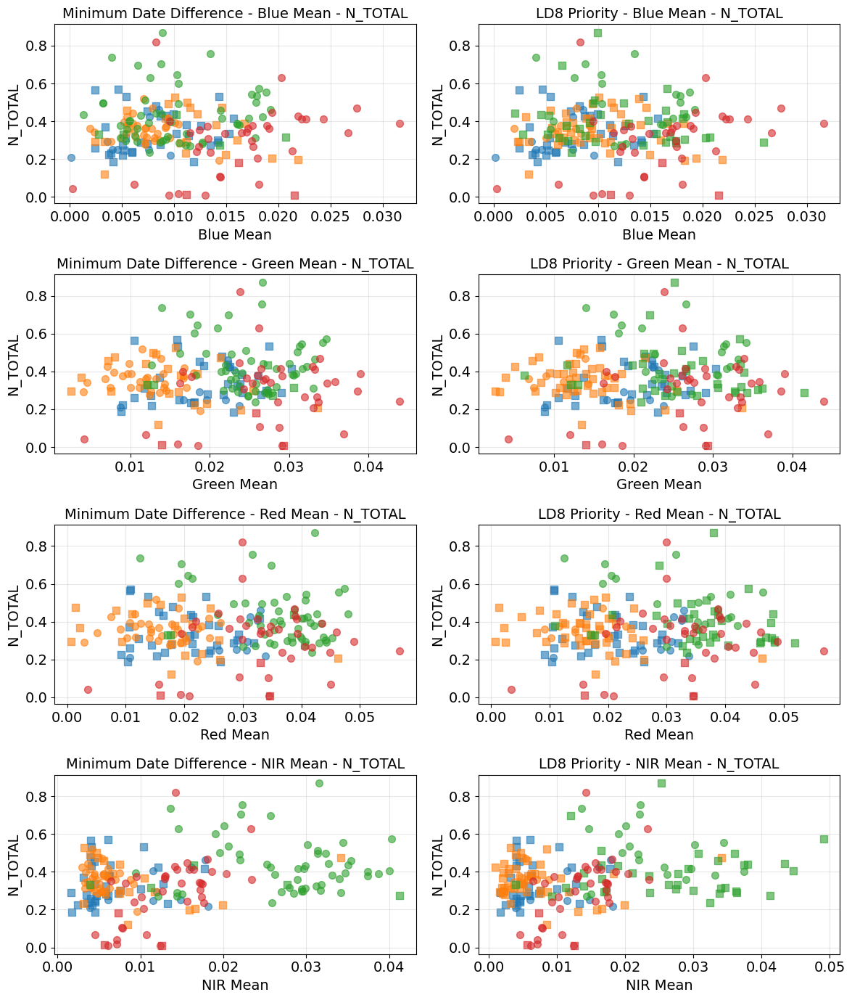

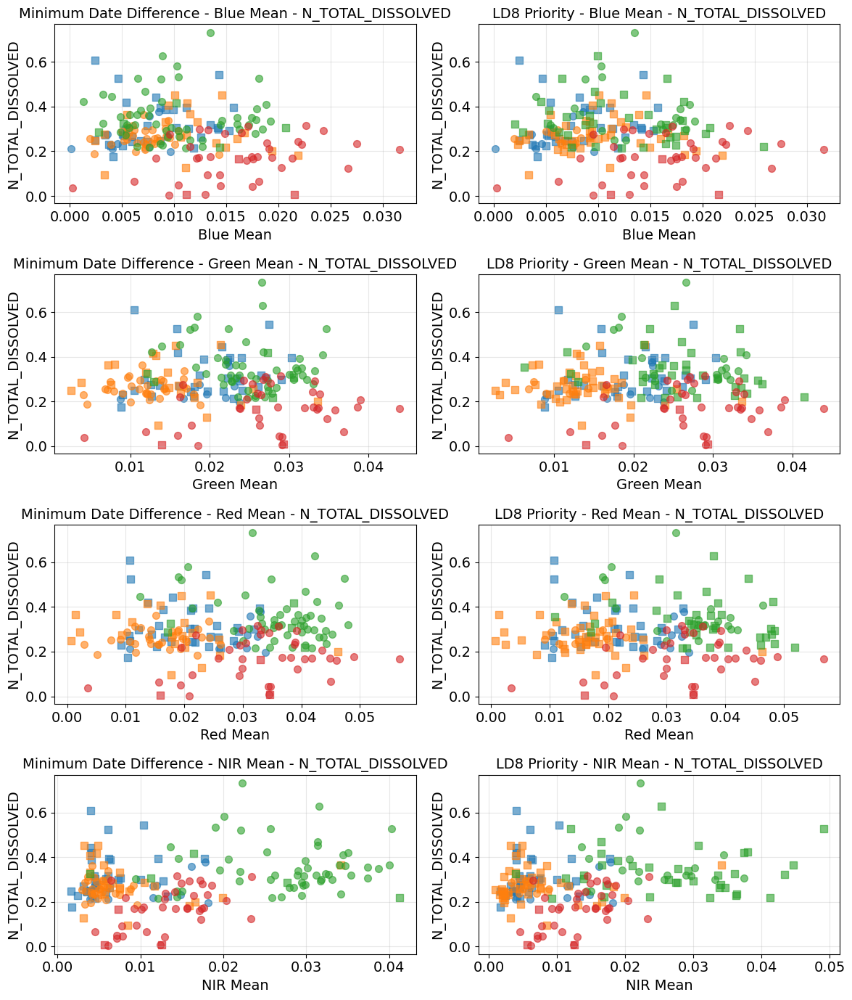

In [67]:
var_c = ['N_TOTAL', 'N_TOTAL_DISSOLVED']
# Create 4x2 subplot: 4 rows (bands) x 2 columns (datasets)
# Each WATER_PERIOD gets a unique color, each satellite gets a unique marker
for var in var_c:
    fig, axes = plt.subplots(4, 2, figsize=(12, 14))

    bands = ['blue_mean', 'green_mean', 'red_mean', 'nir_mean']
    datasets = [df_minDate, df_ld8]
    titles = ['Minimum Date Difference', 'LD8 Priority']

    # Define consistent colors for each WATER_PERIOD (across all subplots)
    water_periods = sorted(df_minDate['WATER_PERIOD'].unique())
    color_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']
    colors = {period: color_palette[i % len(color_palette)] for i, period in enumerate(water_periods)}

    # Define consistent markers for each satellite
    satellites = sorted(df_minDate['satellite'].unique())
    markers = {sat: marker for sat, marker in zip(satellites, ['o', 's', '^', 'D', 'v', '<', '>', 'P'])}

    # Loop: rows = bands, columns = datasets
    for row, band in enumerate(bands):
        for col, (data, title) in enumerate(zip(datasets, titles)):
            ax = axes[row, col]
            data = data.dropna(subset=[band, var])
            
            # Create scatter plot with consistent colors and markers
            for water_period in sorted(data['WATER_PERIOD'].unique()):
                for satellite in sorted(data['satellite'].unique()):
                    subset = data[(data['WATER_PERIOD'] == water_period) & (data['satellite'] == satellite)]
                    ax.scatter(subset[band], subset[var], 
                            color=colors[water_period], 
                            marker=markers[satellite],
                            label=f'{water_period}-{satellite}', 
                            alpha=0.6,
                            s=50)
            
            if band == 'blue_mean':
                b = 'Blue Mean'
            elif band == 'green_mean':
                b = 'Green Mean'
            elif band == 'red_mean':
                b = 'Red Mean'
            elif band == 'nir_mean':
                b = 'NIR Mean'
            ax.set_xlabel(b)
            ax.set_ylabel(var)
            ax.set_title(f'{title} - {b} - {var}')
            ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

## regressions

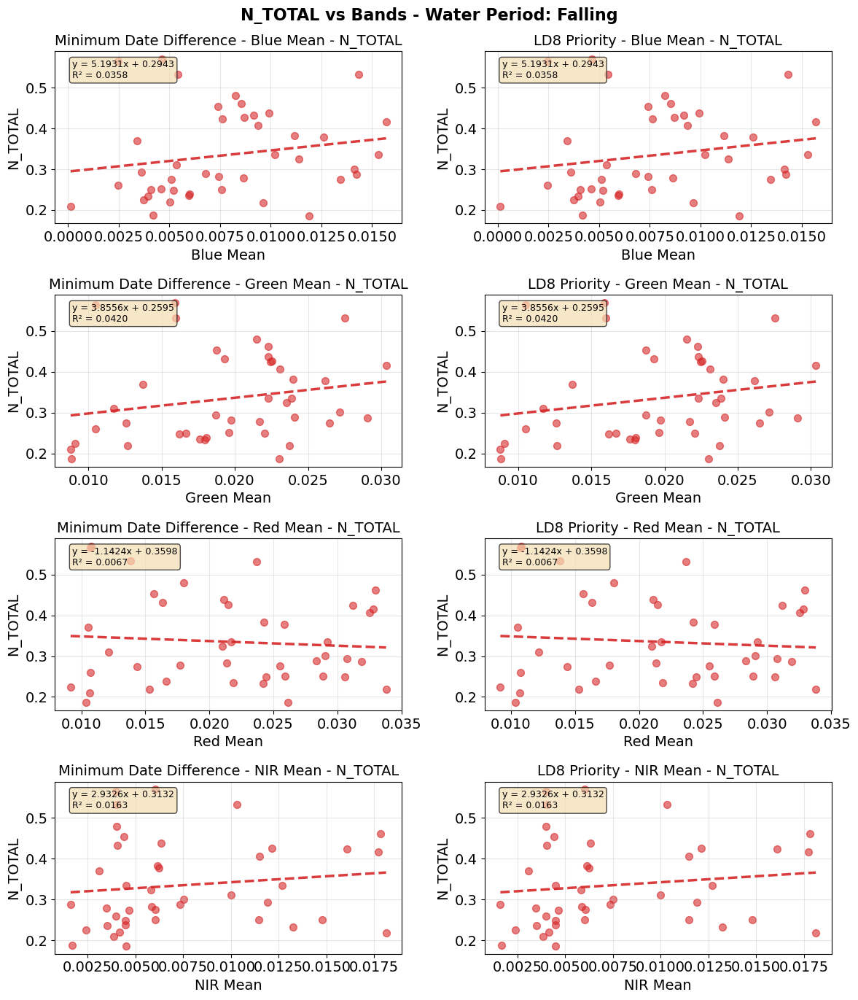

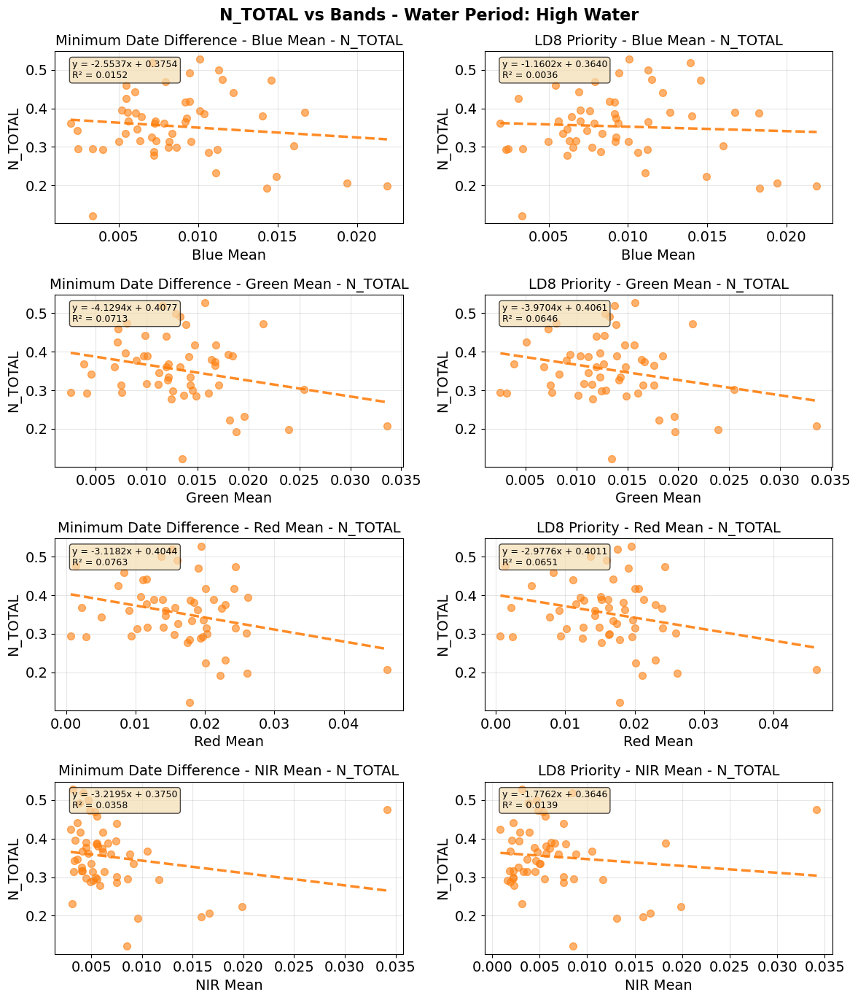

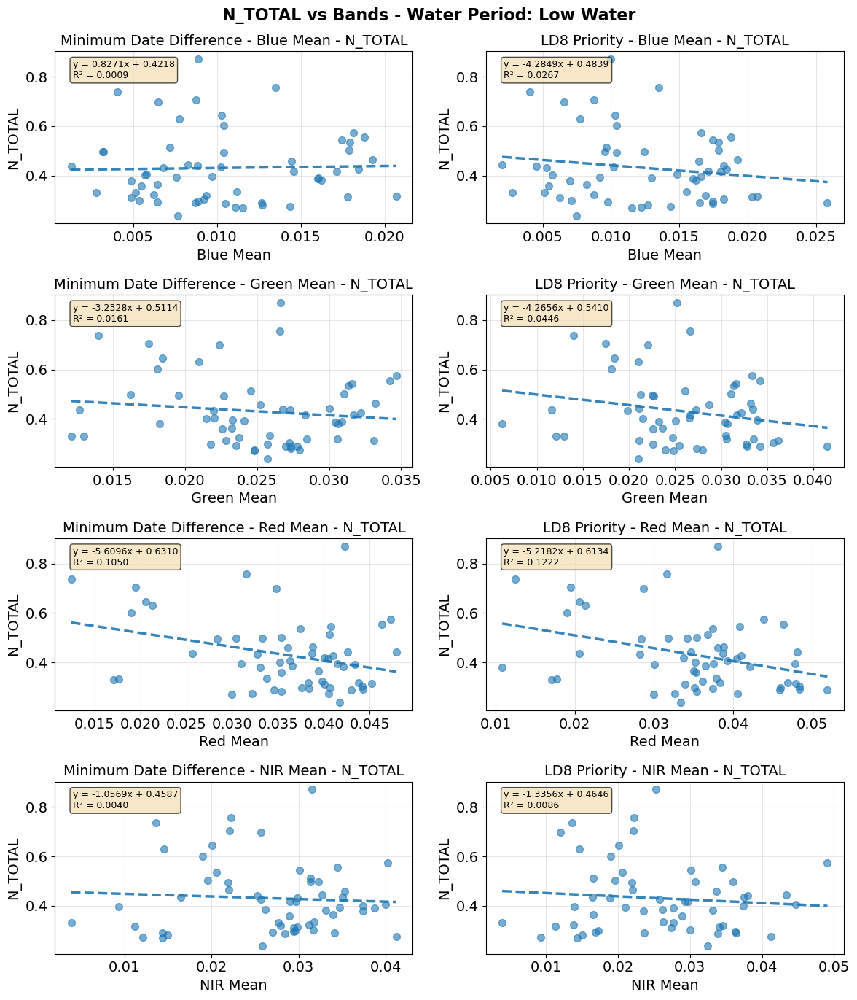

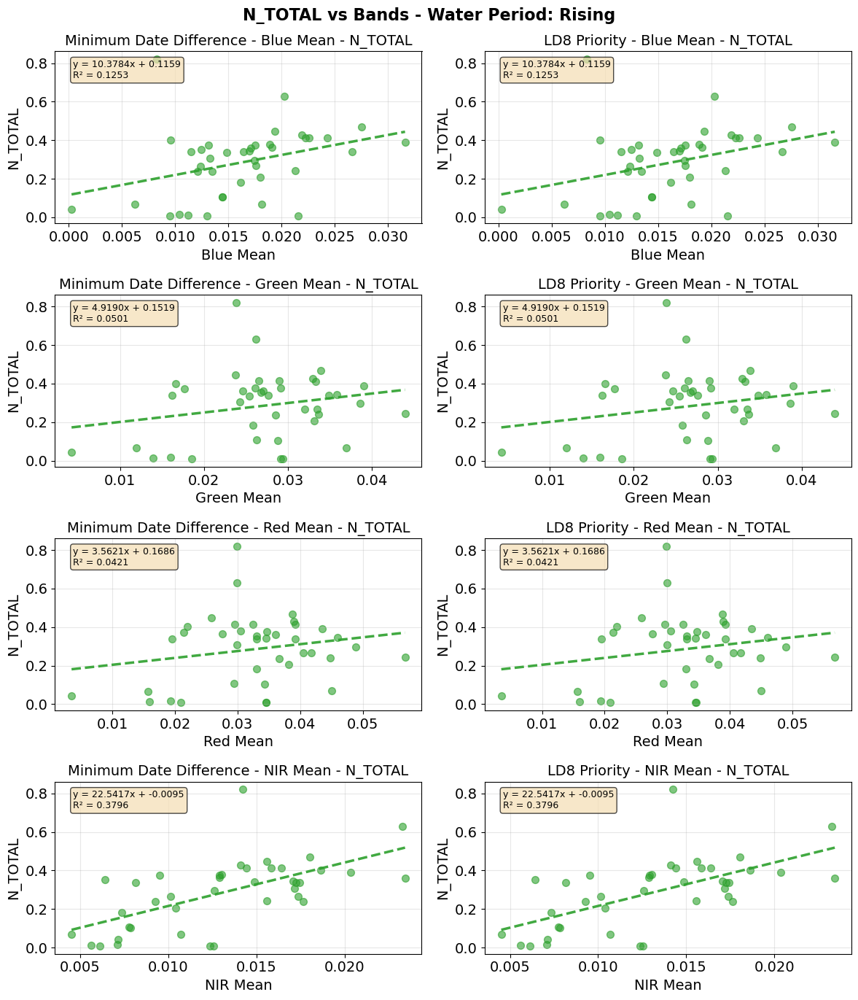

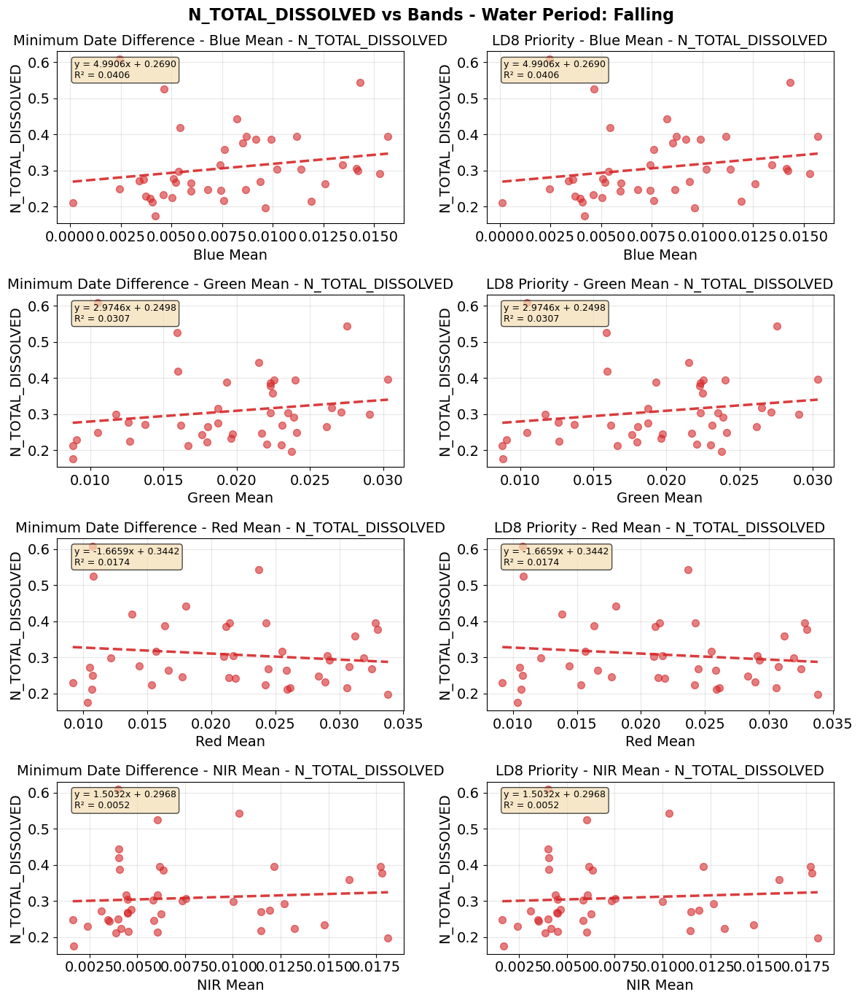

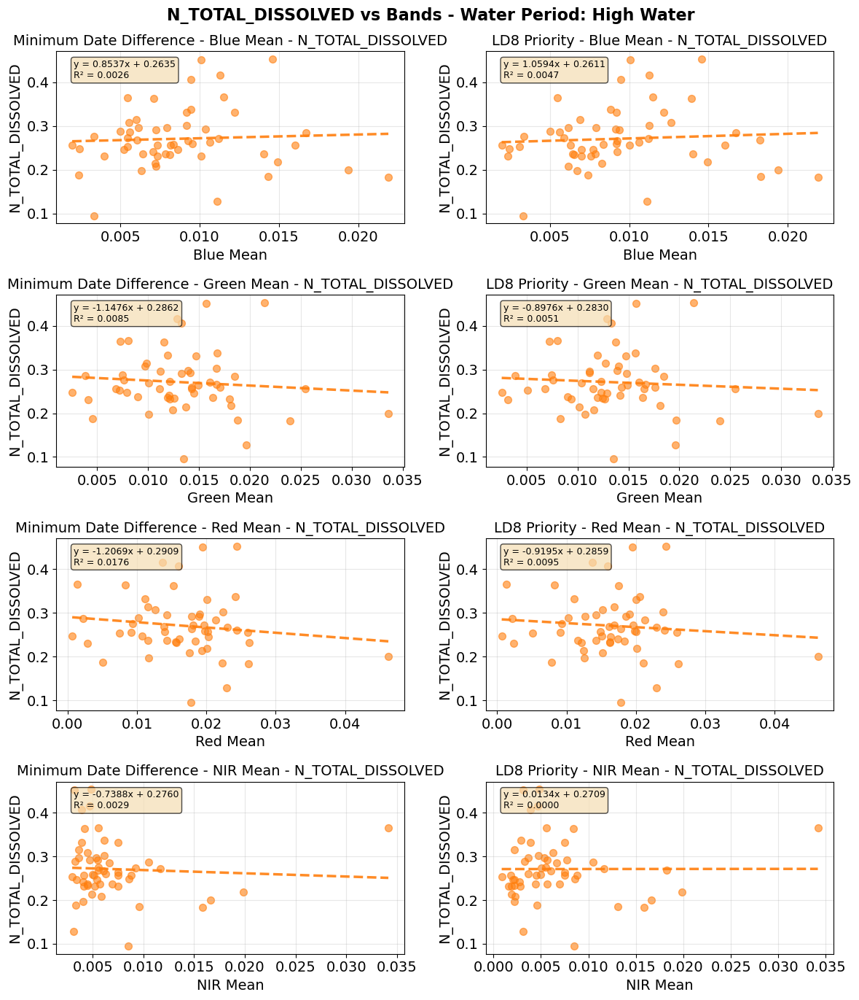

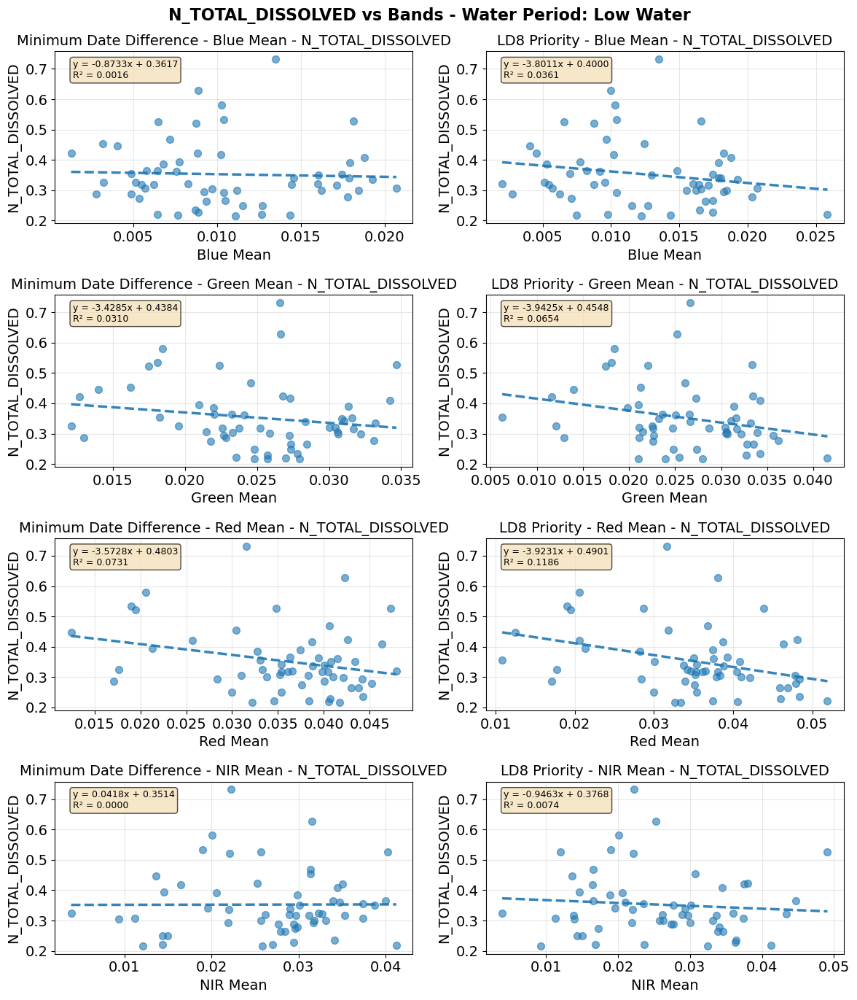

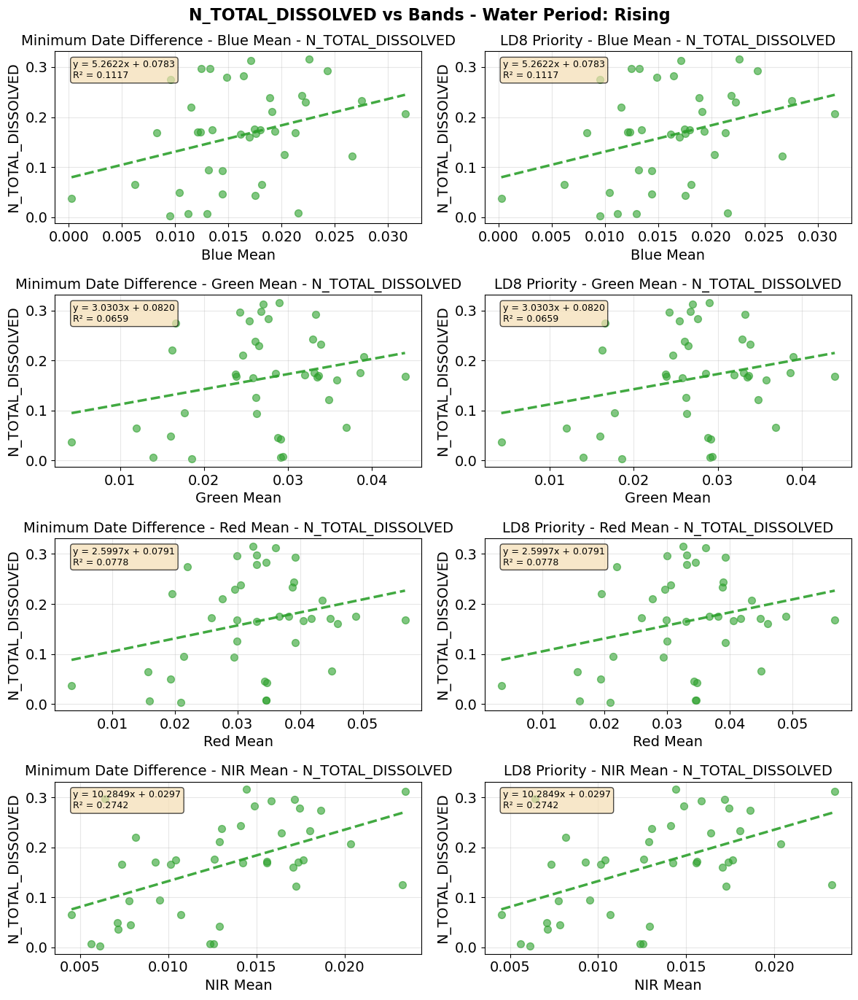

In [68]:
# Create 4x2 subplots for each WATER_PERIOD separately
# Each subplot shows scatter plot + regression line with equation and R² value

for var in var_c:

    bands = ['blue_mean', 'green_mean', 'red_mean', 'nir_mean']
    datasets = [df_minDate, df_ld8]
    titles = ['Minimum Date Difference', 'LD8 Priority']

    # Define consistent colors for each WATER_PERIOD
    water_periods = sorted(df_minDate['WATER_PERIOD'].unique())
    color_palette = ['#d62728', '#ff7f0e', '#1f77b4', '#2ca02c']
    colors = {period: color_palette[i % len(color_palette)] for i, period in enumerate(water_periods)}

    # Create a 4x2 figure for each water period
    for wp in water_periods:
        fig, axes = plt.subplots(4, 2, figsize=(12, 14))
        if  wp == "F":
            x = "Falling" 
        elif wp == "R":
            x = "Rising" 
        elif wp == "LW":
            x = "Low Water"
        else: 
            x = "High Water"
        fig.suptitle(f'{var} vs Bands - Water Period: {x}', fontsize=16, fontweight='bold')
        
        # Loop: rows = bands, columns = datasets
        for row, band in enumerate(bands):
            for col, (data, title) in enumerate(zip(datasets, titles)):
                ax = axes[row, col]
                
                # Filter data for this water period only
                subset = data[data['WATER_PERIOD'] == wp].dropna(subset=[band, var])
                
                if len(subset) > 0:
                    # Plot scatter
                    ax.scatter(subset[band], subset[var], 
                            color=colors[wp], 
                            marker='o',
                            alpha=0.6,
                            s=50)
                    
                    # Add regression line if enough data points
                    if len(subset) > 1:
                        z = np.polyfit(subset[band], subset[var], 1)
                        p = np.poly1d(z)
                        x_line = np.linspace(subset[band].min(), subset[band].max(), 100)
                        ax.plot(x_line, p(x_line), color=colors[wp], linestyle='--', linewidth=2.5, alpha=0.9)
                        
                        # Calculate R² value
                        y_pred = p(subset[band])
                        ss_res = np.sum((subset[var] - y_pred) ** 2)
                        ss_tot = np.sum((subset[var] - subset[var].mean()) ** 2)
                        r_squared = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
                        
                        # Extract slope and intercept
                        slope = z[0]
                        intercept = z[1]
                        
                        # Create equation string
                        equation = f'y = {slope:.4f}x + {intercept:.4f}'
                        r2_str = f'R² = {r_squared:.4f}'
                        
                        # Display equation and R² on plot
                        ax.text(0.05, 0.95, f'{equation}\n{r2_str}', 
                            transform=ax.transAxes, fontsize=9,
                            verticalalignment='top', 
                            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))
                if band == 'blue_mean':
                    b = 'Blue Mean'
                elif band == 'green_mean':
                    b = 'Green Mean'
                elif band == 'red_mean':
                    b = 'Red Mean'
                elif band == 'nir_mean':
                    b = 'NIR Mean'
                ax.set_xlabel(b)
                ax.set_ylabel(var)
                ax.set_title(f'{title} - {b} - {var}')
                ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()

# Phosphorus

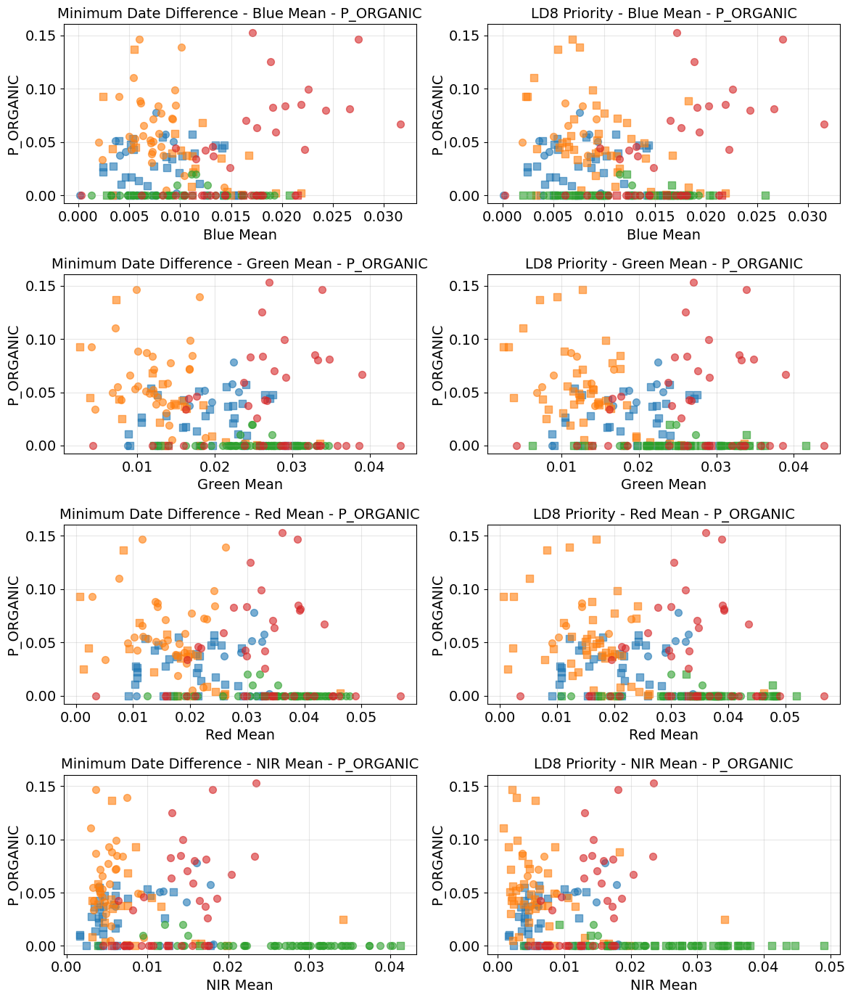

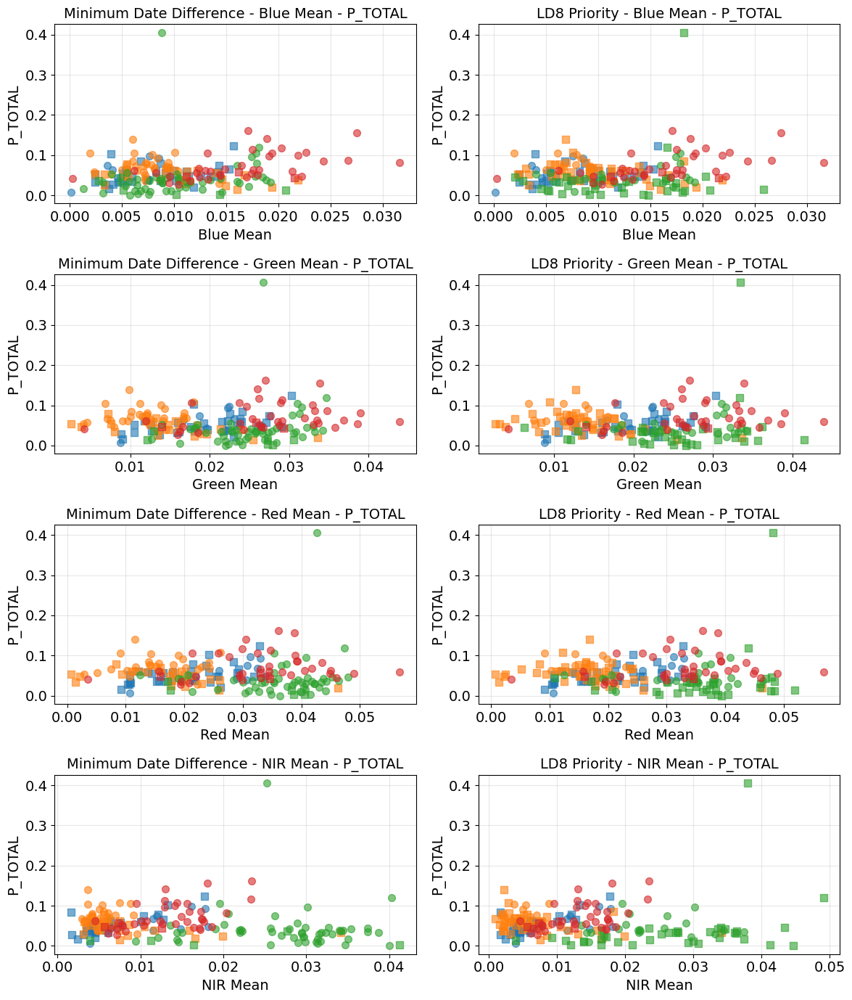

In [69]:
var_c = ['P_ORGANIC','P_TOTAL']
# Create 4x2 subplot: 4 rows (bands) x 2 columns (datasets)
# Each WATER_PERIOD gets a unique color, each satellite gets a unique marker
for var in var_c:
    fig, axes = plt.subplots(4, 2, figsize=(12, 14))

    bands = ['blue_mean', 'green_mean', 'red_mean', 'nir_mean']
    datasets = [df_minDate, df_ld8]
    titles = ['Minimum Date Difference', 'LD8 Priority']

    # Define consistent colors for each WATER_PERIOD (across all subplots)
    water_periods = sorted(df_minDate['WATER_PERIOD'].unique())
    color_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']
    colors = {period: color_palette[i % len(color_palette)] for i, period in enumerate(water_periods)}

    # Define consistent markers for each satellite
    satellites = sorted(df_minDate['satellite'].unique())
    markers = {sat: marker for sat, marker in zip(satellites, ['o', 's', '^', 'D', 'v', '<', '>', 'P'])}

    # Loop: rows = bands, columns = datasets
    for row, band in enumerate(bands):
        for col, (data, title) in enumerate(zip(datasets, titles)):
            ax = axes[row, col]
            data = data.dropna(subset=[band, var])
            
            # Create scatter plot with consistent colors and markers
            for water_period in sorted(data['WATER_PERIOD'].unique()):
                for satellite in sorted(data['satellite'].unique()):
                    subset = data[(data['WATER_PERIOD'] == water_period) & (data['satellite'] == satellite)]
                    ax.scatter(subset[band], subset[var], 
                            color=colors[water_period], 
                            marker=markers[satellite],
                            label=f'{water_period}-{satellite}', 
                            alpha=0.6,
                            s=50)
            
            if band == 'blue_mean':
                b = 'Blue Mean'
            elif band == 'green_mean':
                b = 'Green Mean'
            elif band == 'red_mean':
                b = 'Red Mean'
            elif band == 'nir_mean':
                b = 'NIR Mean'
            ax.set_xlabel(b)
            ax.set_ylabel(var)
            ax.set_title(f'{title} - {b} - {var}')
            ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

## regressions

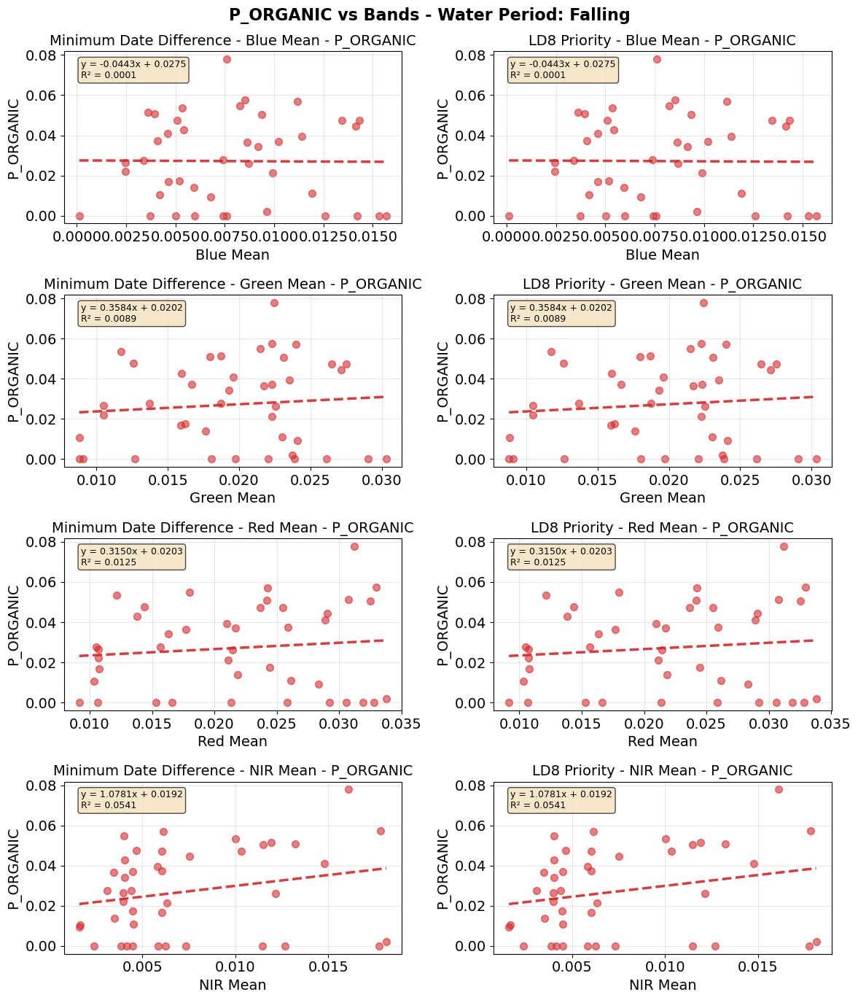

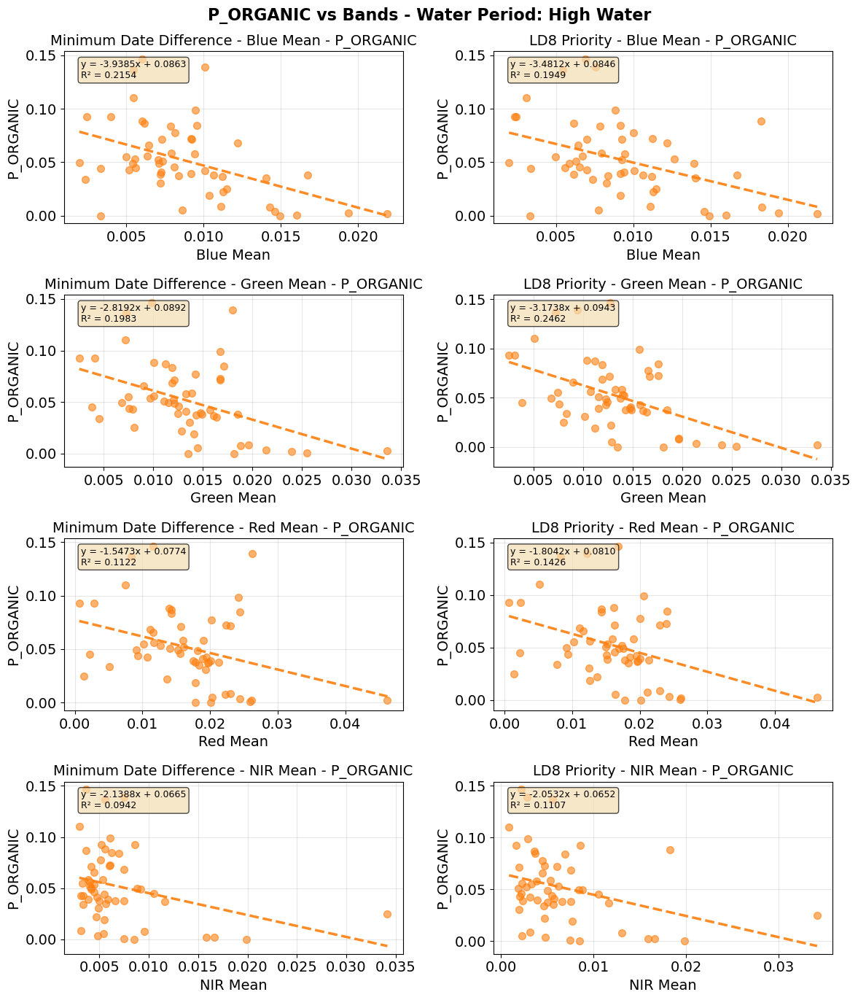

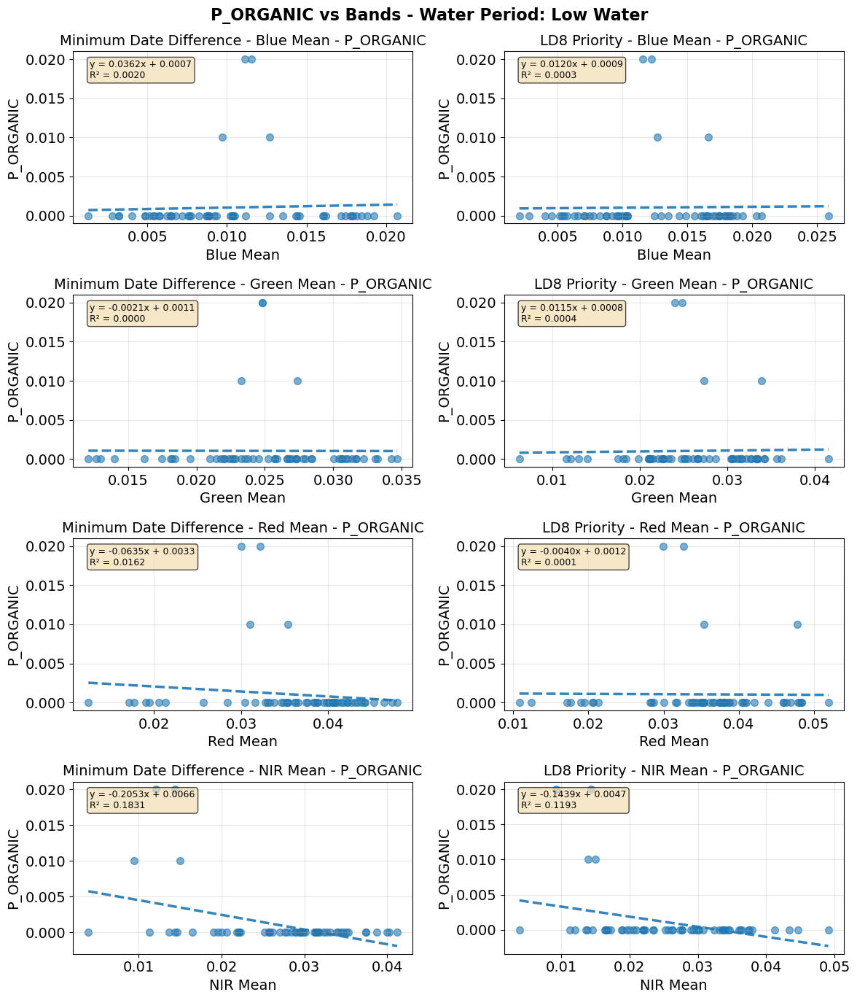

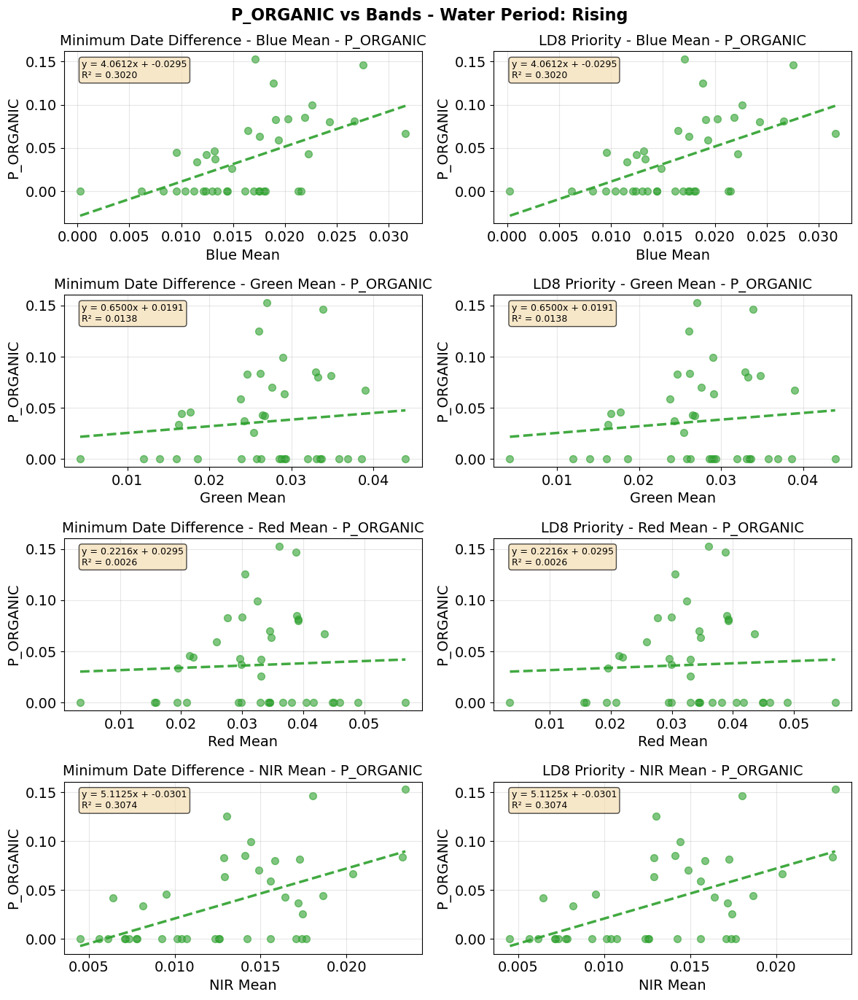

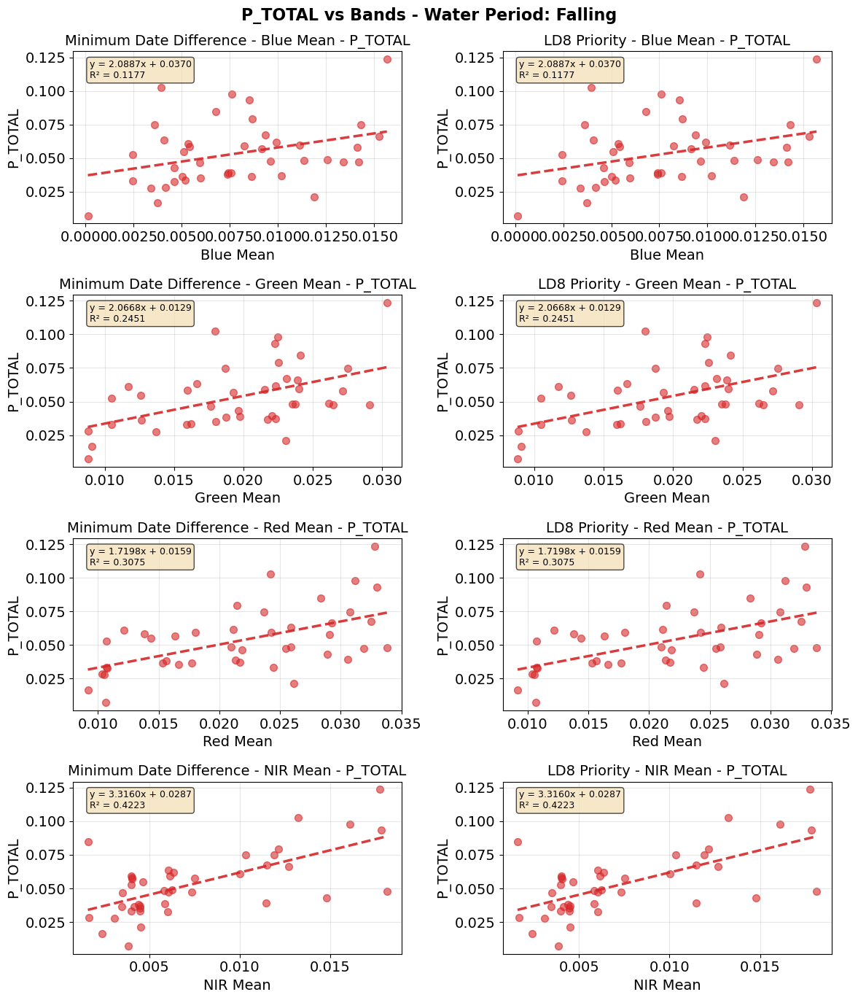

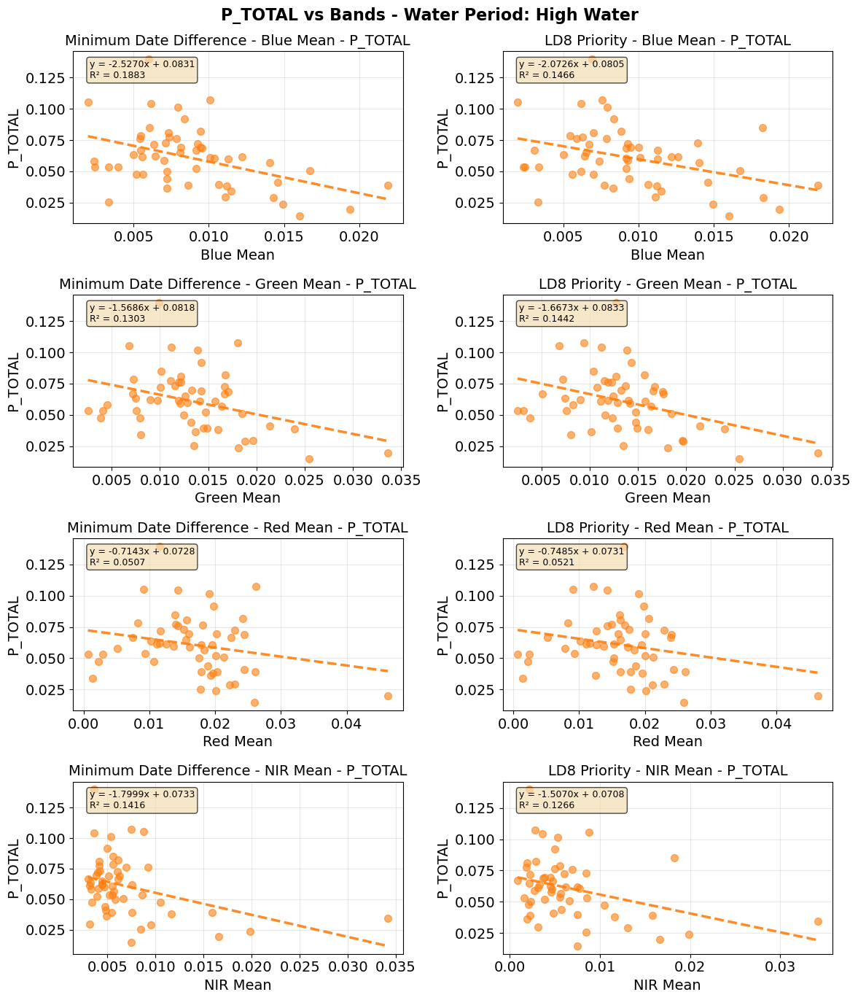

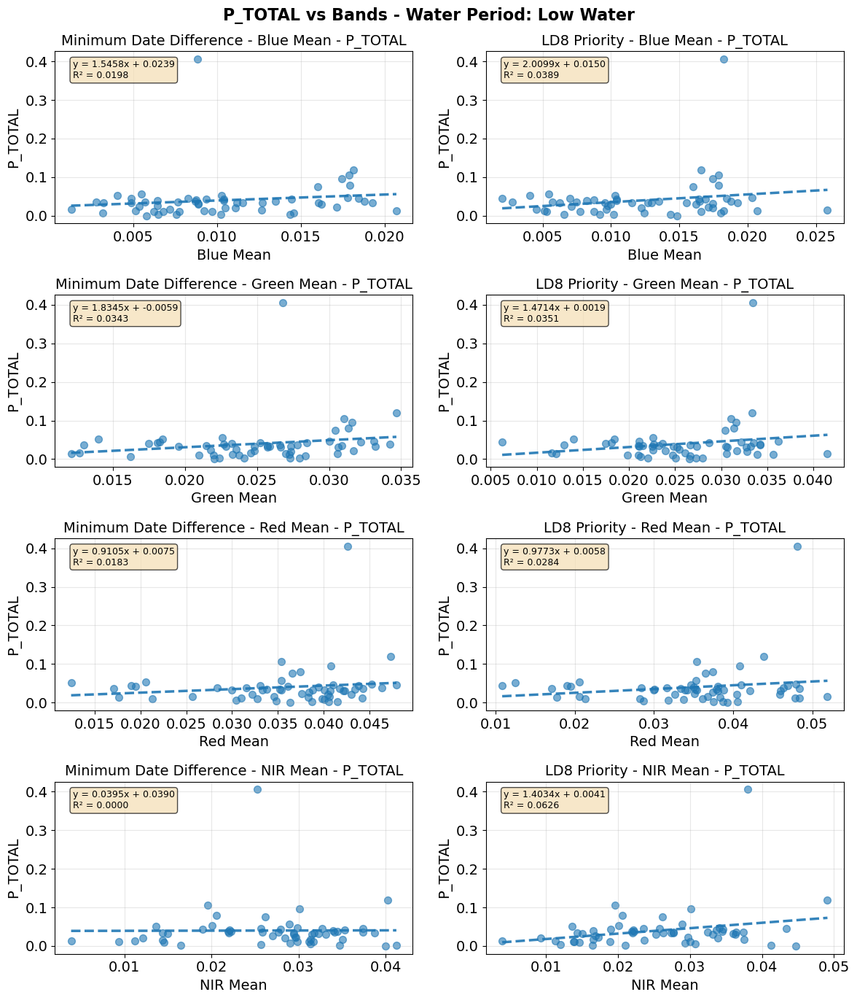

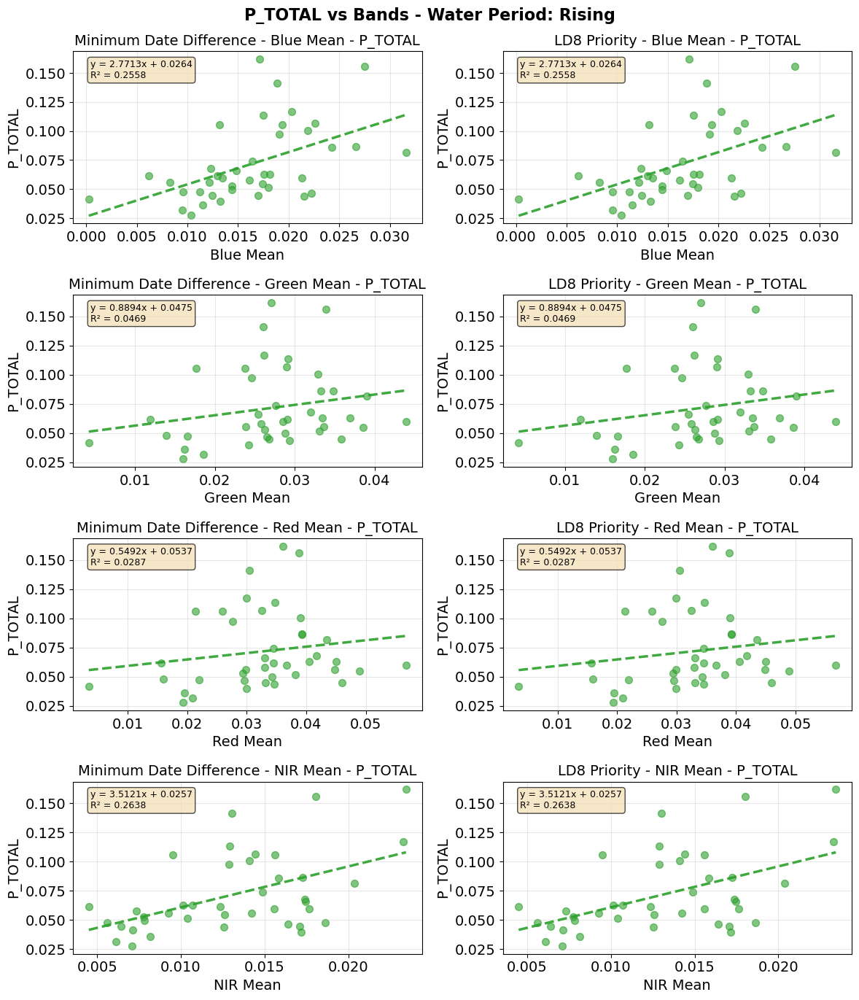

In [70]:
# Create 4x2 subplots for each WATER_PERIOD separately
# Each subplot shows scatter plot + regression line with equation and R² value

for var in var_c:

    bands = ['blue_mean', 'green_mean', 'red_mean', 'nir_mean']
    datasets = [df_minDate, df_ld8]
    titles = ['Minimum Date Difference', 'LD8 Priority']

    # Define consistent colors for each WATER_PERIOD
    water_periods = sorted(df_minDate['WATER_PERIOD'].unique())
    color_palette = ['#d62728', '#ff7f0e', '#1f77b4', '#2ca02c']
    colors = {period: color_palette[i % len(color_palette)] for i, period in enumerate(water_periods)}

    # Create a 4x2 figure for each water period
    for wp in water_periods:
        fig, axes = plt.subplots(4, 2, figsize=(12, 14))
        if  wp == "F":
            x = "Falling" 
        elif wp == "R":
            x = "Rising" 
        elif wp == "LW":
            x = "Low Water"
        else: 
            x = "High Water"
        fig.suptitle(f'{var} vs Bands - Water Period: {x}', fontsize=16, fontweight='bold')
        
        # Loop: rows = bands, columns = datasets
        for row, band in enumerate(bands):
            for col, (data, title) in enumerate(zip(datasets, titles)):
                ax = axes[row, col]
                
                # Filter data for this water period only
                subset = data[data['WATER_PERIOD'] == wp].dropna(subset=[band, var])
                
                if len(subset) > 0:
                    # Plot scatter
                    ax.scatter(subset[band], subset[var], 
                            color=colors[wp], 
                            marker='o',
                            alpha=0.6,
                            s=50)
                    
                    # Add regression line if enough data points
                    if len(subset) > 1:
                        z = np.polyfit(subset[band], subset[var], 1)
                        p = np.poly1d(z)
                        x_line = np.linspace(subset[band].min(), subset[band].max(), 100)
                        ax.plot(x_line, p(x_line), color=colors[wp], linestyle='--', linewidth=2.5, alpha=0.9)
                        
                        # Calculate R² value
                        y_pred = p(subset[band])
                        ss_res = np.sum((subset[var] - y_pred) ** 2)
                        ss_tot = np.sum((subset[var] - subset[var].mean()) ** 2)
                        r_squared = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
                        
                        # Extract slope and intercept
                        slope = z[0]
                        intercept = z[1]
                        
                        # Create equation string
                        equation = f'y = {slope:.4f}x + {intercept:.4f}'
                        r2_str = f'R² = {r_squared:.4f}'
                        
                        # Display equation and R² on plot
                        ax.text(0.05, 0.95, f'{equation}\n{r2_str}', 
                            transform=ax.transAxes, fontsize=9,
                            verticalalignment='top', 
                            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))
                if band == 'blue_mean':
                    b = 'Blue Mean'
                elif band == 'green_mean':
                    b = 'Green Mean'
                elif band == 'red_mean':
                    b = 'Red Mean'
                elif band == 'nir_mean':
                    b = 'NIR Mean'
                ax.set_xlabel(b)
                ax.set_ylabel(var)
                ax.set_title(f'{title} - {b} - {var}')
                ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()

# Silica and turbidity

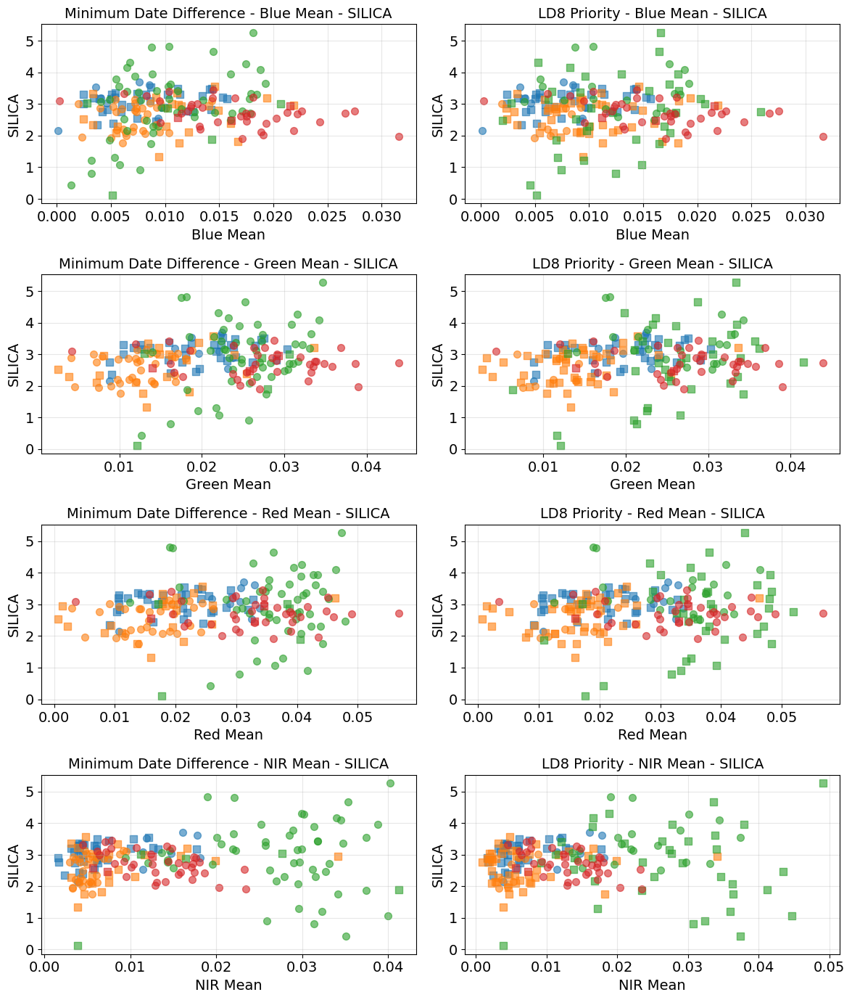

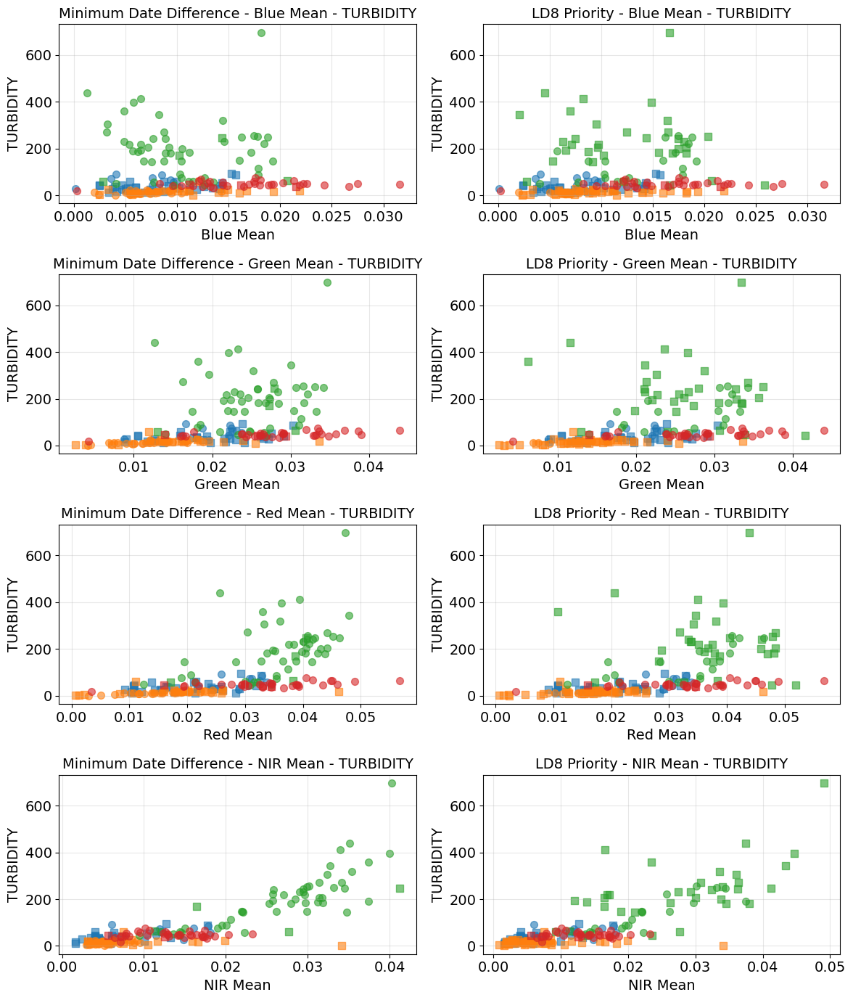

In [71]:
var_c = ['SILICA','TURBIDITY']
# Create 4x2 subplot: 4 rows (bands) x 2 columns (datasets)
# Each WATER_PERIOD gets a unique color, each satellite gets a unique marker
for var in var_c:
    fig, axes = plt.subplots(4, 2, figsize=(12, 14))

    bands = ['blue_mean', 'green_mean', 'red_mean', 'nir_mean']
    datasets = [df_minDate, df_ld8]
    titles = ['Minimum Date Difference', 'LD8 Priority']

    # Define consistent colors for each WATER_PERIOD (across all subplots)
    water_periods = sorted(df_minDate['WATER_PERIOD'].unique())
    color_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']
    colors = {period: color_palette[i % len(color_palette)] for i, period in enumerate(water_periods)}

    # Define consistent markers for each satellite
    satellites = sorted(df_minDate['satellite'].unique())
    markers = {sat: marker for sat, marker in zip(satellites, ['o', 's', '^', 'D', 'v', '<', '>', 'P'])}

    # Loop: rows = bands, columns = datasets
    for row, band in enumerate(bands):
        for col, (data, title) in enumerate(zip(datasets, titles)):
            ax = axes[row, col]
            data = data.dropna(subset=[band, var])
            
            # Create scatter plot with consistent colors and markers
            for water_period in sorted(data['WATER_PERIOD'].unique()):
                for satellite in sorted(data['satellite'].unique()):
                    subset = data[(data['WATER_PERIOD'] == water_period) & (data['satellite'] == satellite)]
                    ax.scatter(subset[band], subset[var], 
                            color=colors[water_period], 
                            marker=markers[satellite],
                            label=f'{water_period}-{satellite}', 
                            alpha=0.6,
                            s=50)
            
            if band == 'blue_mean':
                b = 'Blue Mean'
            elif band == 'green_mean':
                b = 'Green Mean'
            elif band == 'red_mean':
                b = 'Red Mean'
            elif band == 'nir_mean':
                b = 'NIR Mean'
            ax.set_xlabel(b)
            ax.set_ylabel(var)
            ax.set_title(f'{title} - {b} - {var}')
            ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

## regressions

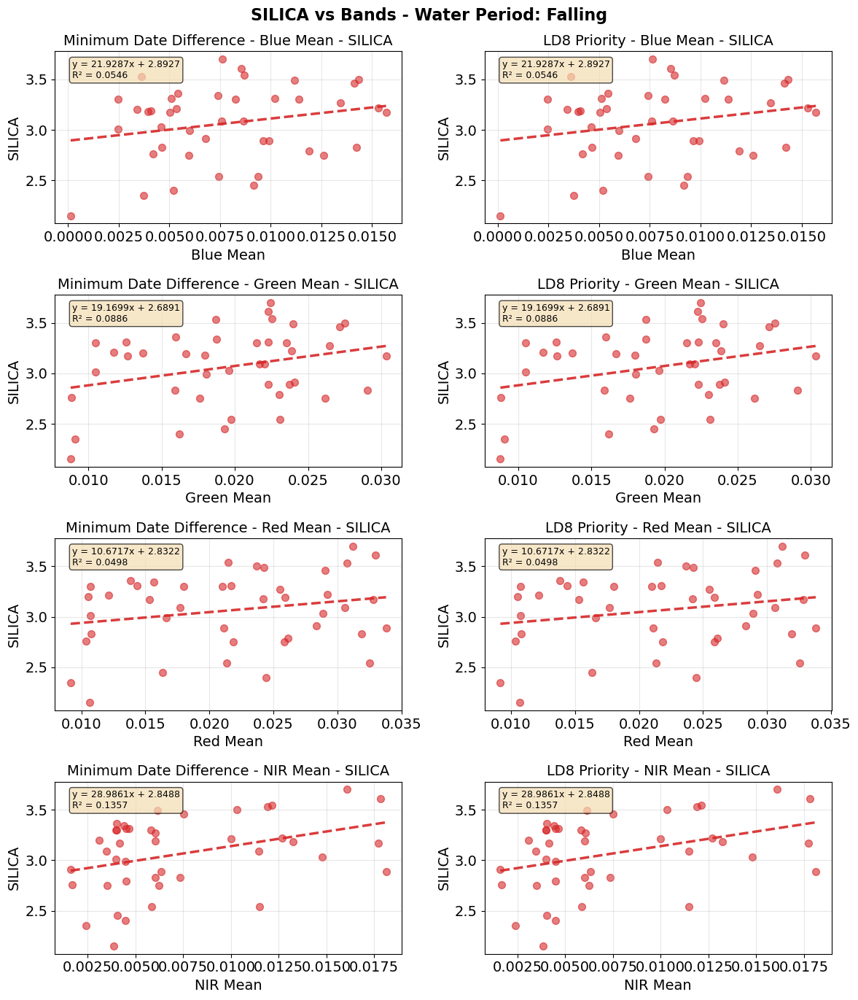

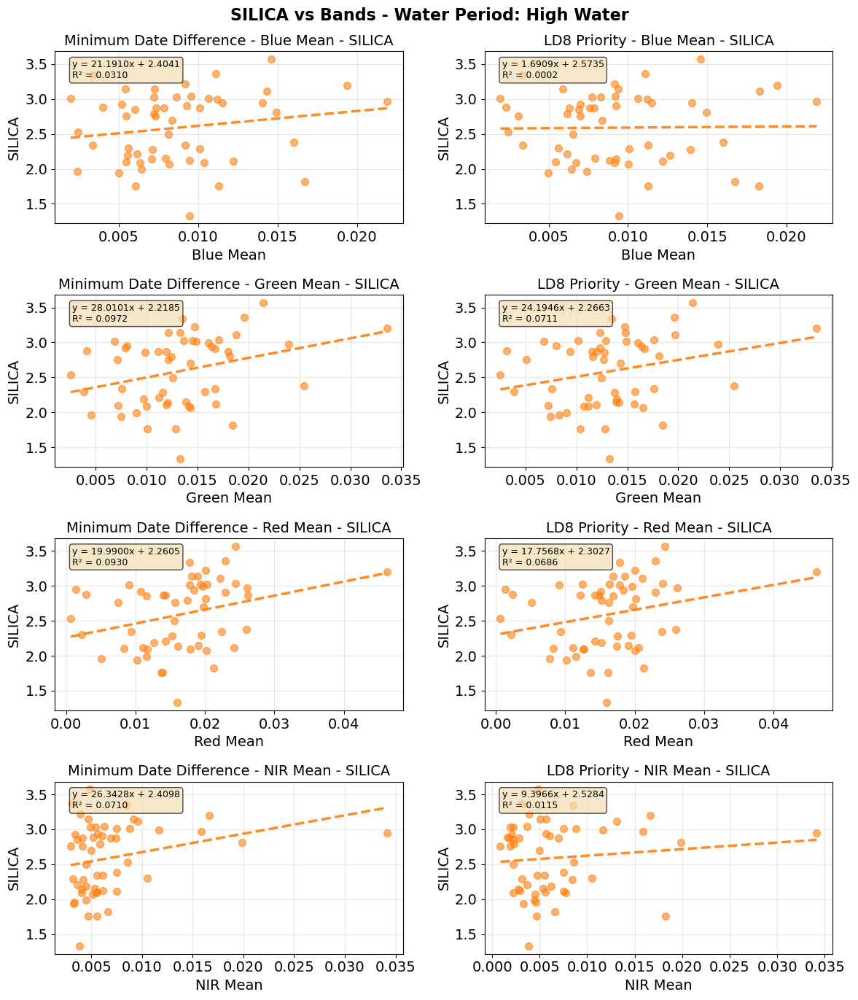

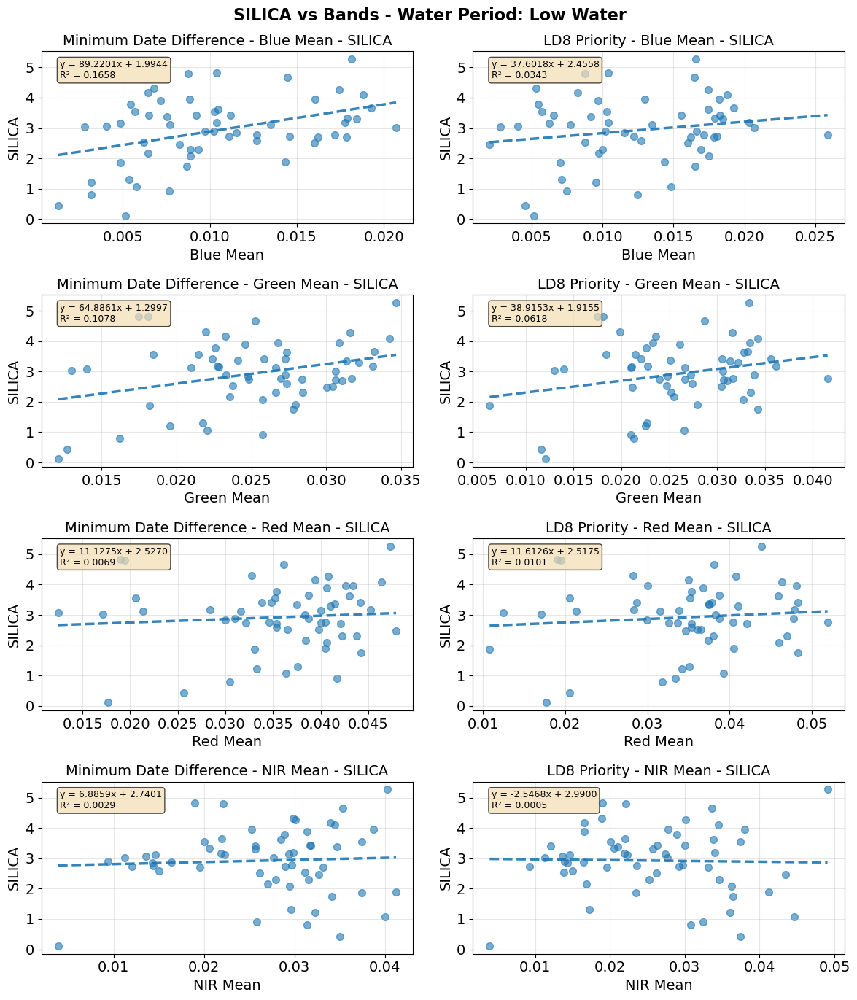

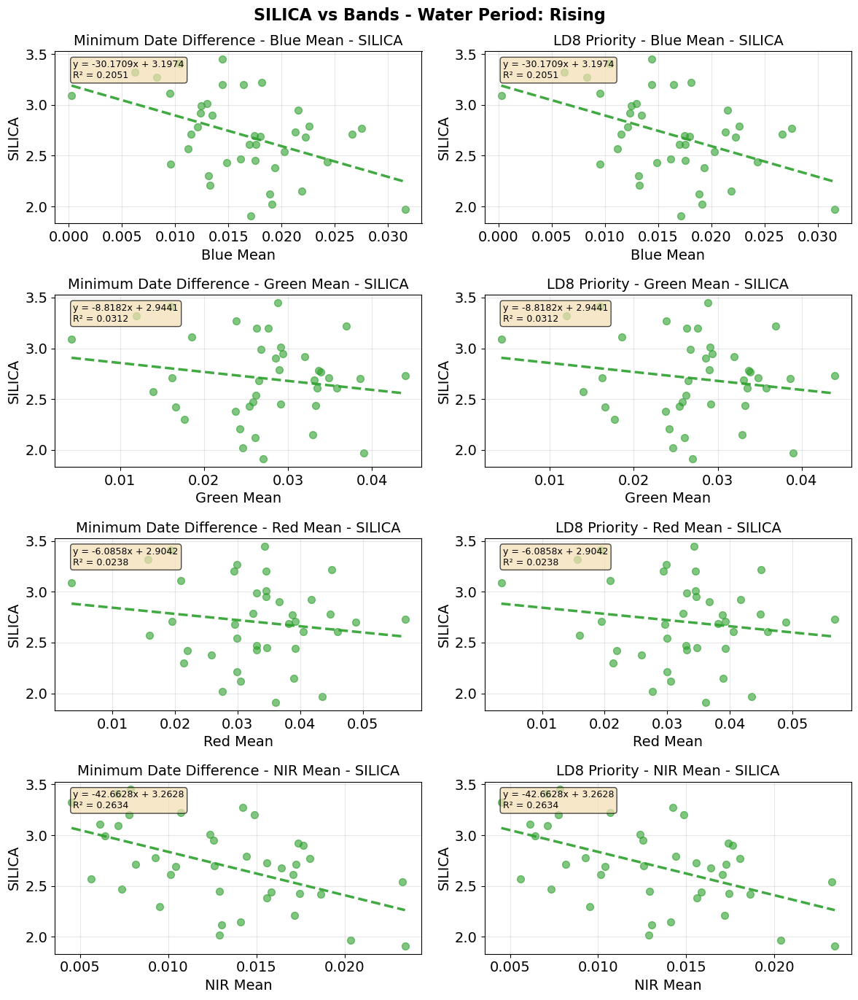

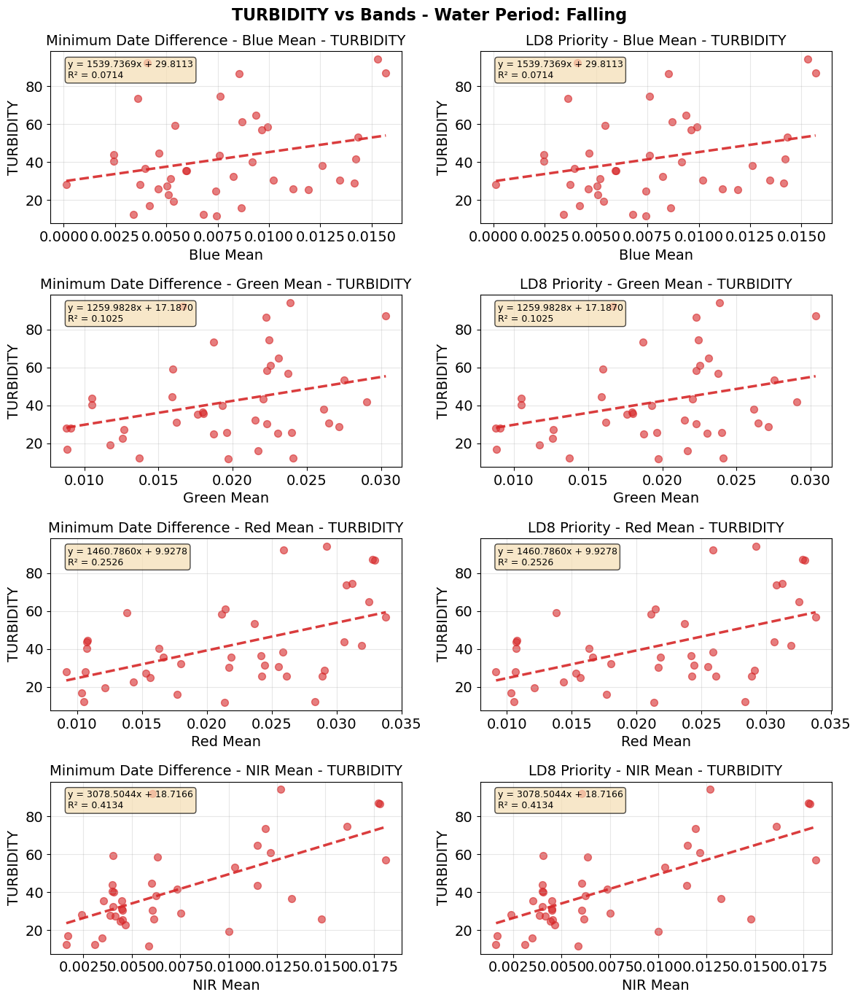

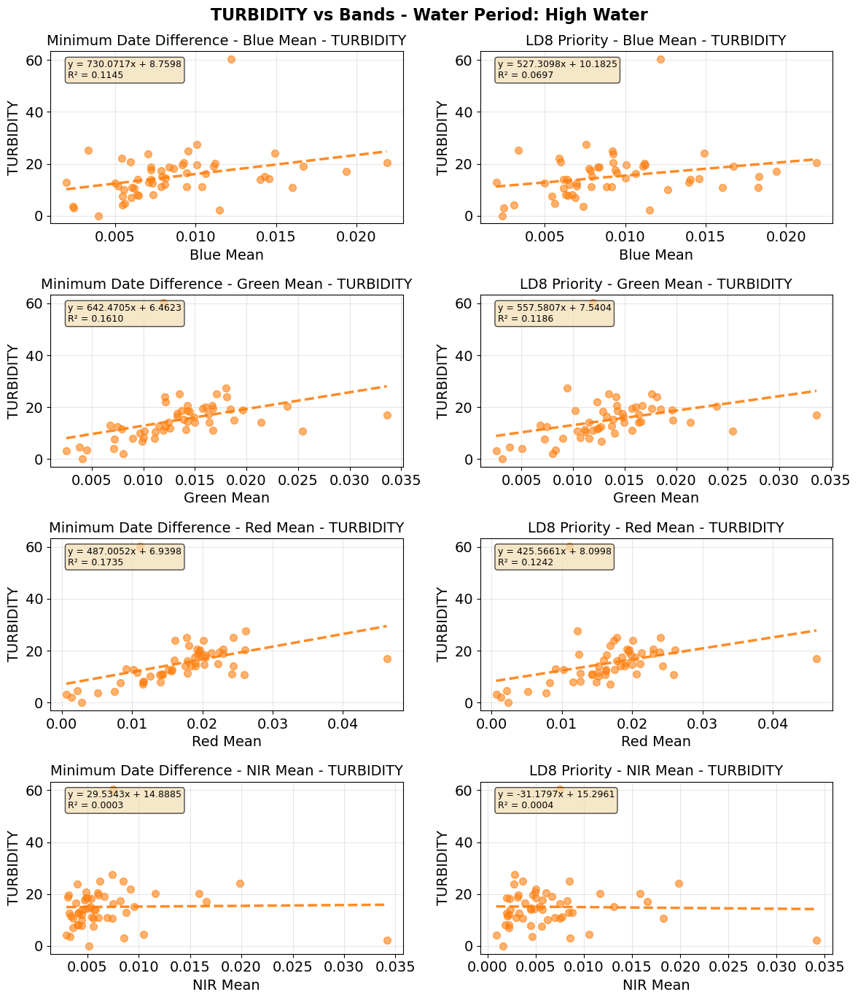

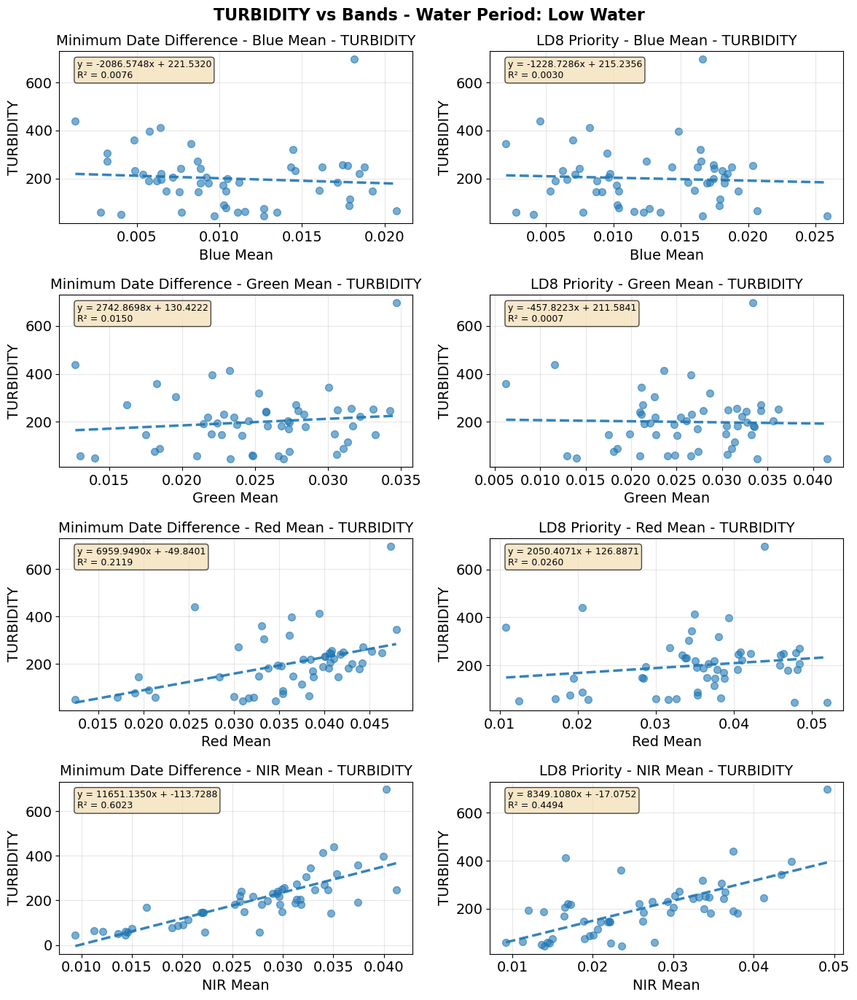

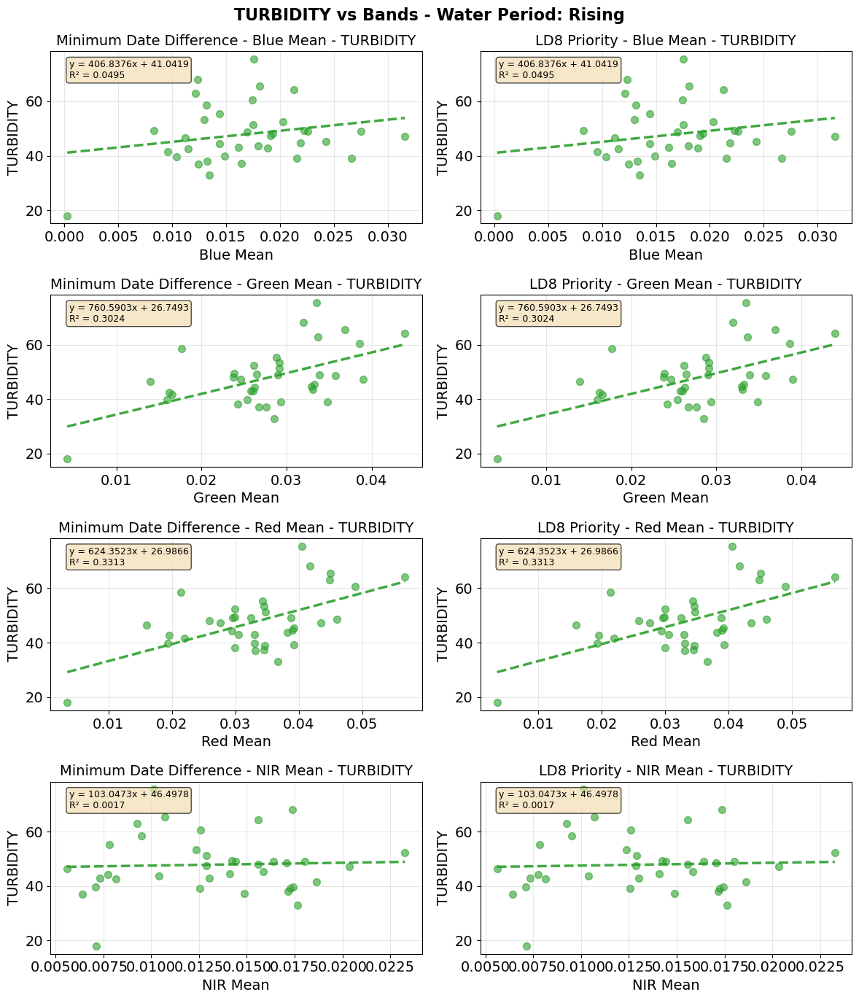

In [72]:
# Create 4x2 subplots for each WATER_PERIOD separately
# Each subplot shows scatter plot + regression line with equation and R² value

for var in var_c:

    bands = ['blue_mean', 'green_mean', 'red_mean', 'nir_mean']
    datasets = [df_minDate, df_ld8]
    titles = ['Minimum Date Difference', 'LD8 Priority']

    # Define consistent colors for each WATER_PERIOD
    water_periods = sorted(df_minDate['WATER_PERIOD'].unique())
    color_palette = ['#d62728', '#ff7f0e', '#1f77b4', '#2ca02c']
    colors = {period: color_palette[i % len(color_palette)] for i, period in enumerate(water_periods)}

    # Create a 4x2 figure for each water period
    for wp in water_periods:
        fig, axes = plt.subplots(4, 2, figsize=(12, 14))
        if  wp == "F":
            x = "Falling" 
        elif wp == "R":
            x = "Rising" 
        elif wp == "LW":
            x = "Low Water"
        else: 
            x = "High Water"
        fig.suptitle(f'{var} vs Bands - Water Period: {x}', fontsize=16, fontweight='bold')
        
        # Loop: rows = bands, columns = datasets
        for row, band in enumerate(bands):
            for col, (data, title) in enumerate(zip(datasets, titles)):
                ax = axes[row, col]
                
                # Filter data for this water period only
                subset = data[data['WATER_PERIOD'] == wp].dropna(subset=[band, var])
                
                if len(subset) > 0:
                    # Plot scatter
                    ax.scatter(subset[band], subset[var], 
                            color=colors[wp], 
                            marker='o',
                            alpha=0.6,
                            s=50)
                    
                    # Add regression line if enough data points
                    if len(subset) > 1:
                        z = np.polyfit(subset[band], subset[var], 1)
                        p = np.poly1d(z)
                        x_line = np.linspace(subset[band].min(), subset[band].max(), 100)
                        ax.plot(x_line, p(x_line), color=colors[wp], linestyle='--', linewidth=2.5, alpha=0.9)
                        
                        # Calculate R² value
                        y_pred = p(subset[band])
                        ss_res = np.sum((subset[var] - y_pred) ** 2)
                        ss_tot = np.sum((subset[var] - subset[var].mean()) ** 2)
                        r_squared = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
                        
                        # Extract slope and intercept
                        slope = z[0]
                        intercept = z[1]
                        
                        # Create equation string
                        equation = f'y = {slope:.4f}x + {intercept:.4f}'
                        r2_str = f'R² = {r_squared:.4f}'
                        
                        # Display equation and R² on plot
                        ax.text(0.05, 0.95, f'{equation}\n{r2_str}', 
                            transform=ax.transAxes, fontsize=9,
                            verticalalignment='top', 
                            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))
                if band == 'blue_mean':
                    b = 'Blue Mean'
                elif band == 'green_mean':
                    b = 'Green Mean'
                elif band == 'red_mean':
                    b = 'Red Mean'
                elif band == 'nir_mean':
                    b = 'NIR Mean'
                ax.set_xlabel(b)
                ax.set_ylabel(var)
                ax.set_title(f'{title} - {b} - {var}')
                ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()